$\newcommand{\matN}{\mathbf{N}}$
$\newcommand{\SUM}[2][]{\sum\limits_{#2}^{#1}}$
$\newcommand{\abs}[1]{|#1|}$
$\newcommand{\bzeta}{\boldsymbol\zeta}$

inv_mat = Array{Float64}(undef, 3, 3)

y = view(inv_mat, :, :)

foo = Array{Complex{Int}}(undef, 3,3)

y .= inv(real.(foo))

inv_mat

x = [1,2,3]
a, b, c = x[1], x[2], x[3]
println("a = $(a), b = $(b), c = $(c)")

# Introduction

Chris has written simulation code previously.

The purpose of this example notebook is to provide examples and explanation.

(A list of issues for improving the code should be made.)


## Tasks when rerunning entire notebook

In [1]:
taskVoxelSignalSimulation = false
taskDictionarySimulation = false

false

## Make sure there are multiple processes running

We start multiple processes to perform the simulations using the `Distributed` library. These are processes on the same machine, typically executed on separate cores. Such processes have separate Julia workspaces. Sometimes, code fails to be executed because the processes cannot find a subroutine. Therefore we start the subprocesses immediately and use `@everywhere` when defining the `LOAD_PATH` below.

By default the variables in the separate processes are local to the process. Using the `SharedArray` type from the `SharedArrays` library, an array that is accessible to all processes can be created. This library is imported here as well.

In [613]:
using Distributed, SharedArrays  
import SharedArrays: SharedArray

println("nworkers = $(nworkers())")

println("nprocs = $(nprocs())")

nWorkersDesired = 4

if nworkers()<nWorkersDesired
    addprocs(nWorkersDesired-nworkers() + (nprocs()==1 ? 1 : 0 ) )
end

theWorkers = workers()

println(theWorkers)

nworkers = 4
nprocs = 5
[2, 3, 4, 5]


## External libraries and Julia libraries

Some libraries are imported here, others when they are used.

In [3]:
# Revise can reduce the need to restart the kernel after making changes to a module
using Revise, BenchmarkTools, OrderedCollections, ProgressBars, LsqFit, SciPy, NaturalSort
 
using LinearAlgebra, Statistics

using JLD
using Colors, Plots, StatsPlots, LaTeXStrings

## Path to the simulation code.

The simulation code is spread over several local modules. The modules are in files such that the module with name "MyModule" is in a Julia file "MyModule.jl". These files are in different directories. The directories where the modules reside are added to the `LOAD_PATH` so that Julia can find them.

The `@everywhere` macro is from the library `Distributed`. It means these definitions are executed on all processes.


In [4]:
@everywhere simCodeRootDirectory = "C:/Users/Kamlesh/dir1/Thesis_KS/MrfKS/Code1/MriSimCode/"
@everywhere SimCodeDirectories = 
    simCodeRootDirectory .* 
    [ "MriBase1", "CodeForExamples1", "MriK1", "BlochSim1", "MriSim1", 
      "MrfImaging1"]
@everywhere append!(LOAD_PATH, SimCodeDirectories)

# Steps of a numerical experiment: MRF experiment

Different steps were taken in the numerical experiments. The following are the steps to simulate what would be the outcome of an MRF experiment

1. Define an *MRF sequence* (flip angles, TR and spoiling) 
This contains parameters that determine the magnetization of a single voxel: number of intervals, duration of each interval, flip angles alpha and phases phi, whether or not gradient spoiling is applied, at which time points magnetization is measured 

2. Define *computational parameters* and prepare for simulation.  
The main computational parameter is the number of isochromats in a voxel used to simulate gradient spoiling. An object called `simObj` of the type `SimEns2DData` is defined, which contains info for the simulation. **(Should set a keyword parameter to modify the number isochromats in a voxel.)**
A variable `nSamples` is the number of measurement points of the magnetization.

3. Set the size (in voxels) of the image domain: m1, m2.  
This is subsequently needed when specifying the k-space sampling parameters.

4. MRF sequence: k-space sampling parameters.

5. Choice of medium T1, T2, PD values. Other parameters are set together with computational parameters. Other parameters are constant, set in `otherPar`)

6. Simulate the magnetization as a function of time for all voxels.  
In the numerical experiments. The magnetization was simulated(for the entire MRF sequence) for all voxels and then stored. The resulting values were called `voxelSignals` or similar.
The voxel signals can be used with different k-space samplings. Therefore it is convenient to store them in a big array and save them to disk.

7. Creating the undersampled images that would be obtained in an MRF experiment.  
This results in again in a big array of size `(m1, m2, nSamples)`

8. Specifying an MRF dictionary, then simulating it and storing it in a file
This results in a big array, number of point along T1 axis times number of points along T2 axis times nSamples.

9. Obtaining MRF images by doing the dictionary based optimization applied to the "time traces" from the undersampled images.  
This results in parameters maps, T1, T2 and PD maps. 

Steps 1-5 are mainly setup, 6-9 are mainly computational


# Setup

## MRF sequence and computational parameters for the magnetization of a single voxel

We define a sequence that was used in the Stolk 2019 paper. Several examples sequences were defined, one of these was defined using `NewSeq2`. Then we plot the flip angles. 

We also run the function `SetupPerVoxelSimulationV2`. This is about the computational parameters and prepares the simulations. The output contains among others a variable `simObj` which is input for the Bloch simulation routines. The main computational parameter is the number of isochromats contained in a voxel. In the paper it was set to 128. This is quite large. It is possible to do the simulations with a smaller number, and only use the bigger number for the final results. A smaller number will result in faster simulations.


In [5]:
# module containing this code
#@everywhere 
using MriBase, MrSeq, ExampleSeq1, SimEns2D

# code from MriMrf/TestExample2/Example3/Setup_Seq2.jl

# set float type
#@everywhere 
TheFloatType = Float64

# set some sequence parameters and create sequence object
#@everywhere 
nInterval = 400
#@everywhere @everywhere 
tRConstValue = 0.015

# The following is a choice of sequence
#mrSequence = ExampleSeq1.NewSeq11(
#    TheFloatType,nInterval,tRConstValue,true,0.5*tRConstValue)

# this is another choice of sequence
#@everywhere 
mrSequence = ExampleSeq1.NewSeq2(TheFloatType, nInterval, tRConstValue, true, 0.5*tRConstValue)

# create parameters for discretization and simulation
#@everywhere 
(nSamplesPerInterval,simObj,otherPar) = ExampleSeq1.SetupPerVoxelSimulationV2(mrSequence)

# in currect implementation (20220303) must set useLogPar manually
#@everywhere 
simObj.useLogPar = true

# number of samples in a trace
#@everywhere 
nSamples = sum(nSamplesPerInterval)

400

In [6]:
simObj

SimEns2DData(128, 1, 800, 400, 2, Bool[1, 0, 1, 0, 1, 0, 1, 0, 1, 0  …  1, 0, 1, 0, 1, 0, 1, 0, 1, 0], [3.141592653589793, 0.1852418625679506, 0.2066532866415481, 0.22804536261047056, 0.24940520468805552, 0.2707199465041314, 0.29197674885523767, 0.31316280743848113, 0.33426536056436895, 0.3552716968439734  …  0.39694517071772745, 0.3761691628457974, 0.3552716968439737, 0.3342653605643693, 0.31316280743848113, 0.2919767488552377, 0.27071994650413156, 0.24940520468805574, 0.22804536261047087, 0.2066532866415481], [1.5707963267948966, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], Bool[1, 1, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [1, 2, 1, 2, 1, 2, 1, 2, 1, 2  …  1, 2, 1, 2, 1, 2, 1, 2, 1, 2], [0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075  …  0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075, 0.0075], Bool[0, 1, 0, 1, 0, 1, 0, 1, 0, 1  …  0, 1, 0, 1, 0, 1, 0, 1, 0,

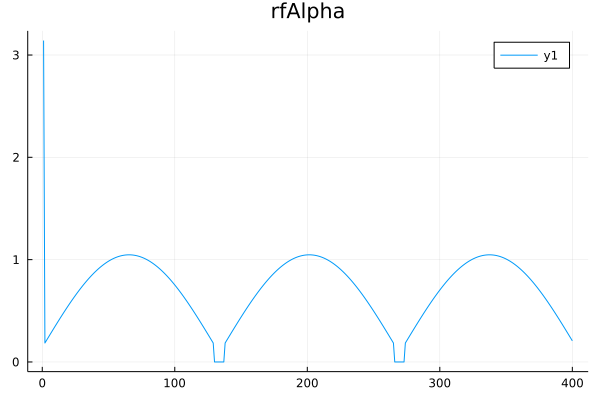

In [7]:
# x axis
x=1:nSamples

plot(x, mrSequence.rfAlpha, title="rfAlpha")

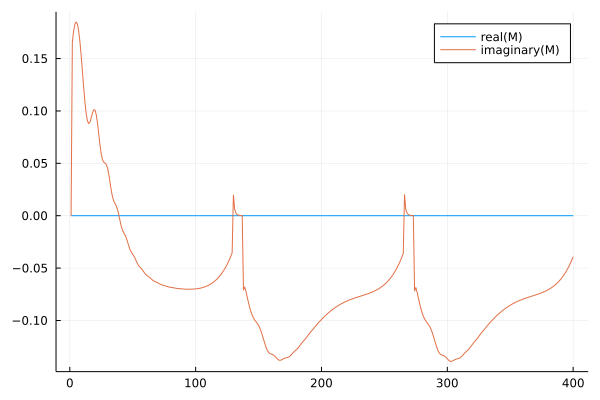

In [8]:
#@everywhere 
using MriSim2

#
# WE ARE USING LOGARITHMIC PARAMETERS FOR T1 AND T2
#

logT1Ref = log.( [ 1.0 ] )
logT2Ref = log.( [ 0.1 ] )
PDRef = [ 1.0 ]

# arrays for a simulated magnetization
#@everywhere 
signalM = Array{Complex{TheFloatType}}(undef, nSamples)

# 
MriSim2.SimT1T2M0(signalM, simObj, logT1Ref, logT2Ref, PDRef, otherPar)

# x axis
x=1:nSamples
plot(x, real.(signalM), label="real(M)")
plot!(x, imag.(signalM), label="imaginary(M)")

## Compute the partial derivatives of magnetizations ($\mathcal{D}M_j$s) using 1st order Finite Difference scheme $\left(f'(x_0)\approx\frac{f(x_0+h)-f(x_0)}{h}\right)$. 

<!-- The partial derivatives are computed around the reference parameter $\theta_0$ and denoted by the coefficents $A_j,\,B_j,\,C_j$ given as
$$
\begin{align}
A_j &= \left.\frac{\partial M_j}{\partial \log T_1}\right\rvert_{\theta=\theta_0} \\
B_j &= \left.\frac{\partial M_j}{\partial \log T_2}\right\rvert_{\theta=\theta_0} \\
C_j &= \left.\frac{\partial M_j}{\partial \rho}\right\rvert_{\theta=\theta_0}  
\end{align}
$$ -->

### Input
- `θ₀`(_array_) - an array of reference tissue parameters. 
- `signalM`(_vector_) - voxel magnetizations computed at the reference parameter $\theta_0$.
- `h`(_float_) - the step size of the Finite Difference scheme. Set to `1e-4`.

### Output
- `JacobianM_atθ₀`(_array_) - the Jacobain matrix $\mathcal{D}M$ of size `nSamples`$\times 3$, evaluated at $\theta_0$ . Columns 1, 2, 3 give the partial derivatives w.r.t to T1, T2 and PD respectively.

In [9]:
h = 1e-4
θ₀ = [logT1Ref, logT2Ref, PDRef]

#@everywhere 
JacobianM_atθ₀ = Array{Complex{TheFloatType}}(undef, nSamples, 3)

for (idx, col) = enumerate(eachcol(JacobianM_atθ₀))
    θ = copy(θ₀)
    θ[idx] =  θ₀[idx] .+ h
    signalM_2 = Array{Complex{TheFloatType}}(undef, nSamples)
    MriSim2.SimT1T2M0(signalM_2, simObj, θ[1], θ[2], θ[3], otherPar)
    col .= (signalM_2 - signalM)/h
end

In [10]:
JacobianM_atθ₀ 

400×3 Matrix{ComplexF64}:
          0.0+0.0im        …   1.13616e-16-6.95696e-33im
          0.0+0.0050497im      -5.5852e-33+0.165788im
 -6.09186e-14+0.010942im       3.02221e-18+0.175995im
 -3.79471e-14+0.0174883im      2.52077e-18+0.182565im
 -2.98156e-14+0.0244137im      6.12574e-18+0.184914im
 -3.90313e-14+0.0314412im  …   1.51788e-18+0.182951im
   8.5652e-14+0.0382423im     -8.89046e-18+0.176592im
 -1.73472e-14+0.044537im      -2.81893e-18+0.166391im
 -1.51788e-14+0.0500692im     -5.09575e-18+0.153065im
 -2.61293e-13+0.0547114im      1.34441e-17+0.137971im
  4.66207e-14+0.0584439im  …   1.19262e-18+0.122548im
 -3.14419e-14+0.0614277im      1.40946e-18+0.108575im
 -3.25261e-15+0.0639449im     -2.71051e-18+0.0974983im
             ⋮             ⋱  
  6.97955e-15+0.0475971im      3.54399e-18-0.0621977im
  3.65918e-15+0.0464477im      3.32037e-18-0.0608123im
   2.9409e-14+0.0452128im  …   7.86047e-19-0.0593138im
  1.68051e-14+0.0438872im     -4.33681e-19-0.0576937im
  1.21973e-15+0.0

using FiniteDifferences

function f(θ) 
    signalM_2 = Array{Complex{TheFloatType}}(undef, nSamples)
    MriSim2.SimT1T2M0(signalM_2, simObj, θ[1], θ[2], θ[3], otherPar)
    return signalM_2
end

jac = jacobian(central_fdm(5, 1), f, θ₀)

coeff_FiniteDifference = Array{Complex{TheFloatType}}(undef, nSamples, 3)
for (idx, col) = enumerate(eachcol(coeff_FiniteDifference))
    col .= [complex(i[1], i[2]) for i = collect(Iterators.partition(jac[1][:, idx], 2))]  
end

#inv(real.(transpose(conj(coeff_FiniteDifference)) * coeff_FiniteDifference))

 norm(coeff_FiniteDifference[:,1] .- coefficientsABC[1])
 norm(coefficientsABC[1])
 norm(coeff_FiniteDifference[:,1])

## Compute elements of the matrix $(Re N)^{-1}$

The elements of matrix $\matN$ are found using
$$
\begin{align*}
N_{p,q} = \sum_{j=1}^{N_I} \overline{\mathcal{D}M(\theta_0)_{j;p}}\mathcal{D}M(\theta_0)_{j;q}\\
\end{align*}
$$

<!-- \begin{align}
\matN &=
\begin{pmatrix}
\SUM[N_I]{j=1}\kappa_j^2\abs{A_j}^2 & \SUM[N_I]{j=1}\kappa_j^2 \overline{A_j}B_j & \SUM[N_I]{j=1}\kappa_j^2 \overline{A_j}C_j\\
\SUM[N_I]{j=1}\kappa_j^2 A_j\overline{B_j}  & \SUM[N_I]{j=1}\kappa_j^2\abs{B_j}^2 & \SUM[N_I]{j=1}\kappa_j^2 \overline{B_j}C_j\\
\SUM[N_I]{j=1}\kappa_j^2 A_j\overline{C_j} & \SUM[N_I]{j=1}\kappa_j^2 B_j\overline{C_j} & \SUM[N_I]{j=1}\kappa_j^2\abs{C_j}^2
\end{pmatrix}
\end{align} -->

### Inputs
- `kappa`(_vector_) - a vector of scaling factors of size `nSamples`.
- `Jacob_M`(_array_) - the Jacobain matrix $\mathcal{D}M$ evaluated at $\theta_0$ .
- `FloatType`(_datatype_) - set to `Float64`. 

### Output
- `ReN_Inverse`(_array_) - the output matrix $(Re N)^{-1}$ of size $3\times3$ 

##### look into BLAS function & also do profiling 

In [11]:
using MrfOptim

┌ Info: Precompiling MrfOptim [top-level]
└ @ Base loading.jl:1423


In [12]:
# function Compute_ReN_Inverse(kappa, Jacob_M, FloatType)
#     N = Array{Complex{FloatType}}(undef, 3, 3)
#     scaled_jacobianM = kappa .* Jacob_M
#     N .= transpose(conj(scaled_jacobianM)) * scaled_jacobianM
#     ReN_Inverse = inv(real.(N))
#     return ReN_Inverse
# end

Compute_ReN_Inverse (generic function with 1 method)

In [13]:
random_kappa = rand(TheFloatType, nSamples)
ReN_Inverse = Compute_ReN_Inverse(random_kappa, JacobianM_atθ₀, TheFloatType)

3×3 Matrix{Float64}:
 3.53589   1.29744   1.38161
 1.29744  12.1844   -5.19273
 1.38161  -5.19273   4.21443

In [14]:
MrfOptim.Compute_ReN(random_kappa, JacobianM_atθ₀, TheFloatType)

3×3 Matrix{Float64}:
 3.53589   1.29744   1.38161
 1.29744  12.1844   -5.19273
 1.38161  -5.19273   4.21443

## Combine the above coefficients into $\nu$. 

We combine the coefficient arrays $(Re N)^{-1}$ and $\mathcal{D}M_j$ found above to compute the coefficient array $\nu_j$ given as (__Note: we denote the individual entries from the $(Re N)^{-1}$ array with $\beta$__)

\begin{align*}
    \nu^{(1)}_j &= \beta_{p,1}\abs{A_j}^2 + \beta_{p,2}A_j\overline{B_j} + \beta_{p,3}A_j\overline{C_j}\\
    \nu^{(2)}_j &= \beta_{p,1}\overline{A_j}B_j + \beta_{p,2}\abs{B_j}^2 + \beta_{p,3}B_j\overline{C_j}\\
    \nu^{(3)}_j &= \beta_{p,1}\overline{A_j}C_j + \beta_{p,2}\overline{B_j}C_j + \beta_{p,3}\abs{C_j}^2\\
    \nu^{(0)}_j &= M_j(\theta_0)(\beta_{p,1}\overline{A_j} + \beta_{p,2}\overline{B_j} + \beta_{p,3}\overline{C_j})
\end{align*}

where, the partial derivatives of $M$ w.r.t to each tissue parameter are denoted by $A,\,B,\,C$ given as
$$
\begin{align}
A &= \mathcal{D}M[:, 1]\text{ (deriv wrt to T1)}\\
B &= \mathcal{D}M[:, 2]\text{ (deriv wrt to T2)}\\
C &= \mathcal{D}M[:, 3]\text{ (deriv wrt to PD)}
% A_j &= \left.\frac{\partial M_j}{\partial \log T_1}\right\rvert_{\theta=\theta_0} \\
% B_j &= \left.\frac{\partial M_j}{\partial \log T_2}\right\rvert_{\theta=\theta_0} \\
% C_j &= \left.\frac{\partial M_j}{\partial \rho}\right\rvert_{\theta=\theta_0}  
\end{align}
$$

### Input
- `M₀`(_array_) - voxel magnetizations computed at the reference parameter $\theta_0$.
- `ReN_Inv`(_array_) - the matrix $(Re N)^{-1}$ of size $3\times3$
- `jacM`(_array_) - the Jacobain matrix $\mathcal{D}M$ of size `nSamples`$\times 3$, evaluated at $\theta_0$.
- `FloatType`(_datatype_) - set to `Float64`
- `p`(_integer_)  - an integer corresponding to a parameter. Accepts values 1,2 and 3 corresponding to T1, T2 and PD respecitvely

### Output
- `(νⱼ¹, νⱼ², νⱼ³, νⱼ⁰)` (_tuple of vectors_) -  a tuple of vectors containing real part of the coefficients $\nu$ as defined above. Each $\nu$ is a vector of length `nSamples`

In [15]:
# function Compute_ν(M₀, ReN_Inv, jacM, FloatType; p=1)

#     A, B, C = jacM[:, 1], jacM[:, 2], jacM[:, 3]
#     A_abs2, B_abs2, C_abs2 = abs2.(A), abs2.(B), abs2.(C)
#     A_conj, B_conj, C_conj = conj.(A), conj.(B), conj.(C)
#     βₚ₁, βₚ₂, βₚ₃ = ReN_Inv[p,:]
    
#     νⱼ¹ = Array{Complex{FloatType}}(undef, nSamples) 
#     νⱼ² = Array{Complex{FloatType}}(undef, nSamples)
#     νⱼ³ = Array{Complex{FloatType}}(undef, nSamples)
#     νⱼ⁰ = Array{Complex{FloatType}}(undef, nSamples)

#     νⱼ¹ .= (βₚ₁ .* A_abs2) .+ (βₚ₂ .* A .* B_conj) .+ (βₚ₃.* A .* C_conj)
#     νⱼ² .= (βₚ₁ .* A_conj .* B) .+ (βₚ₂ .* B_abs2) .+ (βₚ₃ .* B .* C_conj)
#     νⱼ³ .= (βₚ₁ .* A_conj .*C) .+ (βₚ₂ .* B_conj .* C) .+ (βₚ₃ .* C_abs2)
#     νⱼ⁰ .= M₀ .*((βₚ₁ .* A_conj) .+ (βₚ₂ .* B_conj) .+ (βₚ₃ .* C_conj))
    
#     return real.(νⱼ¹) , real.(νⱼ²),  real.(νⱼ³), real.(νⱼ⁰)
# end

#@btime Compute_ν(signalM, ReN_Inverse, JacobianM_atθ₀, TheFloatType; p=1)

Compute_ν (generic function with 1 method)

In [16]:
Compute_ν(signalM, ReN_Inverse, JacobianM_atθ₀, TheFloatType; p=1)

([0.0, 0.001328280275211678, 0.0032713369792809685, 0.00579456891417806, 0.00874325538379462, 0.011878412586440328, 0.01487485729775579, 0.017432928433669316, 0.019312685988842972, 0.020467701047419552  …  0.0020556253726517083, 0.001977363492472603, 0.0018899488081759097, 0.0017934223432047969, 0.0016879461113035936, 0.0015738273932250292, 0.001451550181330859, 0.001321812995764993, 0.0011855762267320496, 0.0010441184850173214], [1.431733000244947e-33, 0.003270524535849758, 0.003946123275060675, 0.004410096917004358, 0.004506360814162348, 0.0040352769599995295, 0.0029261844996818706, 0.0012247295889119432, -0.000831339074068245, -0.002875668258806203  …  -0.001137255118384444, -0.001056195120742805, -0.0009726698244094268, -0.0008872611882917935, -0.0008006228813296685, -0.0007134826133736701, -0.0006266434235411926, -0.0005409842491429634, -0.000457458646955461, -0.0003770918271415873], [1.9090656252913525e-32, 0.04360901067772262, 0.052617410490528635, 0.060490921515819446, 0.066223

In [17]:
MrfOptim.Compute_Nu(signalM, ReN_Inverse, JacobianM_atθ₀, nSamples, TheFloatType; p=1)

([0.0, 0.001328280275211678, 0.0032713369792809685, 0.00579456891417806, 0.00874325538379462, 0.011878412586440328, 0.01487485729775579, 0.017432928433669316, 0.019312685988842972, 0.020467701047419552  …  0.0020556253726517083, 0.001977363492472603, 0.0018899488081759097, 0.0017934223432047969, 0.0016879461113035936, 0.0015738273932250292, 0.001451550181330859, 0.001321812995764993, 0.0011855762267320496, 0.0010441184850173214], [1.431733000244947e-33, 0.003270524535849758, 0.003946123275060675, 0.004410096917004358, 0.004506360814162348, 0.0040352769599995295, 0.0029261844996818706, 0.0012247295889119432, -0.000831339074068245, -0.002875668258806203  …  -0.001137255118384444, -0.001056195120742805, -0.0009726698244094268, -0.0008872611882917935, -0.0008006228813296685, -0.0007134826133736701, -0.0006266434235411926, -0.0005409842491429634, -0.000457458646955461, -0.0003770918271415873], [1.9090656252913525e-32, 0.04360901067772262, 0.052617410490528635, 0.060490921515819446, 0.066223

## Compute the PSF dependent terms $\widehat{P_j}(\zeta)-\widehat{P}(\zeta)$ at each k-space location $(\zeta)$. We denote these terms by $Y_j(\zeta)$. 

We do the following steps sequentially 

- Set some experimental parameters like grid size `m1`, `m2` and the subsampling factor `nSubSampling`.
- Initialize the k-space sampling object.
- Compute the cartesian coordinates of all the $k$-space sampling locations on the grid.
- Compute the indicator function $k_{s,j}$ at each $k$-space locations for each snapshot.
- Compute $Y_j(\zeta)$  
<!-- - We form a list of groups of $(k_x, k_y)$ points sampled simultaneously. 
Let $M$ groups were formed, with $\alpha$ denoting the group index. $\alpha\in[1,2,\dots M]$  -->

In [18]:
using MriK4 , Query

# domain size in paper was 128x128
# needs to big enough to be "relevant". On the other hand, smaller values make the computations more feasible
#@everywhere 
m1 = 64  #128
#@everywhere 
m2 = 64  #128

# fixed choice of subsampling parameter
nSubSampling = 16

16

## Initialize the cartesian sampling object

In [19]:
#@everywhere 
mriKParCartesian = Array{Any}(undef, 0)

# number of lines in snapshot
nLinesPerSnapshot = div(m1,nSubSampling)

# iShift refers to the position of the first line
# each subsequent snapshot, the pattern is shifted by 1
for iShift = 1:nSubSampling
    i2Lines = [ 1+mod(-1+iShift+j+nSubSampling*k,m2) for
                j=1:nInterval, k=0:nLinesPerSnapshot-1 ]
    #println("i2lines: $(i2Lines)")
    theMriK = MriK4.MriKCartesian(TheFloatType,m1,m2,i2Lines)
    push!(mriKParCartesian,theMriK)
end

mriKParCartesian[1].i2Lines

400×4 Matrix{Int64}:
  2  18  34  50
  3  19  35  51
  4  20  36  52
  5  21  37  53
  6  22  38  54
  7  23  39  55
  8  24  40  56
  9  25  41  57
 10  26  42  58
 11  27  43  59
 12  28  44  60
 13  29  45  61
 14  30  46  62
  ⋮          
  6  22  38  54
  7  23  39  55
  8  24  40  56
  9  25  41  57
 10  26  42  58
 11  27  43  59
 12  28  44  60
 13  29  45  61
 14  30  46  62
 15  31  47  63
 16  32  48  64
 17  33  49   1

<!-- ## Get cartesian coordinates on the $k$-space grid

### Input
- vector of size `m1` containing all the k-space coordiantes along kAxis1.
- vector of size `m2` containing all the k-space coordiantes along kAxis2.

### Output
- `all_kSpace_coords`(_array_) - an array of size `𝑚1×𝑚2` containing a cartesian product of the inputs. The simple cartesian product is transposed to correspond with the i2Lines. This means 1st row of array corresponds to $i2 = 1$ line and so on.   -->

### Compute the i2Line corresponding to the centre of $k$-space

#### Input
`mriKParCartesian`(_juliaobject_) - k-space sampling object. 
#### Output
`i2_0`(_integer_) - the i2 line corresponding to the centre of k-space.

In [20]:
i2_0 = findall(x -> mriKParCartesian[1].kAxis2[x] == 0, 1:length(mriKParCartesian[1].kAxis2))
@assert length(i2_0) == 1 "multiple k_y = 0 found. Aborting!!"
i2_0 = i2_0[1]
println("centre of k-space at i2Line no:$i2_0")

centre of k-space at i2Line no:33


In [21]:
#@everywhere i2_0 = 33

## Compute $k_{s,j}$ at each k-space location $\zeta$ for each snapshot $j$. 

The function $k_{s,j}$ is defined as  
$$
\begin{align*}
k_{s,j} = \begin{cases} 
& 1 \text{ ,if k-space sampled at time }j\\
& 0 \text{ ,otherwise}
\end{cases}
\end{align*}
$$

### Input
- `mriKParCartesian[1].i2Lines` (_array_) - an array of size `nSamples x nLinesPerSnapshot`. Each row corresponds to a single snapshot and each entry within a row refers to the i2line which is sampled. 

### Output
- `CartesianIndicatorFunction`(_dictionary_) - a dictionary that maps snapshots to $k_{s,j}$. Each entry in `K_sj_dict` is a $m_1\times m_2$ sparse matrix that has $1$s in the columns given by the i2Line numbers for a particular snapshot $j$. 
For instance, `K_sj_dict[1]` would have $1$s in the column $2,18,34,\text{ and }50$ which are the i2Lines (sampled lines) for $j=1$.


**change naming for K_sj_dict (cartesian sampling)**

In [22]:
#@everywhere 
using SparseArrays

In [23]:
#@everywhere 
CartesianIndicatorFunction = Dict([(i, spzeros(m1, m2)) for i=1:nSamples]) #CartesianIndicatorFunction

for j=1:nSamples
    i2SnapshotJ = mriKParCartesian[1].i2Lines[j, :] 
    #The numbers in i2SnapshotJ indicate the nonzero lines in K_s,j     
    for k in i2SnapshotJ 
        CartesianIndicatorFunction[j][:, k] .= 1.0
    end
end
#CartesianIndicatorFunction

In [622]:
CartesianIndicatorFunction

Dict{Int64, SparseMatrixCSC{Float64, Int64}} with 400 entries:
  56  => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  35  => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  60  => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  220 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  308 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  67  => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  215 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  73  => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  319 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  251 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  115 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10  …  55, 56, 57, 58, 59, 60, 61, …
  112 => sparse([1, 2, 3, 4, 5, 6, 7, 8, 9, 10

In [638]:
MrfOptim.CartesianIndicatorFunction(mriKParCartesian[1]) == CartesianIndicatorFunction

true

## Compute the PSF dependent coefficient, $Y_j(\zeta)$

The $Y_j(\zeta)$ are computed as 
$$
\begin{align*}
Y_j(\zeta) &= \widehat{P_j}(\zeta)-\widehat{P}(\zeta)\\
&= k_{s,j}(\zeta) - \frac{1}{N_I}\sum_{j=1}^{N_I}\widehat{P_j}(\zeta)\\
&= k_{s,j}(\zeta) - \frac{1}{N_I}\sum_{j=1}^{N_I}k_{s,j}(\zeta)
\end{align*}
$$


### Input parameters
- `CartesianIndicatorFunction`(_dictionary of sparse array_)- the computed $k_{s,j}$s for all snapshots (defined above).
<!-- - `all_kSpace_coords` (_array_) - $m_1\times m_2$ array containing cartesian coordiantes of all the k-space locations on the grid. -->
- `FloatType`(data type) - set to `Float64` at the start of notebook

### Output
- `PSF_coefficients` (_array_)- a 2-D array of size `nSamples x (m1xm2)` containing the PSF dependent function $Y_j(\zeta)$ values at each k-space location for each snaphot. 

#### do the grouping with i2Lines 

In [24]:
#@everywhere 
function Compute_Yⱼ(k_sj, FloatType)  
    factor = 1/nSamples
    Yⱼ = Array{FloatType}(undef, nSamples, m1*m2)    
    summed_vals = Vector{FloatType}(undef, m1*m2)   
    
    for k=1:(m1*m2)        
        summed_vals[k] = factor * (sum(broadcast(x -> k_sj[x][k], 1:nSamples)))
    end
    
    for i = 1:nSamples   #tqdm(1:nSnaps)
        for j=1:(m1*m2)     
            Yⱼ[i,j] = k_sj[i][j] - summed_vals[j]             
        end
    end
    return Yⱼ     
end

Compute_Yⱼ (generic function with 1 method)

In [25]:
#@everywhere 
PSF_coefficients = Compute_Yⱼ(CartesianIndicatorFunction, TheFloatType)  

400×4096 Matrix{Float64}:
 -0.0625  -0.0625  -0.0625  -0.0625  …  -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625  …  -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625  …  -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625
 -0.0625  -0.0625  -0.0625  -0.0625     -0.0625  -0.0625  -0.0625  -0.0625

In [639]:
MrfOptim.Compute_Yⱼ(CartesianIndicatorFunction, mriKParCartesian[1]) == PSF_coefficients

true

In [640]:
###SANITY CHECK
sum(PSF_coefficients, dims=1)

1×4096 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0

## Grouping of k-space coordinates (zetas)
<!-- Group of k-space points with identical $\epsilon_2$(Type2) error contributions to the residual. -->
- Because the cartesian sampling scheme is periodic, many error terms in the final residual will be redundant and can be removed by identifying these identical terms.
- We group the k-space points based on the condition whether they were sampled or not. 

<!-- The grouping is done as follows: 

- A custom function `Group_Array` takes as input an array or a vector(1-D array) and return the indices of array with identical elements. (__Note:__ For 2-D arrays the returned indices are in a column major format which is the convention in Julia) 
- The grouped indices are used to fill a Julia `DataFrame` table of size `(m1xm2) x nSamples` 
- For Type2 errors there are 2 groups found for each snapshot. Ones that are sampled and others that are not. The sampled indices are filled with `1.0` and non-sampled with `-1.0`.
- Finally we find the duplicate rows in the dataframe to get the unique $\zeta$s which can be used as group representatives.  -->


### Inputs
- `PSF_coefficients`(_array_) - an array of coefficent $Y_j$ found above.

### Outputs
- `zeta_groups`(_dictionary of vector_) -  a dictionary with group as keys and a vector of k-space coordinates(zetas) as values.

In [27]:
#@everywhere 
using OrderedCollections

In [28]:
#@everywhere 
zeta_groups = OrderedDict{String, Vector{Int64}}()
for idx = 1:nSubSampling 
    zeta_groups["G$idx"] = [(i-1)*m1 + 1 for i in [idx + (j-1)*nSubSampling for j = 1:nLinesPerSnapshot]]
end
zeta_groups

OrderedDict{String, Vector{Int64}} with 16 entries:
  "G1"  => [1, 1025, 2049, 3073]
  "G2"  => [65, 1089, 2113, 3137]
  "G3"  => [129, 1153, 2177, 3201]
  "G4"  => [193, 1217, 2241, 3265]
  "G5"  => [257, 1281, 2305, 3329]
  "G6"  => [321, 1345, 2369, 3393]
  "G7"  => [385, 1409, 2433, 3457]
  "G8"  => [449, 1473, 2497, 3521]
  "G9"  => [513, 1537, 2561, 3585]
  "G10" => [577, 1601, 2625, 3649]
  "G11" => [641, 1665, 2689, 3713]
  "G12" => [705, 1729, 2753, 3777]
  "G13" => [769, 1793, 2817, 3841]
  "G14" => [833, 1857, 2881, 3905]
  "G15" => [897, 1921, 2945, 3969]
  "G16" => [961, 1985, 3009, 4033]

In [29]:
#@everywhere 
zeta_groupsRepr = [vals[1] for vals in values(zeta_groups)]

16-element Vector{Int64}:
   1
  65
 129
 193
 257
 321
 385
 449
 513
 577
 641
 705
 769
 833
 897
 961

In [30]:
#@everywhere zeta_groupsRepr_lambda0 = reduce(vcat, values(zeta_groups))

In [31]:
#@everywhere 
zeta_groupsRepr_lambda0 = vcat(values(zeta_groups)...)

64-element Vector{Int64}:
    1
 1025
 2049
 3073
   65
 1089
 2113
 3137
  129
 1153
 2177
 3201
  193
    ⋮
  833
 1857
 2881
 3905
  897
 1921
 2945
 3969
  961
 1985
 3009
 4033

In [32]:
# function returns indices of array that have identical elemnts.
# Group_Array(A) = 1:length(A) |> @groupby(A[_]) |> collect

In [33]:
# deduplicatedPSF_coefficients = hcat(unique(eachcol(PSF_coefficients))...);
#deduplicatedPSF_coefficients

In [34]:
# zeta_groups = Dict{String, Vector{Int64}}()
# for (col_idx, col) = enumerate(eachcol(deduplicatedPSF_coefficients))
#     duplicate_idxs = findall(broadcast(c->isequal(col, c), eachcol(PSF_coefficients)))
#     zeta_groups["G$(col_idx)"] = duplicate_idxs
# end

In [35]:
# for g in keys(zeta_groups)
#     println()
#     println("Group:$g")
#     grouped_lines = [if i%m1 != 0 div(i, m1)+1 else div(i, m1) end for i in zeta_groups[g]]
#     println("grouped lines: $grouped_lines")
#     println("Length of each group:")
#     for i = Group_Array(grouped_lines)
#         println(length(i))
#     end
#     println("unique line numbers: $(unique(grouped_lines))")
# end

# for g in keys(sorted_zeta_groups)
#     println()
#     println("Group:$g")
#     grouped_lines = [if i%m1 != 0 div(i, m1)+1 else div(i, m1) end for i in zeta_groups[g]]
#     println("unique line numbers: $(unique(grouped_lines))")
# end

## Take a single zeta within each group that serves as a group representative

### Inputs
- `zeta_groups`(_dictionary of vector_) -  a dictionary with group as keys and a vector of k-space coordinates(zetas) as values.

### Outputs
- `zeta_groupsRepr`(_dictionary of integers_) -  a dictionary with group as keys and a single k-space coordinate(zetas) that acts as the group representative.

In [36]:
# zeta_groupsRepr = Dict{String, Int64}()
# for key = keys(zeta_groups)
#     zeta_groupsRepr[key] = zeta_groups[key][1]
# end
# zeta_groupsRepr

## Find groups within `zeta_groups` for Type1 error
The single zeta representative within each group will not work for $\epsilon_1$(Type1) error because of different $\lambda_0$ values. So we get the i2Line number for the zeta indexes within each group and then pick zetas that have unique $\lambda_0$ values. So essentialy we look for groups within the `zeta groups` for Type1 errors.


### Inputs
- `zeta_groups`(_dictionary of vector_) -  a dictionary with group as keys and a vector of k-space coordinates(zetas) as values.

### Outputs
- `zeta_groupsRepr_lambda0`(_dictionary of vector_) -  a dictionary with group as keys and a vector of k-space coordinates(zetas) as values.

In [37]:
# zeta_groupsRepr_lambda0 = Dict{String, Vector{Int64}}()
# for key = keys(zeta_groups)
#     zeta_groupsRepr_lambda0[key] = [zeta_groups[key][1+m1*i] for i=0:3]
# end
#zeta_groupsRepr_lambda0

## calculate $\lambda_0$

$\lambda_0$ refers to the Fourier Transform of the reference PD at all k-space locations on the grid.($\widehat{\rho_0(\zeta)}$) 

### Input
- `i2_0`(_integer_) -  an integer denoting the i2Line corresponding to the centre of k-space location.

### Output
- `lambda_0`(_array_) - array of size $m_1\times m_2$ containing $\lambda_0$ values as determined by the function
$$
\large
\begin{align*}
\lambda_0 = \begin{cases}
& 1 \text{, if } i2 = i2_0 \\
& \frac{1}{|i2-i2_0|} \text{, if } i2 \neq i2_0
\end{cases}
\end{align*}
$$
__Note:__ The rows of `lambda_0` refer to the i2Line number. For instance row 1 refers to i2line number 1.

In [38]:
#@everywhere 
# function Compute_λ₀(factor=1)
#     λ₀ = Array{TheFloatType}(undef, m2)
#     λ₀ .= [if i!=i2_0 abs(factor/(i-i2_0)) else factor end for i = 1:m2]
#     return λ₀
# end

In [335]:
function Compute_λ₀(factor=1)
    λ₀ = Array{TheFloatType}(undef, m1, m2)
    for (idx, col) in enumerate(eachcol(λ₀))
        if idx == i2_0
            col .= factor    
        else
            col .= abs(factor/(idx-i2_0))  #factor/((idx - i2_0)^2) #
        end
    end
    return λ₀
end

Compute_λ₀ (generic function with 2 methods)

In [40]:
#@everywhere 
lambda_0 = Compute_λ₀(1)

64×64 Matrix{Float64}:
 0.03125  0.0322581  0.0333333  0.0344828  …  0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828  …  0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828  …  0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828     0.0344828  0.0333333  0.0322581
 0.03125  0.0322581  0.0333333  0.0344828

In [41]:
# function Compute_λ₀(factor=1)
#     λ₀ = Array{TheFloatType}(undef, m1, m2)
#     for (idx, col) in enumerate(eachcol(λ₀))
#         if idx == i2_0
#             col .= factor    
#         else
#             col .= abs(factor/(idx-i2_0))  
#         end
#     end
#     return λ₀
# end

# lambda_0 = Compute_λ₀(factor=1)

In [42]:
# lambda0_valuesPerGroup = Dict{String, Vector{TheFloatType}}()
# for group = keys(zeta_groupsRepr_lambda0)
#     lambda0_valuesPerGroup[group] = [lambda_0[i] for i = zeta_groupsRepr_lambda0[group]]   
# end
#lambda0_valuesPerGroup

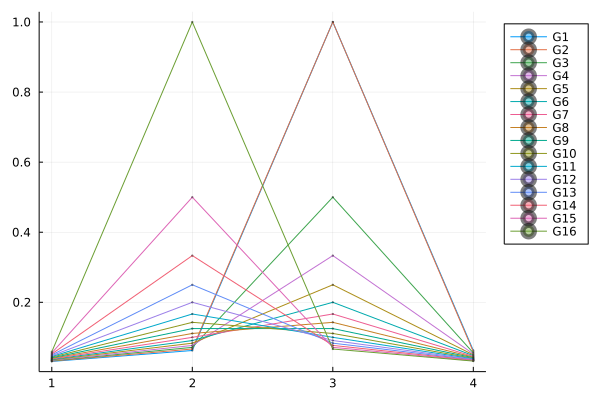

In [43]:
#[if i%m1 != 0 div(i, m1)+1 else div(i, m1) end for i in zeta_groups[g]]

p1 = plot()
for group in keys(zeta_groups)
    plot!(p1, 1:nLinesPerSnapshot, [lambda_0[zeta] for zeta in zeta_groups[group]], 
        label = "$group", marker=(:circle, 0.5, 1), legend=:outertopright, dpi=400)
#     plot!(p1, 1:nLinesPerSnapshot, 
#         [lambda_0[LineNo] for LineNo in [if zeta%m1 != 0 div(zeta, m1)+1 else div(zeta, m1) end for zeta in zeta_groups[group]]],
#         label = "$group", marker=(:circle, 0.5, 1), legend=:outertopright, dpi=400)
end
display(p1)

In [44]:
# p1 = plot()
# for group in keys(lambda0_valuesPerGroup)
#     plot!(p1, 1:length(lambda0_valuesPerGroup[group]), lambda0_valuesPerGroup[group], label = "$group", legend=:outertopright)
# end
# display(p1)

In [45]:
## Deduplicate zetas that lie on i2Lines at same distance from centre of k-space (`i2_0` line)
# We can further remove redundant error terms by removing zetas that are equidistant from the centre of k-space. This is because such zetas would have identical $\lambda_0$ values and thus can be removed. 

# zeta_groupsRepr_lambda0 = Dict{String, Vector{Int64}}()
# for key = keys(zeta_groups)
#     Zetas_withUniquei2LineNo =  [zeta_groups[key][1+m1*i] for i=0:3]
#     DistFromi2_0 = [abs(i2line-i2_0) for i2line = [if i%m1 != 0 div(i, m1)+1 else div(i, m1) end for i in Zetas_withUniquei2LineNo]]
#     if allunique(DistFromi2_0)    
#         print("")
#     else
#         println("i2lines with same λ₀ found for Group:($key). Removing the duplicates!!")
#         Zetas_withUniquei2LineNo = [Zetas_withUniquei2LineNo[idx] for idx = [group_indices[1] for group_indices = Group_Array(DistFromi2_0)]]
#     end
#     zeta_groupsRepr_lambda0[key] = Zetas_withUniquei2LineNo
# end

# zeta_groupsRepr_lambda0
#take either 4 subgroups for each group or 1 

# lambda0_valuesPerGroup = Dict{String, Vector{TheFloatType}}()
# for group = keys(zeta_groupsRepr_lambda0)
#     lambda0_valuesPerGroup[group] = [lambda_0[i] for i = zeta_groupsRepr_lambda0[group]]   
# end

# p1 = plot()
# for group in keys(lambda0_valuesPerGroup)
#     plot!(p1, 1:length(lambda0_valuesPerGroup[group]), lambda0_valuesPerGroup[group], label = "$group", 
#         marker=(:circle, 0.5, 1), legend=:outertopright)
# end
# display(p1)

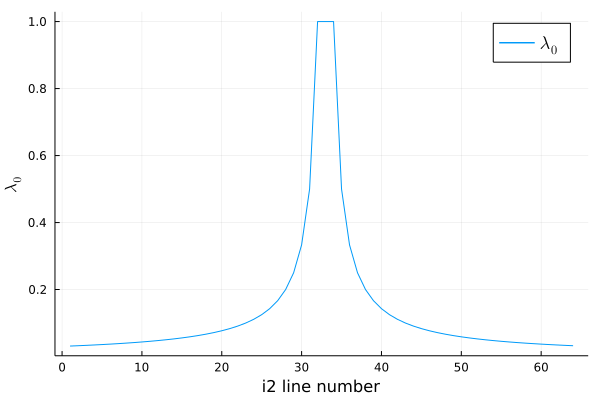

In [46]:
#plot(1:m2, lambda_0, label =L"\lambda_0", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
plot(1:m2, lambda_0[1,:], label =L"\lambda_0", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)

In [276]:
gr()

Plots.GRBackend()

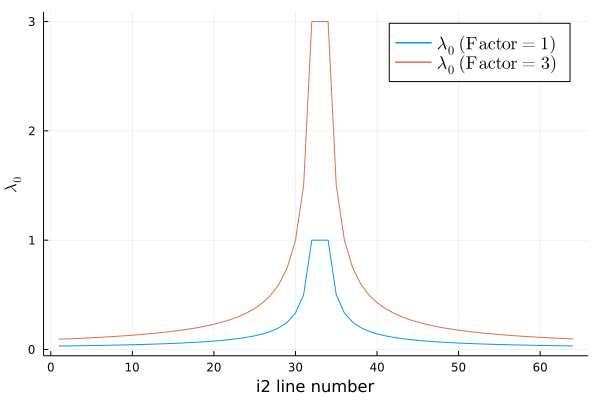

In [337]:
p1 = plot(1:m2, Compute_λ₀(1)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=1)}\$", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
plot!(1:m2, Compute_λ₀(3)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=3)}\$", legendfontsize=12)

In [301]:
# function Compute_λ₀_Ver1(factor=15)
#     λ₀ = Array{TheFloatType}(undef, m1, m2)
#     for (idx, col) in enumerate(eachcol(λ₀))
#         s = abs(idx - i2_0)
#         #col .= factor/(s^3 + 6*s^2 + 15*s + 15)  #bessel
#         #col .= factor/(1 + 2*s + 2*s^2 + s^3)  #butterworth
#         col .= factor/(s^2 + 1.414214*s + 1)
#     end
#     return λ₀
# end

Compute_λ₀_Ver1 (generic function with 2 methods)

In [320]:
function Compute_λ₀_Ver1(factor=0.5)
    λ₀ = Array{TheFloatType}(undef, m1, m2)
    for (idx, col) in enumerate(eachcol(λ₀))
        s = abs(idx - i2_0)
        if s >= factor*i2_0    #i2_0*factor<=idx<=i2_0
            col .= 0.5*(1 + cos((pi*(s - factor*i2_0))/((1-factor)*i2_0)))
        else
            col .= 1 #0.5*(1 - cos((pi*idx)/(factor*i2_0)))
        end
    end
    return λ₀
end

Compute_λ₀_Ver1 (generic function with 2 methods)

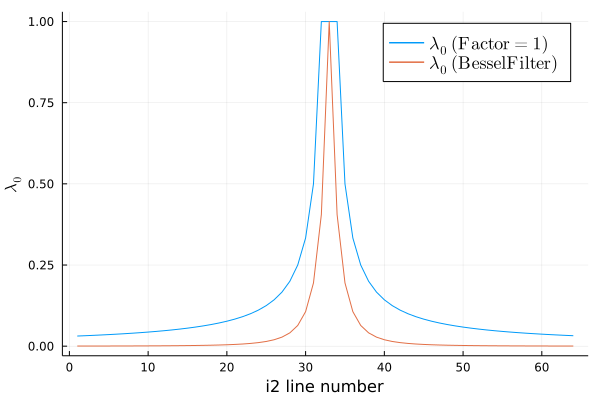

In [293]:
p1 = plot(1:m2, Compute_λ₀(1)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=1)}\$", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
plot!(1:m2, Compute_λ₀_Ver1()[1, :], label ="\$\\lambda_0\\textrm{\\ (BesselFilter)}\$", legendfontsize=12)

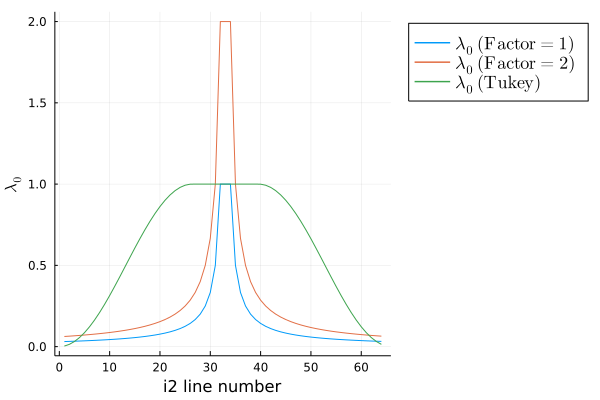

In [342]:
p1 = plot(1:m2, Compute_λ₀(1)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=1)}\$", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
plot!(1:m2, Compute_λ₀(2)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=2)}\$", legendfontsize=12)
plot!(1:m2, Compute_λ₀_Ver1(0.2)[1, :], label ="\$\\lambda_0\\textrm{\\ (Tukey)}\$", legendfontsize=12, legend = :outertopright)

In [47]:
# plot(1:m2, lambda_0[1,:], label =L"\lambda_0", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
# plot(1:m2, lambda_0[:,1], label =L"\lambda_0", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
# plot!([i2_0], seriestype="vline", label = L"i2_0")
# title!("Plot of \$\\lambda_0\$ vs i2Line numbers")

<!-- ## Group of k-space points with identical $\epsilon_1$(Type1) error contributions to the residual.
- We need to find the group of $\zeta$s for Type1 error separately because the coefficent $\lambda_0$ is not same for all the $\zeta$s with extra weighting of k-space locations near the centre to account for the oversampling. 

__Note:__ For Type1 errors because of variable $\lambda_0$ coefficents, in addition to filling the dataframe with -1 and 1 for sampled and non-sampled $\zeta$'s resp., we also multiply each column of dataframe with their corresponding column in $\lambda_0$ matrix. Rest of the grouping procedure is same as Type2 errors. 

### Inputs
- `Yⱼ`(_array_) - an array of coefficent $Y_j$ found above.

### Outputs
- `unique_zetas_lamb0`(_vector_) -  a vector containing indexes of unique zetas to be used with Type1 errors. The length of the vector gives the total number of groups found. -->

## Putting everything together to compute the final residual vector($V$)

With the above identified groups of k-space locations for Type1 and Type2 error. V reduces to 
\begin{align*}
\mathbf{V} &=  
\begin{pmatrix}
\lambda_1Y_1(\bzeta_1)\nu^{(1)}_1 & \lambda_1Y_2(\bzeta_1)\nu^{(1)}_2 & \dots & \lambda_1Y_{N_I}(\bzeta_1)\nu^{(1)}_{N_I}\\
\vdots & \vdots & \ddots & \vdots\\
\lambda_1Y_1(\bzeta_{\alpha1})\nu^{(1)}_1 & \lambda_1Y_2(\bzeta_{\alpha1})\nu^{(1)}_2 & \dots & \lambda_1Y_{N_I}(\bzeta_{\alpha1})\nu^{(1)}_{N_I}\\
%new
\lambda_2Y_1(\bzeta_1)\nu^{(2)}_1 & \lambda_2Y_2(\bzeta_1)\nu^{(2)}_2 & \dots & \lambda_2Y_{N_I}(\bzeta_1)\nu^{(2)}_{N_I}\\
\vdots & \vdots & \ddots & \vdots\\
\lambda_2Y_1(\bzeta_{\alpha1})\nu^{(2}_1 & \lambda_2Y_2(\bzeta_{\alpha1})\nu^{(2)}_2 & \dots & \lambda_2Y_{N_I}(\bzeta_{\alpha1})\nu^{(2)}_{N_I}\\
%new
\lambda_3Y_1(\bzeta_1)\nu^{(3)}_1 & \lambda_3Y_2(\bzeta_1)\nu^{(3)}_2 & \dots & \lambda_3Y_{N_I}(\bzeta_1)\nu^{(3)}_{N_I}\\
\vdots & \vdots & \ddots & \vdots\\
\lambda_3Y_1(\bzeta_{\alpha1})\nu^{(3)}_1 & \lambda_3Y_2(\bzeta_{\alpha1})\nu^{(3)}_2 & \dots & \lambda_3Y_{N_I}(\bzeta_{\alpha1})\nu^{(3)}_{N_I}\\
%new
\lambda_0Y_1(\bzeta_1)\nu^{(0)}_1 & \lambda_0Y_2(\bzeta_1)\nu^{(0)}_2 & \dots & \lambda_0Y_{N_I}(\bzeta_1)\nu^{(0)}_{N_I}\\
\vdots & \vdots & \ddots & \vdots\\
\lambda_0Y_1(\bzeta_{\alpha0})\nu^{(0)}_1 & \lambda_0Y_2(\bzeta_{\alpha0})\nu^{(0)}_2 & \dots & \lambda_0Y_{N_I}(\bzeta_{\alpha0})\nu^{(0)}_{N_I}
\end{pmatrix}_{(3M_{\alpha1}+M_{\alpha0})\times N_I}
\begin{pmatrix}
\kappa_1^2\\[0.3em]
\kappa_2^2\\[0.3em]
\kappa_3^2\\
\vdots\\[0.3em]
\kappa_{N_I}^2
\end{pmatrix}_{N_I\times1}
\end{align*}

where
- $\bzeta_{\alpha1}$ - is some $\zeta$ in the group $\alpha1$ identified for Type2 error. The number of $\zeta$s in each group is $M_{\alpha1}$.
- $\bzeta_{\alpha0}$ - is some $\zeta$ in the group $\alpha0$ identified for Type1 error. The number of $\zeta$s in each group is $M_{\alpha0}$


### Input
- `κ`(_vector_) -  a vector of scaling factors of size `nSamples`.
- `TissueParameter`(_integer_) - number denoting specific parameter for which the residuals will be computed. Accepted values are 1, 2, 3 denoting T1, T2 and PD respectively. 

### Output
- `residual`(_vector_) - a vector of residuals.

In [48]:
#@everywhere 
# function Zeta_to_i2Line(zeta)
#     if zeta%m1 != 0 
#         return div(zeta, m1)+1 
#     else 
#         return div(zeta, m1)
#     end
# end

In [49]:
#global variables: 
#1. TheFloatType
#2. signalM
#3. coefficientsABC
#4. PSF_coefficients
#5. nSamples
#6. lambda_0
#7. zeta_groups
#8. zeta_groupsRepr_lambda0
#9. zeta_groupsRepr
#10. lambda0_valuesPerGroup


#@everywhere 
# function Compute_Residual(κ, TissueParameter=1)
    
#     #compute all the required coefficients
#     ReN_Inverse = Compute_ReN_Inverse(κ, JacobianM_atθ₀, TheFloatType)
#     νⱼ¹ , νⱼ²,  νⱼ³, νⱼ⁰ = Compute_ν(signalM , ReN_Inverse, JacobianM_atθ₀, TheFloatType; p=TissueParameter)
    
#     λ₁ ,λ₂, λ₃ = 1, 1, 1 
#     κ² = κ .^ 2
#     nZetaGroups = length(zeta_groupsRepr)
#     #ZetaGroups = values(zeta_groupsRepr)
#     #ZetaGroups_lambda0 = [i for zeta = values(zeta_groupsRepr_lambda0) for i = zeta] 
#     nZetaGroups_lambda0 = length(zeta_groupsRepr_lambda0)  #ZetaGroups_lambda0                      
    
#     length_V = 3*nZetaGroups + nZetaGroups_lambda0
    
#     #initialize the residual matrix 
#     V = Array{TheFloatType, 2}(undef, length_V, nSamples)

#     V[1:nZetaGroups, :] .= hcat([λ₁ .* PSF_coefficients[:,i] .* νⱼ¹ for i = zeta_groupsRepr]...)'
#     V[nZetaGroups+1:2*nZetaGroups, :] .= hcat([λ₂ .* PSF_coefficients[: ,i] .* νⱼ² for i = zeta_groupsRepr]...)'
#     V[2*nZetaGroups+1:3*nZetaGroups, :] .= hcat([λ₃ .* PSF_coefficients[:, i] .* νⱼ³ for i = zeta_groupsRepr]...)'
#     V[3*nZetaGroups+1:end, :] .= hcat([lambda_0[i] .* PSF_coefficients[:, i] .* νⱼ⁰ for i = zeta_groupsRepr_lambda0]...)'
#     #hcat([lambda_0[Zeta_to_i2Line(i)] .* PSF_coefficients[:, i] .* νⱼ⁰ for i = zeta_groupsRepr_lambda0]...)'
    
#     residual = V * κ²
#     #println("[INFO:] completed calculating residuals")
#     return residual  
# end

In [50]:
#@everywhere 
# function Compute_OverallResidual(κ)
#     Residual = Vector{TheFloatType}()
#     for param = 1:3
#         append!(Residual, Compute_Residual(κ, param))
#     end
#     return Residual
# end

In [395]:
Diagonal(sqrt(4)*I(5)*((collect(1:5) .- 1) ./ (collect(1:5).^2)))

5×5 Diagonal{Float64, Vector{Float64}}:
 0.0   ⋅    ⋅         ⋅      ⋅ 
  ⋅   0.5   ⋅         ⋅      ⋅ 
  ⋅    ⋅   0.444444   ⋅      ⋅ 
  ⋅    ⋅    ⋅        0.375   ⋅ 
  ⋅    ⋅    ⋅         ⋅     0.32

## Optimization to determine $\kappa$

We could optimize the residual `V` by using the following 2 methods:
1. SciPy - This is the Julia interface to the SciPy package in Python and is well developed with useful functionalities.  
- Inputs  
    + `Compute_Residual`(_function_) - function to compute the residuals (defined above).  
    +` rand_k`(_vector_) -  a starting guess for the scaling factors $\kappa$ of length `nSamples`.   
    + `verbose`(_integer_) - determines the Level of algorithm’s verbosity. Accepted values are 0 ,1 and 2.  
- Outputs  
    + `x` - the found solution
2. LsqFit - This is the Julia version of Non linear least squares. Less user freindly functionalities compared to SciPy. 
- Inputs  
    + `Compute_Residual`(_function_) - function to compute the residuals.
    + `rand_k`(_vector_) -  a starting guess for the scaling factors $\kappa$ of length `nSamples`.
    + `wt` - weight applied to the residual. Can be set to empty vector.  
- Outputs  
    + `param` - the found solution

In [51]:
@everywhere using MrfOptim

In [53]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => lambda_0, 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)
#Iteration parameters
IterationFactor = 12
NIterations = nWorkersDesired * IterationFactor

48

### NonDistributed Version

In [116]:
Tresults_unconstrained = Dict{String, Dict{Any, Any}}()

@time for i = 1:NIterations
    println("[Iter]:$i")
    random_guess =  rand(TheFloatType, nSamples)
    Tresults_unconstrained["fit$i"] = SciPy.optimize.least_squares(x -> MrfOptim.Compute_OverallResidual(x, PreComputedParams),
                                                                    random_guess, verbose=0)
end

[Iter:]1
[Iter:]2
[Iter:]3
[Iter:]4
 51.288387 seconds (22.20 M allocations: 77.769 GiB, 11.82% gc time, 1.18% compilation time)


In [133]:
Tresults_bounded = Dict{String, Dict{Any, Any}}()

@time for i = 1:NIterations
    println("[Iter]:$i")
    random_guess =  rand(TheFloatType, nSamples)
    Tresults_bounded["fit$i"] = SciPy.optimize.least_squares(x -> MrfOptim.Compute_OverallResidual(x, PreComputedParams), 
                                                             random_guess, verbose=0, bounds=(0, 1.0))
end

[Iter]:1
[Iter]:2
[Iter]:3
[Iter]:4
747.232757 seconds (401.84 M allocations: 1.459 TiB, 10.30% gc time, 0.04% compilation time)


### Distributed Version

In [54]:
using Distributed, StaticArrays, SharedArrays, PyCall  #LinearAlgebra
@everywhere using Distributed, StaticArrays, SharedArrays, LinearAlgebra, PyCall

@everywhere const myso = pyimport("scipy.optimize")
@everywhere SciPyOptimizer() = myso

In [55]:
UnboundedResults = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(UnboundedResults, SciPyOptimizer, nWorkersDesired, PreComputedParams)

138.567019 seconds (2.23 M allocations: 124.312 MiB, 0.02% gc time, 0.52% compilation time)


4

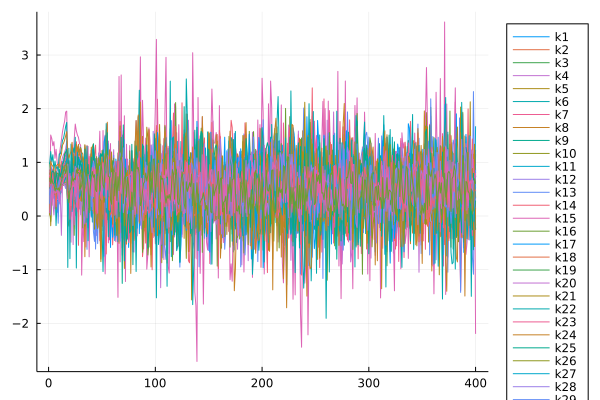

In [57]:
p1 = plot()
for (idx, i) = enumerate(UnboundedResults)
    plot!(p1, 1:nSamples, i, label="k$idx",legend = :outertopright)
end
display(p1)

In [58]:
BoundedResults = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

3999.778174 seconds (173.02 k allocations: 9.258 MiB, 0.00% compilation time)


4

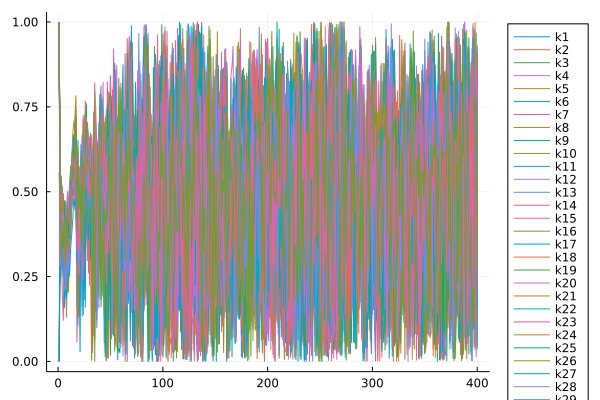

In [59]:
p1 = plot()
for (idx, i) = enumerate(BoundedResults)
    plot!(p1, 1:nSamples, i, label="k$idx", legend = :outertopright)
end
display(p1)

In [59]:
#initial guess
#StartingGuess_kappa = rand(Float64, nSamples)
# StartingGuess_kappa = load("boundfitOverall_scipy1.jld", "start_guess")

# fitT1_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 1), StartingGuess_kappa, verbose=1) # max_nfev=5, method:"trf" by default
#save("fit2_SciPy.jld", "sol", fit_scipy["x"], "initial_k", rand_k, "m1", m1, "m2", m2)
#fit_scipy["x"]
#fitT1_lmfit = LsqFit.lmfit(x->Compute_Residual(x, 1), StartingGuess_kappa, Float64[])
#norm(Compute_Residual(fitT1_lmfit.param))
#norm(Compute_Residual(fitT1_scipy["x"]))

#@btime 3 runs -> 41.081 s (45006097 allocations: 52.96 GiB)
# boundfitT1_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 1), StartingGuess_kappa, 
#     verbose=1, bounds=(-1.0, 1.0))
#@time 1 run -> 448.659407 seconds (695.79 M allocations: 855.425 GiB, 6.89% gc time, 0.07% compilation time
# boundfitT1_lmfit = LsqFit.lmfit(x->Compute_Residual(x, 1), StartingGuess_kappa, Float64[],
#     lower=fill(-1.0, nSamples), upper=fill(1.0, nSamples)) #, maxIter

# p1 = plot(1:nSamples, boundfitT1_scipy["x"], marker=:circle, label="bounded")
# plot!(p1, 1:nSamples, fitT1_scipy["x"], marker=:circle, label= "unconstrained",
#     xlabel="\$\\textrm{index\\ j \\ in\\ }M_j\$", ylabel="\$\\kappa\\textrm{\\ values}\$")
# p2 = plot(["bounded", "unconstrained"], log.([boundfitT1_scipy["cost"], fitT1_scipy["cost"]]),
#     marker=:circle, ylabel="\$\\log_e\\textrm{(cost)}\$", label="cost" )
# plot(p1, p2, layout = (2, 1), legend = :outertopright, size = (800,400), 
#     plot_title="bounded and unconstrained optimisation for T1",bottom_margin=3Plots.mm) 

# boundfitT2_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 2), StartingGuess_kappa, verbose=1, 
#     bounds=(-1.0, 1.0))
# fitT2_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 2), StartingGuess_kappa, verbose=1)
# fitPD_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 3), StartingGuess_kappa, verbose=1)

# boundfitPD_scipy = SciPy.optimize.least_squares(x->Compute_Residual(x, 3), StartingGuess_kappa, verbose=1,
#     bounds=(-1.0, 1.0))
# fitOverall_scipy = SciPy.optimize.least_squares(Compute_OverallResidual, StartingGuess_kappa, verbose=1)
# boundfitOverall_scipy = SciPy.optimize.least_squares(Compute_OverallResidual, StartingGuess_kappa, verbose=1,
#     bounds=(0, 1.0))
# save("boundfitOverall_scipy1.jld", "sol", boundfitOverall_scipy["x"], "start_guess", StartingGuess_kappa) 
# save("fitOverall_scipy1.jld", "sol", fitOverall_scipy["x"], "start_guess", StartingGuess_kappa) 
# save("30runs_boundfitOverall_scipy1.jld", "sol", mean_stacked_boundedresults)
#lm_fit = LsqFit.lmfit(Compute_Residual, rand_k, Float64[])
#save("fit2_lmfit.jld", "sol", lm_fit.param, "initial_k", rand_k, "m1", m1, "m2", m2)

# TESTING NEW MAY 12 
# simulation of finite difference derivatives
# derValueSignal = SharedArray{Complex{TheFloatType}}(nSamples, 1; pids=theWorkers)
# derJacobianSignal = SharedArray{Complex{TheFloatType}}(nSamples, 3, 1; pids=theWorkers)
# MriSim2.SimT1T2M0_jacobian(derValueSignal, derJacobianSignal, simObj, logT1Ref, logT2Ref, PDRef, otherPar)

# # x axis
# x=1:nSamples

# plot(x, imag.(view(derValueSignal, :, 1)), title="testing")
# plot!(x, imag.(view(derJacobianSignal, :, 1, 1)), title="testing2")
# plot!(x, imag.(view(derJacobianSignal, :, 2, 1)), title="testing2")

`gtol` termination condition is satisfied.
Function evaluations 20, initial cost 1.4841e-02, final cost 5.1981e-14, first-order optimality 1.12e-09.


Dict{Any, Any} with 12 entries:
  "x"           => [0.116861, 0.502422, 0.387026, 0.710061, 0.675954, 0.238001,…
  "grad"        => [0.0, 4.56575e-11, -1.31376e-10, -3.18721e-10, 1.31233e-10, …
  "nfev"        => 20
  "status"      => 1
  "optimality"  => 1.12496e-9
  "njev"        => 9
  "active_mask" => [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0…
  "success"     => true
  "cost"        => 5.19813e-14
  "fun"         => [-2.92443e-10, -3.89494e-9, 9.73006e-10, -2.5701e-9, -1.6920…
  "message"     => "`gtol` termination condition is satisfied."
  "jac"         => [0.0 0.000276731 … -5.15926e-5 0.000292177; 0.0 -0.000750481…

In [747]:
using GlobalSensitivity, QuasiMonteCarlo

In [780]:
function ishi(X)
    A= 7
    B= 0.1
    sin(X[1]) + A*sin(X[2])^2+ B*X[3]^4 *sin(X[1])
end

n = 10000
lb = -ones(3)*π
ub = ones(3)*π
sampler = SobolSample()

a,b = QuasiMonteCarlo.generate_design_matrices(n,lb,ub,sampler)

2-element Vector{Matrix{Float64}}:
 [-3.140442167998879 0.0011504855909141298 … 0.420885978676123 -2.72070667491367; -1.4661021380217016 1.6754905155680913 … -1.3309200810892794 1.810672572500514; -1.5474031197796405 1.5941895338101526 … 0.6644054287529682 -2.4771872248368245]
 [1.8657041332659112 -1.2758885203238821 … -2.038852214698503 1.1027404388912903; 1.3081021168694802 -1.8334905367203127 … 2.42426488765477 -0.717327765935023; -1.523626417567413 1.6179662360223803 … 0.2594345007511589 -2.882158152838634]

In [773]:
a

3×1000 Matrix{Float64}:
 -3.12318   0.0184078   1.5892   …  2.57402    1.00322  -2.13837
 -1.56466   1.57693    -3.13546     0.217825  -1.35297   1.78862
  2.8532   -0.288388    1.28241     2.01565   -2.69674   0.444854

In [774]:
b

3×1000 Matrix{Float64}:
  3.08637   -0.0552233   1.51557  …  -1.6659    3.04649   -0.0951068
 -0.263845   2.87775     1.30695      1.86839   0.297592  -2.844
  0.411107  -2.73049    -1.15969     -1.16276  -2.73355    0.408039

In [781]:
res1 = gsa(ishi,Sobol(order=[0,1,2]),a,b)

GlobalSensitivity.SobolResult{Vector{Float64}, Nothing, Matrix{Float64}, Nothing}([0.31177276093631484, 0.4420569671144043, 0.00025396326682702836], nothing, [0.0 0.0019270351330031318 0.24363630912187859; 0.0 0.0 -6.531710922147312e-5; 0.0 0.0 0.0], nothing, [0.5587557041228874, 0.44288253691953333, 0.24546864518649106], nothing)

In [759]:
    S1::T1
    S1_Conf_Int::T2
    S2::T3
    S2_Conf_Int::T4
    ST::T1
    ST_Conf_Int::T2

GlobalSensitivity.SobolResult

In [782]:
res1.S1

3-element Vector{Float64}:
 0.31177276093631484
 0.4420569671144043
 0.00025396326682702836

In [783]:
res1.ST

3-element Vector{Float64}:
 0.5587557041228874
 0.44288253691953333
 0.24546864518649106

In [784]:
res1.S2

3×3 Matrix{Float64}:
 0.0  0.00192704   0.243636
 0.0  0.0         -6.53171e-5
 0.0  0.0          0.0

# Using checkerboard medium

In [892]:
using ExampleImages2

# coordinate range in medium
iRange1 = -div(m1,2) .+ (0:m1-1)
iRange2 = -div(m2,2) .+ (0:m2-1)

# indicator function of a disk: 1 inside a disk of given radius, 0 outside
radius = 0.75 * m1/2
fWin(i1,i2) = one(TheFloatType) * ( i1^2 + i2^2 - radius.^2 < 0 )

# values of the indicator function
winValues = [ fWin(i1,i2) for i1 in iRange1, i2 in iRange2 ]


(tmpT1, tmpT2, tmpPD) =
    ExampleImages2.CheckerBoardMedium(
        m1, m2, 12, 0, 4,
        TheFloatType.([ 0.75, 1.25 ]), 
        TheFloatType.([ 0.07, 0.09 ]), 
        TheFloatType.([1.0, 1.0]) )

mediumLogT1 = log.(tmpT1)
mediumLogT2 = log.(tmpT2)
mediumPD    = winValues;

# VoxelSignal simulation

In [44]:
taskVoxelSignalSimulation = false

false

In [61]:
# from (.../MriMrf/TestExample2/Example4/Generate_VoxelSignals_Main2.jl

# modified

# the following not imported before apparently
@everywhere using MriSim2

#filenameVoxelSignals = "voxelSignals_test1.jld" #128x128
filenameVoxelSignals = "voxelSignals_test2.jld"  #64x64
keyVoxelSignals = "voxelSignals"

if taskVoxelSignalSimulation
    #
    # WE MUST USE A SharedArray HERE !!! (from module SharedArrays)
    #
    voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)

    # simulate per-voxel signals
    MriSim2.SimT1T2M0_transp(theWorkers, simObj, mediumLogT1, mediumLogT2, mediumPD, otherPar, voxelSignals)

    # save data, N.B. save the underlying array object
    save(filenameVoxelSignals, keyVoxelSignals, SharedArrays.sdata(voxelSignals))
end

# load from saved file
#tmp = load(filenameVoxelSignals, keyVoxelSignals)

# Dictionary simulation

In [38]:
taskDictionarySimulation = false

false

In [62]:
using MrfImaging2

# dictionary T1 axis
t1L = log(0.2)
t1H = log(4.0)
# nT1 = 600
nT1 = 150
# nT1 = 20
t1DictAxis = collect(range(t1L,stop=t1H,length=nT1))

# dictionary T2 axis
t2L = log(0.025)
t2H = log(0.400)
# nT2 = 280
nT2 = 70
# nT2 = 15
t2DictAxis = collect(range(t2L,stop=t2H,length=nT2))

# create arrays for t1Dict, t2Dict
t1DictArray = SharedArray{TheFloatType}(nT1,nT2)
t2DictArray = SharedArray{TheFloatType}(nT1,nT2)
t1DictArray[:,:] = repeat(  t1DictAxis, outer = (1,nT2) )
t2DictArray[:,:] = repeat(  reshape(t2DictAxis,1,nT2), inner = (nT1,1) )

# dictionary filename
#filenameDictionary = "test1_dictionary.jld" #128x128
filenameDictionary = "test2_dictionary.jld"  #64x64

if taskDictionarySimulation
    # create dictionary and norms info
    # allocate space for dictionary signals and one-over-norms
    dictSignal = SharedArray{Complex{TheFloatType}}(nSamples,nT1,nT2)
    dictOneOverNorms = SharedArray{TheFloatType}(nT1,nT2)
    # simulation of dictionary signals and "oneOverNorms"
    # # DISTRIBUTED: ERROR
    # MrfImaging2.SimT1T2(
    #     workers(),simObj,t1DictArray,t2DictArray,otherPar,
    #     dictSignal,dictOneOverNorms)

    MrfImaging2.SimT1T2(
        simObj, reshape(t1DictArray, nT1*nT2),reshape(t2DictArray, nT1*nT2),
        otherPar,
        reshape(dictSignal, nSamples, nT1*nT2),
        reshape(dictOneOverNorms, nT1*nT2))

    # save result to disk
    fid = jldopen(filenameDictionary,"w")
    write(fid, "dictSignal", SharedArrays.sdata(dictSignal))
    write(fid, "dictOneOverNorms", SharedArrays.sdata(dictOneOverNorms))
    close(fid)
end

In [63]:
# load dictionary 
dictSignal = SharedArray{Complex{TheFloatType}}(nSamples, nT1, nT2)
dictOneOverNorms = SharedArray{TheFloatType}(nT1, nT2)
fid = jldopen(filenameDictionary)
dictSignal .= read(fid, "dictSignal")
dictOneOverNorms .= read(fid, "dictOneOverNorms")
println("load dictionary done")

load dictionary done


In [64]:
scaledInnerProducts = dictOneOverNorms .*[ LinearAlgebra.dot(dictSignal[:,iT1,iT2], signalM[:,1]) 
    for iT1=1:nT1, iT2=1:nT2 ]

i = argmax(abs.(scaledInnerProducts))
println("i = $(i)")

theLogT1 = t1DictArray[i]
theLogT2 = t2DictArray[i]
println("t1DictArray logT1 value = $(theLogT1), t2DictArray logT2 Value =$(theLogT2)")
println("exp of these: $(exp(theLogT1)),  $(exp(theLogT2))")

i = CartesianIndex(81, 35)
t1DictArray logT1 value = -0.0009910541500783466, t2DictArray logT2 Value =-2.3226763156189714
exp of these: 0.9990094367818924,  0.09801092610890982


In [133]:
# scaled_scaledInnerProducts = scaled_dictOneOverNorms .*[ LinearAlgebra.dot(scaled_dictSignal[:,iT1,iT2], signalM[:,1]) 
#     for iT1=1:nT1, iT2=1:nT2 ]

# i = argmax(abs.(scaled_scaledInnerProducts))
# println("i = $(i)")

# theLogT1 = t1DictArray[i]
# theLogT2 = t2DictArray[i]
# println("t1DictArray logT1 value = $(theLogT1), t2DictArray logT2 Value =$(theLogT2)")
# println("exp of these: $(exp(theLogT1)),  $(exp(theLogT2))")

i = CartesianIndex(81, 31)
t1DictArray logT1 value = -0.0009910541500783466, t2DictArray logT2 Value =-2.483406096618379
exp of these: 0.9990094367818924,  0.08345847329690521


# ApplyPSF

In [65]:
# apply the "per snapshot" point spread functions 

using ApplyPsfNew2

# k-space sampling object
theMriK = mriKParCartesian[1]
#theMriK = mriKParRadial

# allocated arrays
voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)
images = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)

# load data
SharedArrays.sdata(voxelSignals) .= 
    load(filenameVoxelSignals, keyVoxelSignals)
# TESTING
maximum(abs.(voxelSignals))

# # apply Psf to get image from voxelSignals
# # NON-DISTRIBUTED VERSION
# ApplyPsfNew2.ApplyPsf(
#     theMriK, 1:nSamples, voxelSignals, images)

# DISTRIBUTED VERSION: ERROR
ApplyPsfNew2.ApplyPsf(workers(), theMriK, 1:nSamples, voxelSignals, images)

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]


4-element Vector{Nothing}:
 nothing
 nothing
 nothing
 nothing

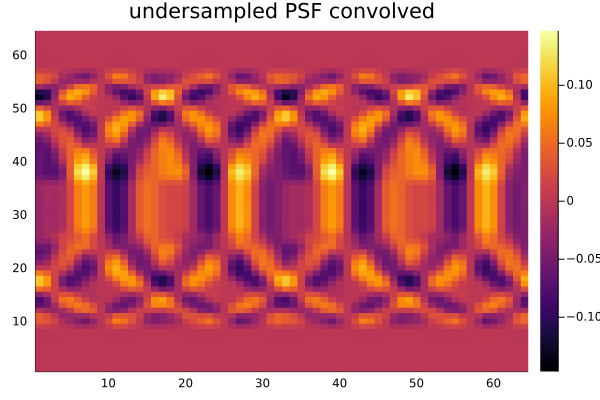

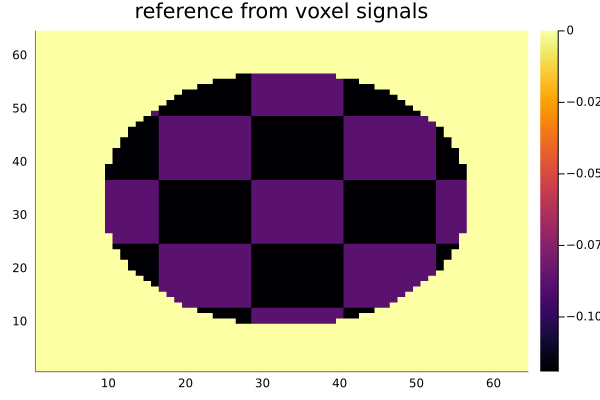

In [66]:
# take imaginary part, display this
iSomeSnapshot = 150
someSnapshot = images[:,:,iSomeSnapshot]
plotUndersampledImage = heatmap(imag.(someSnapshot), title="undersampled PSF convolved")
display(plotUndersampledImage)

someSnapshot = images[:,:,iSomeSnapshot]
plotVoxelSignalsImage = heatmap(imag.(voxelSignals[:,:,iSomeSnapshot]), 
    title="reference from voxel signals")
display(plotVoxelSignalsImage)

## Reference Image

In [614]:
theWorkers

4-element Vector{Int64}:
 2
 3
 4
 5

nIntervalPerWorker and iFirstIntervalPerWorker:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]


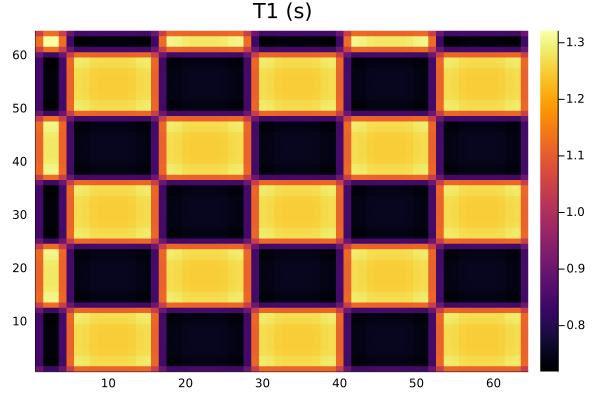

In [564]:
# convolution with point spread function (PSF) is implemented for complex data 
# and uses SharedArray objects
# therefore, create a SharedArray{Complex{TheFloatType}} 
# and copy logT1 into this array
mediumLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
mediumLogT1_Complex .= Complex{TheFloatType}.(mediumLogT1)

# allocate SharedArray for result of PSF applied to mediumLogT1_Complex
refImagePsfLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)

# apply point spread function
ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nInterval, mediumLogT1_Complex, refImagePsfLogT1_Complex)

# the function AccumPsf applies the per-interval PSF P_j and 
# sums the result. To get the result of applying the average P, 
# we have to divide by the number of samples
refImagePsfLogT1_Complex ./= nInterval

# take real part, this is the result
refImagePsfLogT1 = Array{TheFloatType}(undef, m1, m2)
refImagePsfLogT1 .= real.(refImagePsfLogT1_Complex)


# plot resulting map
heatmap(exp.(refImagePsfLogT1), title="T1 (s)")

nIntervalPerWorker and iFirstIntervalPerWorker:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]


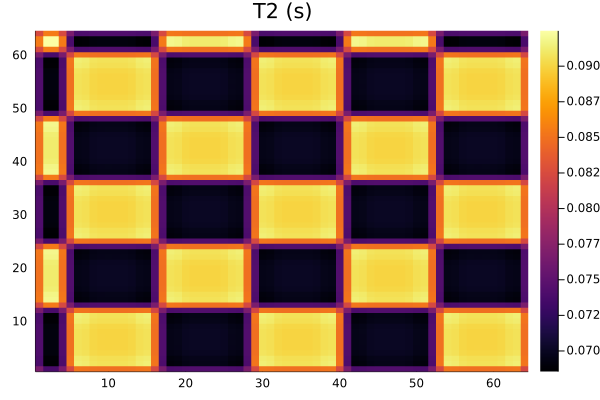

In [566]:
mediumLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
mediumLogT2_Complex .= Complex{TheFloatType}.(mediumLogT2)

refImagePsfLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)

ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nInterval, mediumLogT2_Complex, refImagePsfLogT2_Complex)
refImagePsfLogT2_Complex ./= nInterval

refImagePsfLogT2 = Array{TheFloatType}(undef, m1, m2) 
refImagePsfLogT2 .= real.(refImagePsfLogT2_Complex)

heatmap(exp.(refImagePsfLogT2), title="T2 (s)")

nIntervalPerWorker and iFirstIntervalPerWorker:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]


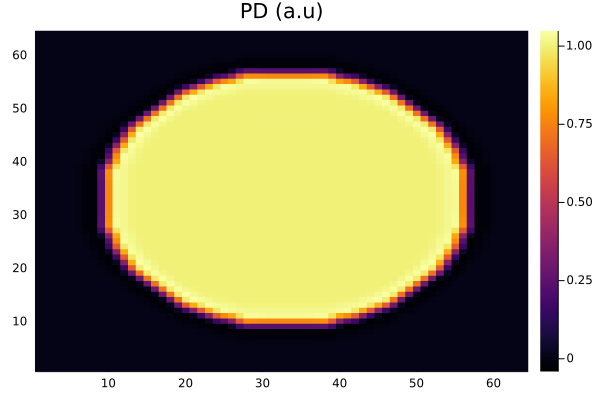

In [572]:
mediumPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
mediumPD_Complex .= Complex{TheFloatType}.(mediumPD)

refImagePsfPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)

ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nInterval, mediumPD_Complex, refImagePsfPD_Complex)
refImagePsfPD_Complex ./= nInterval

refImagePsfPD = Array{TheFloatType}(undef, m1, m2)
refImagePsfPD .= real.(refImagePsfPD_Complex) 

heatmap(refImagePsfPD, title="PD (a.u)")

## Reference plots

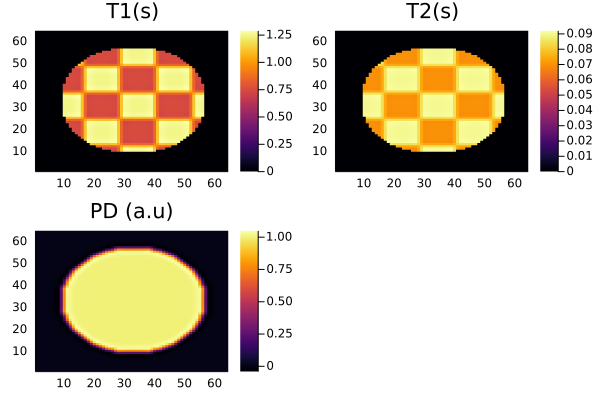

In [601]:
plot(heatmap(exp.(refImagePsfLogT1).* WinFun.(refImagePsfPD), title="T1(s)"), 
heatmap(exp.(refImagePsfLogT2).* WinFun.(refImagePsfPD), title="T2(s)", clim=(0,0.092)),
heatmap(refImagePsfPD, title="PD (a.u)"))

# MRF estimates

In [67]:
inputData = images

# change ordering of array axes (in following time is fast axis)
imagesByTrace = SharedArray{Complex{TheFloatType}}(nSamples, m1, m2)

# transpose to go to new form
imagesReshaped  = reshape(inputData, m1*m2, nSamples)
imagesByTraceReshaped = reshape(imagesByTrace, nSamples, m1*m2)
LinearAlgebra.transpose!(imagesByTraceReshaped, imagesReshaped)
println("transposition done")

transposition done


In [68]:
# ref Amplitude: effect of point spread function 
# (average of undersampled point spread functions)
onesImage = ones(Complex{TheFloatType},m1,m2)
refAmplitudeCp = Array{Complex{TheFloatType}}(undef, m1,m2)

# generate amplitudes C_P from notes
ApplyPsfNew2.AccumPsf(
    workers(), theMriK, 1:nInterval, onesImage, refAmplitudeCp)
refAmplitudeCp .*= ( 1.0 ./ nInterval )

CpRefValue = refAmplitudeCp[div(m1,2), div(m2,2)]
println("CpRefValue = $(CpRefValue)")

nIntervalPerWorker and iFirstIntervalPerWorker:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
CpRefValue = 1.000000000000059 + 1.013145134755712e-13im


## Estimate parameters with MRF

In [69]:
using MrfImaging2

# allocate space for estimated MRF parameters
estimatedLogT1 = SharedArray{TheFloatType}(m1, m2)
estimatedLogT2 = SharedArray{TheFloatType}(m1, m2)
estimatedPD = SharedArray{TheFloatType}(m1, m2)
estimatedComplexPD = SharedArray{Complex{TheFloatType}}(m1, m2)

# work space: complex inner products in MRF
nDict = nT1 * nT2
nSignalBlockMax = 128
complexInnerProducts =
    SharedArray{Complex{TheFloatType}}(nDict,min(nSignalBlockMax,m1*m2))

# estimate using the dictionary
MrfImaging2.MrfEstimate(
    workers(), dictSignal, t1DictArray, t2DictArray, dictOneOverNorms,
    imagesByTraceReshaped,
    reshape(estimatedLogT1, m1*m2), 
    reshape(estimatedLogT2, m1*m2),
    reshape(estimatedComplexPD, m1*m2),
    complexInnerProducts)

estimatedPD .= real.(estimatedComplexPD ./ CpRefValue);

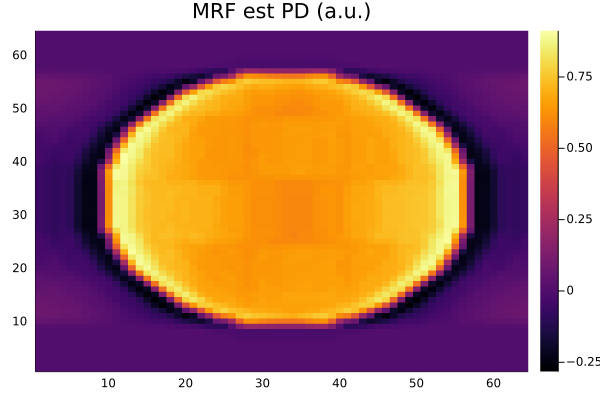

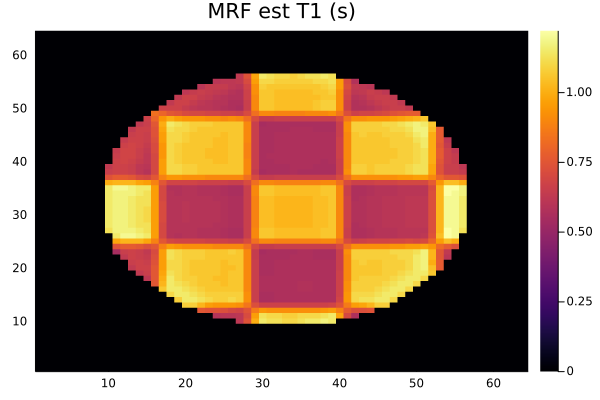

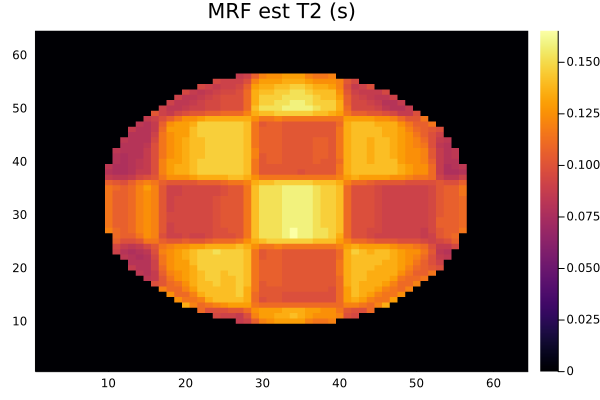

In [70]:
# a window function
eps=0.25
WinFun(x) = ( x>eps ? one(TheFloatType) : zero(TheFloatType) )

# plot PD map
display(heatmap(estimatedPD, title="MRF est PD (a.u.)"))

# plot T1 map
display(heatmap(exp.(estimatedLogT1) .* WinFun.(estimatedPD), title="MRF est T1 (s)"))

# plot T2 map
display(heatmap(exp.(estimatedLogT2) .* WinFun.(estimatedPD), title="MRF est T2 (s)"))

## Mrf estimates with scaling

### Inputs
- `optimal_kappas`(_vector_) - a vector of length `nSamples` found from the optimization.
- `plot_results`(_boolean_) - determines whether to plot the optimized MRF estimates vs non optimized estimates. Set to `true` by default
- `return_estimates`(_boolean_) - determines whether to return the optimized MRF estimates. Set to `false` by default.

### Outputs
- `(scaled_estimatedLogT1, scaled_estimatedLogT2, scaled_estimatedPD)` (_tuple_) - a tuple of the MRF estimates determined after optimization (`return_estimates` should be set to `true`). 

In [602]:
function Compute_MrfEstimates_withScaling(optimal_kappas, plot_results=true, return_estimates=false)
    
    #without sensitivity analysis use only below version. comment everything above
    #scale dictSignal
    scaled_dictSignal = Array{Complex{TheFloatType}}(undef, nSamples, nT1, nT2)
    for i = 1:nT1
        for j = 1:nT2
            scaled_dictSignal[:, i, j] = dictSignal[:, i, j] .* optimal_kappas   #fit["x"] #lm_fit.param
        end
    end

    #compute norms of scaled dictSignal
    scaled_dictOneOverNorms = Array{TheFloatType}(undef, nT1, nT2)
    for i = 1:nT1
        for j = 1:nT2
            scaled_dictOneOverNorms[i,j] = 1/norm(scaled_dictSignal[:,i,j])
        end
    end
    
    #scaled voxelSignals
    scaled_voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples) 
    for (i, κ) = enumerate(optimal_kappas)     #fit["x"]) #(lm_fit.param) 
        scaled_voxelSignals[:,:,i] .= κ .* voxelSignals[:,:,i] 
    end

    scaled_images = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)
    ApplyPsfNew2.ApplyPsf(workers(), theMriK, 1:nSamples, scaled_voxelSignals, scaled_images)
    
    scaled_inputData = scaled_images

    # change ordering of array axes (in following time is fast axis)
    scaled_imagesByTrace = SharedArray{Complex{TheFloatType}}(nSamples, m1, m2)

    # transpose to go to new form
    scaled_imagesReshaped  = reshape(scaled_inputData, m1*m2, nSamples)
    scaled_imagesByTraceReshaped = reshape(scaled_imagesByTrace, nSamples, m1*m2)
    LinearAlgebra.transpose!(scaled_imagesByTraceReshaped, scaled_imagesReshaped)
    println("transposition done")
    
    
    # allocate space for estimated MRF parameters
    scaled_estimatedLogT1 = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedLogT2 = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedPD = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedComplexPD = SharedArray{Complex{TheFloatType}}(m1, m2)

    # work space: complex inner products in MRF (work array)
    nDict = nT1 * nT2
    nSignalBlockMax = 128
    complexInnerProducts =
        SharedArray{Complex{TheFloatType}}(nDict,min(nSignalBlockMax,m1*m2))

    # estimate using the dictionary
    MrfImaging2.MrfEstimate(
        workers(), scaled_dictSignal, t1DictArray, t2DictArray, scaled_dictOneOverNorms,
        scaled_imagesByTraceReshaped,
        reshape(scaled_estimatedLogT1, m1*m2), 
        reshape(scaled_estimatedLogT2, m1*m2),
        reshape(scaled_estimatedComplexPD, m1*m2),
        complexInnerProducts)

    scaled_estimatedPD .= real.(scaled_estimatedComplexPD ./ CpRefValue)
    
    
    #plot the results
    if plot_results
        display(plot(heatmap(exp.(refImagePsfLogT1).* WinFun.(refImagePsfPD), title="reference T1(s)", clim=(0,1.25)), 
                heatmap(exp.(estimatedLogT1) .* WinFun.(estimatedPD), title="MRF est T1 (s)", clim=(0,1.25)),
                heatmap(exp.(scaled_estimatedLogT1) .* WinFun.(scaled_estimatedPD), title="MRF est T1 (s) with scaling",clim=(0,1.25)),
                heatmap(exp.(refImagePsfLogT2).* WinFun.(refImagePsfPD), title="reference T2(s)", clim=(0,0.092)),
                heatmap(exp.(estimatedLogT2) .* WinFun.(estimatedPD), title="MRF est T2 (s)", clim=(0,0.092)),
                heatmap(exp.(scaled_estimatedLogT2) .* WinFun.(scaled_estimatedPD), title="MRF est T2 (s) with scaling", clim=(0,0.092)),
                heatmap(refImagePsfPD, title="reference PD (a.u)", clim =(0,1)),
                heatmap(estimatedPD, title="MRF est PD (a.u.)", clim =(0,1)),
                heatmap(scaled_estimatedPD, title="MRF est PD (a.u.) with scaling",clim=(0,1)),
                layout = (3, 3), dpi=300, size=(950,700)))
        
#         display(plot(heatmap(mediumPD, title="medium PD (a.u.)", clim=(0,1)),
#                 heatmap(estimatedPD, title="MRF est PD (a.u.)", clim =(0,1)), 
#             heatmap(scaled_estimatedPD, title="MRF est PD (a.u.) with scaling",clim=(0,1)), 
#             heatmap(exp.(mediumLogT1) .* WinFun.(mediumPD), title="medium T1 (s)",clim=(0,1.25)),
#             heatmap(exp.(estimatedLogT1) .* WinFun.(estimatedPD), title="MRF est T1 (s)", clim=(0,1.25)),
#             heatmap(exp.(scaled_estimatedLogT1) .* WinFun.(scaled_estimatedPD), title="MRF est T1 (s) with scaling",clim=(0,1.25)), 
#             heatmap(exp.(mediumLogT2) .* WinFun.(mediumPD), title="medium T2 (s)",clim=(0,0.1)),
#             heatmap(exp.(estimatedLogT2) .* WinFun.(estimatedPD), title="MRF est T2 (s)", clim=(0,0.1)),
#             heatmap(exp.(scaled_estimatedLogT2) .* WinFun.(scaled_estimatedPD), title="MRF est T2 (s) with scaling",clim=(0,0.1)),
#             layout = (3, 3), dpi=300, size=(950,700)))
             
    end
    
    #return estimates
    if return_estimates
        return (scaled_estimatedLogT1, scaled_estimatedLogT2, scaled_estimatedPD)
    end    
end
# plot of kappas

Compute_MrfEstimates_withScaling (generic function with 3 methods)

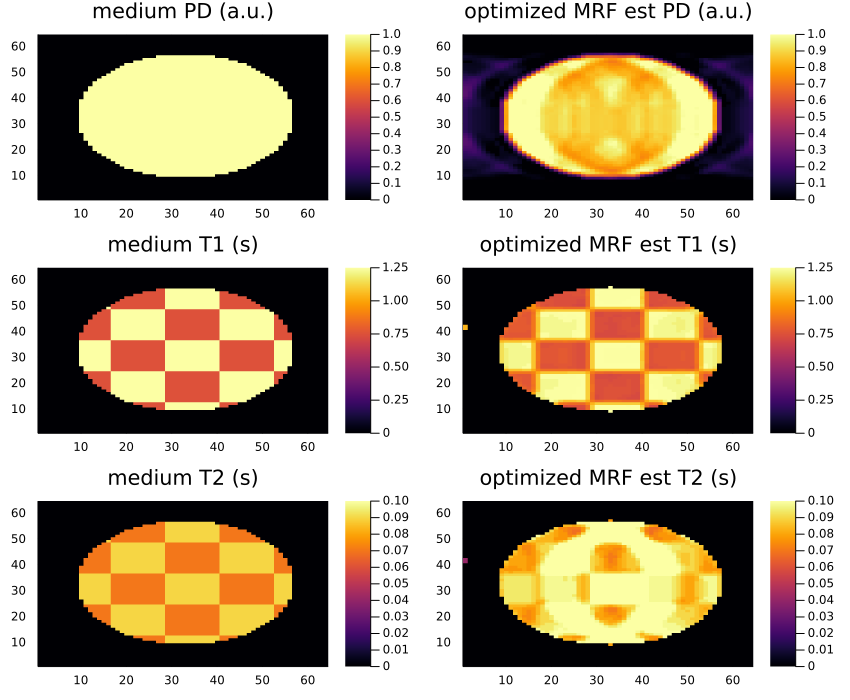

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [232]:
# Compute_MrfEstimates_withScaling(fitT1_scipy["x"])
# #reference plots
# Compute_MrfEstimates_withScaling(boundfitT1_scipy["x"])
# Compute_MrfEstimates_withScaling(fitT2_scipy["x"])
# Compute_MrfEstimates_withScaling(boundfitT2_scipy["x"])
# Compute_MrfEstimates_withScaling(fitPD_scipy["x"])
# Compute_MrfEstimates_withScaling(boundfitPD_scipy["x"])
# Compute_MrfEstimates_withScaling(load("fitOverall_scipy1.jld", "sol"))
# Compute_MrfEstimates_withScaling(fitOverall_scipy["x"])
# Compute_MrfEstimates_withScaling(load("boundfitOverall_scipy1.jld", "sol"))
# Compute_MrfEstimates_withScaling(boundfitOverall_scipy["x"])
# Compute_MrfEstimates_withScaling(boundfitOverall_scipy["x"])

In [662]:
function Plotter(FittedKappas, TissueParameter, plotMultipleKappas = false, optimizationstring = "unconstrained")
    @assert optimizationstring in ["unconstrained", "bounded"] "Invalid `optimization string`. Aborting!!"
    plotTitle_string =  "\$\\kappa\\;\\textrm{values\\ found\\ from\\ $optimizationstring\\ optimization}\$"
    if plotMultipleKappas
        @assert all([isa(TissueParameter, AbstractArray), all([isa(i, String) for i = TissueParameter])]) "For plotting multiple kappas, `Tissue parameter` should be an array of strings. Aborting!!"
        @assert all([isa(i, AbstractArray) for i = FittedKappas]) "For plotting multiple kappas, `FittedKappas` should be an array of arrays. Aborting!!"
        for (idx, kappas) = enumerate(FittedKappas)
            if idx == 1
                p1 = plot(1:length(kappas), kappas, label= TissueParameter[idx]*"fit")
                p2 = violin([TissueParameter[idx]*"fit"], kappas, label = TissueParameter[idx]) 
                boxplot!(p2, [TissueParameter[idx]*"fit"], kappas, fillalpha=0.3, label= "")
            else
                plot!(p1, kappas, label= TissueParameter[idx]*"fit")
                violin!(p2, [TissueParameter[idx]*"fit"], kappas, label = TissueParameter[idx]) 
                boxplot!(p2, [TissueParameter[idx]*"fit"], kappas, fillalpha=0.3, label= "")
            end   
        end
        xlabel!(p1, "\$\\textrm{Index\\ j\\ in\\ }M_j\$")
        plot(p1, p2, layout = (1, 2), legend = :outertopright, size = (900,350), 
            ylabel="\$\\kappa\\textrm{\\ values}\$" , bottom_margin=4Plots.mm, 
            plot_title = plotTitle_string)
    else
        @assert isa(TissueParameter, String) "Tissueparameter should be a string. Aborting!!"
        @assert isa(FittedKappas, AbstractArray) "Fitted kappas should be an array or vector of kappas. Aborting!!"
        
        p1 = plot(1:length(FittedKappas), FittedKappas, label = TissueParameter*"fit")
        xlabel!(p1, "\$\\textrm{Index\\ j\\ in\\ }M_j\$")
        p2 = StatsPlots.violin([TissueParameter*"fit"], FittedKappas, label = TissueParameter) 
        boxplot!(p2, [TissueParameter*"fit"], FittedKappas, fillalpha=0.3, label= "")
        plot(p1, p2, layout = (1, 2), legend = :outertopright, size = (800,350), 
            ylabel="\$\\kappa\\textrm{\\ values}\$" , bottom_margin=4Plots.mm, 
            plot_title = plotTitle_string)
    end
end

# Plotter([fitT1_scipy["x"], fitT2_scipy["x"], fitPD_scipy["x"], fitOverall_scipy["x"]], 
#     ["T1", "T2", "PD", "Overall"], true, "unconstrained")

# Plotter([boundfitT1_scipy["x"], boundfitT2_scipy["x"], boundfitPD_scipy["x"], boundfitOverall_scipy["x"]], 
#     ["T1", "T2", "PD", "Overall"], true, "bounded")

# plot(["T1fit","T2fit","PDfit","Overallfit"], 
#     log.([boundfitT1_scipy["cost"],boundfitT2_scipy["cost"],boundfitPD_scipy["cost"],boundfitOverall_scipy["cost"]]), 
#     label="cost with bounds", shape = :circle)
# plot!(["T1fit","T2fit","PDfit","Overallfit"],
#     log.([fitT1_scipy["cost"],fitT2_scipy["cost"],fitPD_scipy["cost"],fitOverall_scipy["cost"]]), label="cost without bounds", 
#     legend = :outertopright, shape = :circle, ylabel ="\$\\log_e\\textrm{(cost)}\$")
# title!("Cost for different fits")

Plotter (generic function with 3 methods)

## Visualize results
<!-- ## Optimize with multiple starting guesses for $\kappa$ -->

In [214]:
# Tresults_unconstrained = Vector{Dict{Any, Any}}()
# Tresults_bounded = Vector{Dict{Any, Any}}()
# #nWorkers = length(theWorkers)
# UnconstrainedResults_Futures = Vector{Any}()
# BoundedResults_Futures = Vector{Any}()
# @time for i = tqdm(1:2)
#     println("[Iter:]$i")
#     random_guess =  rand(TheFloatType, nSamples)
#     #future_unconstrained = @spawnat :any SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=0)
#     #Tresults_unconstrained[i] = Distributed.@fetch SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=0)
#     #println(Distributed.@fetch SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=0))
#     push!(UnconstrainedResults_Futures, Distributed.@fetch getso1().least_squares(Compute_OverallResidual, random_guess, verbose=0))
    
#     #future_bounded = @spawnat SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=0, bounds=(0, 1.0))
#     #push!(BoundedResults_Futures, Distributed.@fetch SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=0, bounds=(0, 1.0)))
# end 
# #Tresults_unconstrained .= fetch.(UnconstrainedResults_Futures)
# #Tresults_bounded .= fetch.(BoundedResults_Futures)

[Iter:]1


0.0%┣                                                ┫ 0/2 [00:00<00:00, -0s/it]


LoadError: On worker 5:
(in a Julia function called from Python)
JULIA: DimensionMismatch("array could not be broadcast to match destination")
Stacktrace:
  [1] [0m[1mpyerr_check[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mexception.jl:62[24m[39m[90m [inlined][39m
  [2] [0m[1mpyerr_check[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mexception.jl:66[24m[39m[90m [inlined][39m
  [3] [0m[1m_handle_error[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mexception.jl:83[24m[39m
  [4] [0m[1mmacro expansion[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mexception.jl:97[24m[39m[90m [inlined][39m
  [5] [0m[1m#107[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mpyfncall.jl:43[24m[39m[90m [inlined][39m
  [6] [0m[1mdisable_sigint[22m
[90m    @ [39m[90m.\[39m[90m[4mc.jl:458[24m[39m[90m [inlined][39m
  [7] [0m[1m__pycall![22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mpyfncall.jl:42[24m[39m[90m [inlined][39m
  [8] [0m[1m_pycall![22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mpyfncall.jl:29[24m[39m
  [9] [0m[1m_pycall![22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mpyfncall.jl:11[24m[39m
 [10] [0m[1m#_#114[22m
[90m    @ [39m[90mC:\Users\Kamlesh\.julia\packages\PyCall\7a7w0\src\[39m[90m[4mpyfncall.jl:86[24m[39m
 [11] [0m[1m#198[22m
[90m    @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mmacros.jl:123[24m[39m
 [12] [0m[1m#106[22m
[90m    @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:278[24m[39m
 [13] [0m[1mrun_work_thunk[22m
[90m    @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:63[24m[39m
 [14] [0m[1mmacro expansion[22m
[90m    @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:278[24m[39m[90m [inlined][39m
 [15] [0m[1m#105[22m
[90m    @ [39m[90m.\[39m[90m[4mtask.jl:423[24m[39m

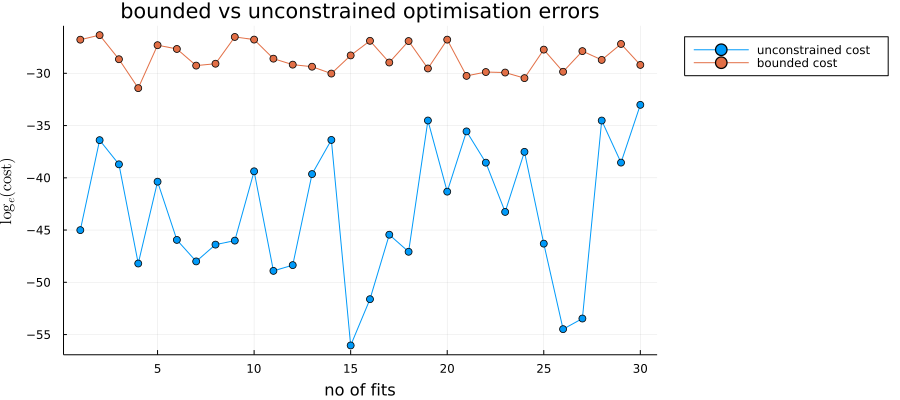

In [97]:
# plot(1:Niters, log.([results_unconstrained["fit$i"]["cost"] for i=1:Niters]), label="unconstrained cost", 
#     shape = :circle, size=(900,400), bottom_margin=3Plots.mm, left_margin=2Plots.mm)   
# plot!(log.([results_bounded["fit$i"]["cost"] for i=1:Niters]), label="bounded cost",
#     legend = :outertopright, shape = :circle, ylabel="\$\\log_e\\textrm{(cost)}\$", xlabel="no of fits", 
#     title="bounded vs unconstrained optimisation errors")

In [97]:
stackedUnboundedResults = reduce(hcat, UnboundedResults)
mean_stackedUnboundedResults= mean(stackedUnboundedResults, dims=2)
std_stackedUnboundedResults = std(stackedUnboundedResults, dims=2)
#calculate 95% confidence interval
tValue = SciPy.stats.t.ppf(1-0.025, NIterations-1)
ConfInterval_stackedUnboundedResults = (std_stackedUnboundedResults/(sqrt(NIterations))) .* tValue   

400×1 Matrix{Float64}:
 0.07588290792370886
 0.08282124349674204
 0.049981471918446464
 0.05730395747160392
 0.055470284302389275
 0.04615258146373122
 0.06726061225880785
 0.05468155657162012
 0.05648864152417651
 0.05706209723858847
 0.05527454331403635
 0.07233686570164939
 0.061676671993359376
 ⋮
 0.12197727444680798
 0.14090292785249992
 0.13174015082390564
 0.10828379028831854
 0.11467441900728385
 0.09352711968951882
 0.12995822089381698
 0.1271491693623997
 0.13872549688271402
 0.16071775793480517
 0.11265640357491183
 0.1649426077232483

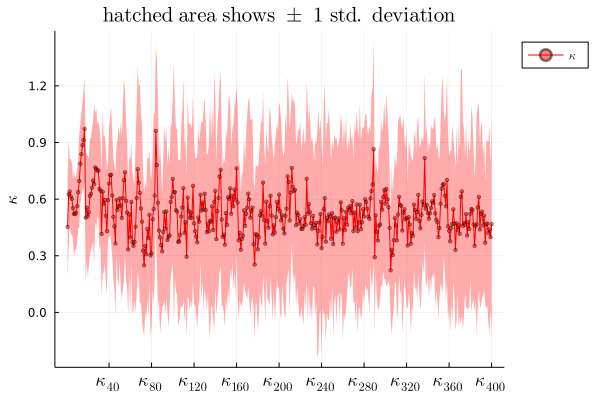

In [83]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedUnboundedResults, ribbon = std_stackedUnboundedResults, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    title="\$\\textrm{hatched\\ area\\ shows\\ }\\pm\\textrm{\\ 1\\ std.\\ deviation}\$")

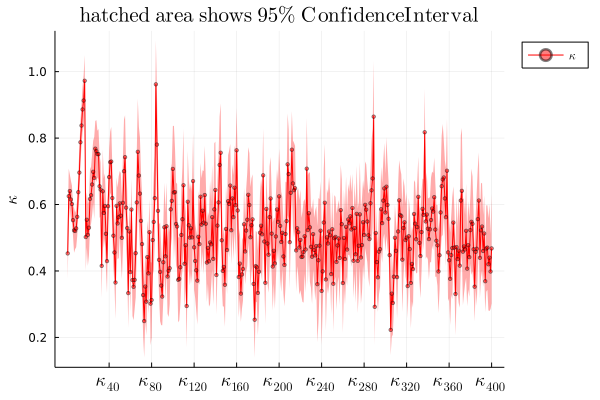

In [98]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedUnboundedResults, ribbon = ConfInterval_stackedUnboundedResults, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    title="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$")

In [99]:
stackedBoundedResults = reduce(hcat, BoundedResults)
mean_stackedBoundedResults= mean(stackedBoundedResults, dims=2)
std_stackedBoundedResults = std(stackedBoundedResults, dims=2)
ConfInterval_stackedBoundedResults = (std_stackedBoundedResults/(sqrt(NIterations))) .* tValue 

400×1 Matrix{Float64}:
 0.09780595733206035
 0.020633719408609728
 0.019572745238047237
 0.0185948695820385
 0.018790570341506448
 0.018398862739638675
 0.018626277356746504
 0.022202701785671918
 0.018970408257986595
 0.020056122291011873
 0.016087645460563425
 0.016101938545065985
 0.012627816953436673
 ⋮
 0.07456213130258199
 0.07039635769202923
 0.07396619733246249
 0.07069777968124026
 0.0642379056131812
 0.06989517385557863
 0.07739802266516595
 0.0781261162394352
 0.07737157475991546
 0.07802997035704709
 0.08185759901806135
 0.07724037580991266

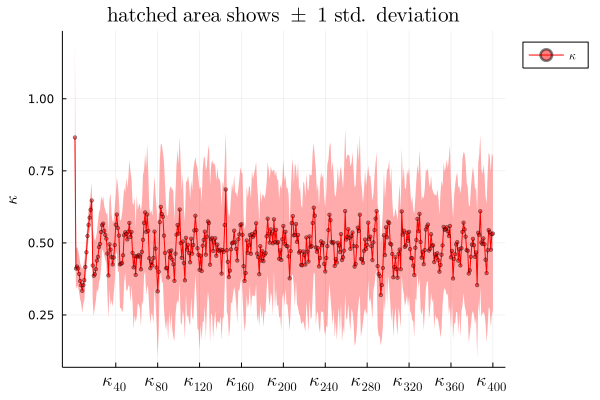

In [86]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults, ribbon = std_stackedBoundedResults, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    title="\$\\textrm{hatched\\ area\\ shows\\ }\\pm\\textrm{\\ 1\\ std.\\ deviation}\$")

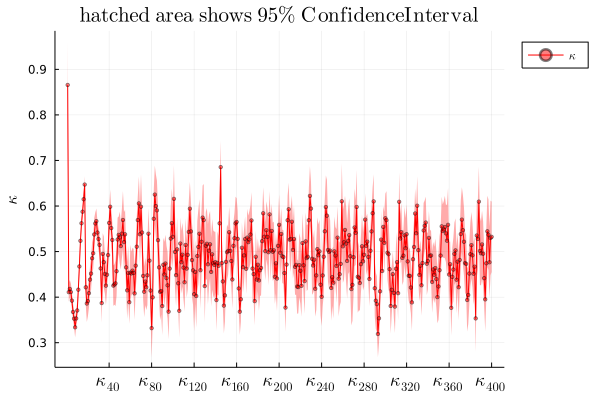

In [100]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults, ribbon = ConfInterval_stackedBoundedResults, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    title="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$")

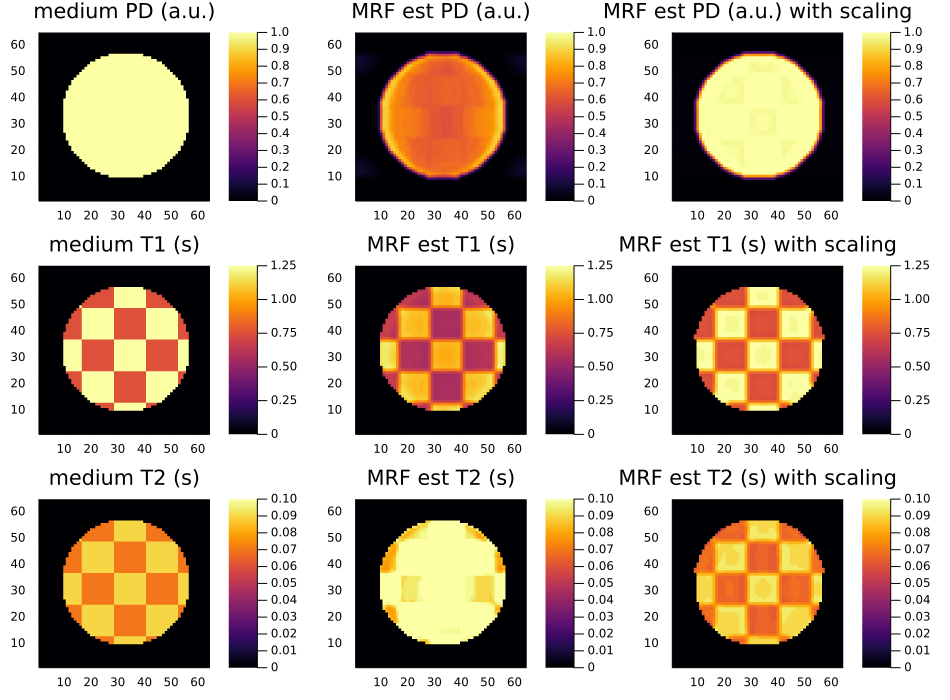

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [380]:
#Compute_MrfEstimates_withScaling(load("30runs_boundfitOverall_scipy1.jld", "sol"))
(estimatedBoundedResultsLogT1, estimatedBoundedResultsLogT2 , estimatedBoundedResultsPD) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults, true, true)
estimatedBoundedResultsT1 = exp.(estimatedBoundedResultsLogT1) .* WinFun.(estimatedBoundedResultsPD)
estimatedBoundedResultsT2 = exp.(estimatedBoundedResultsLogT2) .* WinFun.(estimatedBoundedResultsPD);

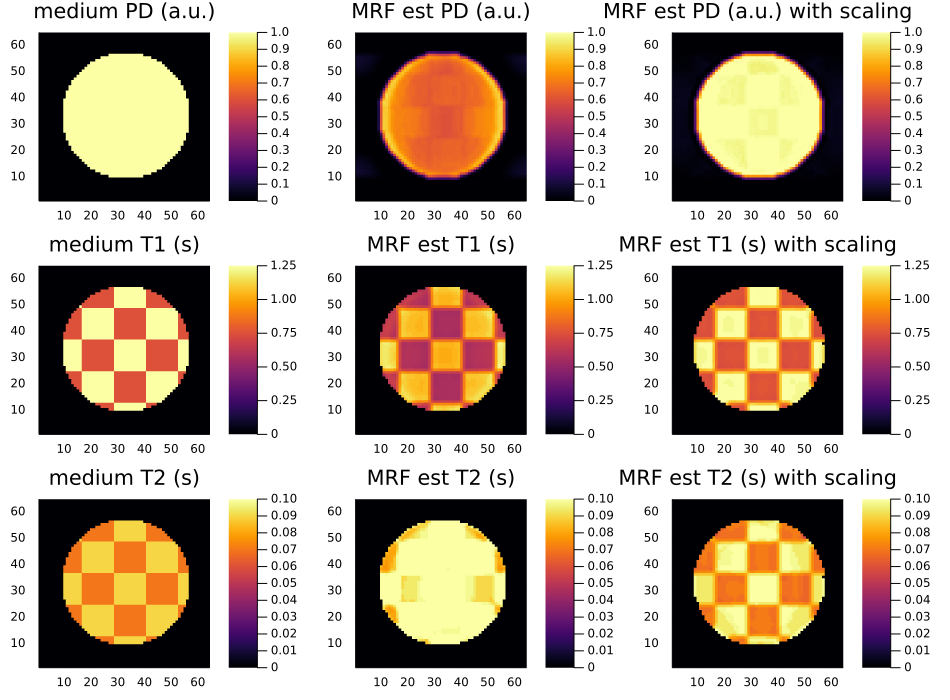

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [381]:
(estimatedUnboundedResultsLogT1, estimatedUnboundedResultsLogT2 , estimatedUnboundedResultsPD) = Compute_MrfEstimates_withScaling(mean_stackedUnboundedResults, true, true)
estimatedUnboundedResultsT1 = exp.(estimatedUnboundedResultsLogT1) .* WinFun.(estimatedUnboundedResultsPD)
estimatedUnboundedResultsT2 = exp.(estimatedUnboundedResultsLogT2) .* WinFun.(estimatedUnboundedResultsPD);

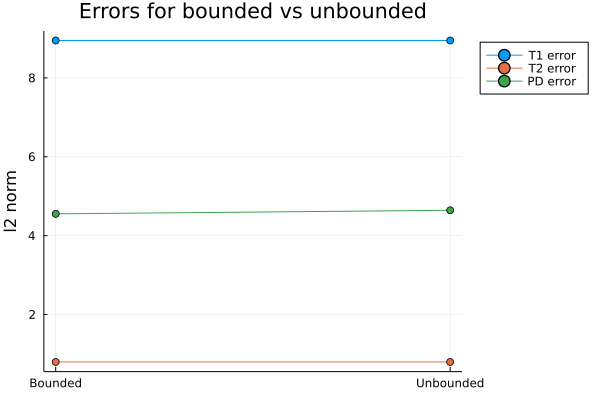

In [383]:
xticks = ["Bounded", "Unbounded"]
plot(xticks, 
    broadcast(norm , [mediumT1 .- estimatedUnboundedResultsT1, mediumT1 .- estimatedUnboundedResultsT1]), ylabel="l2 norm", 
    label="T1 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumT2 .- estimatedUnboundedResultsT2, mediumT2 .- estimatedUnboundedResultsT2]), 
    label="T2 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumPD .- estimatedBoundedResultsPD, mediumPD .- estimatedUnboundedResultsPD]), 
    label="PD error", marker=:circle, legend=:outertopright)
title!("Errors for bounded vs unbounded")

# Vary factor for $\lambda_0$

In [642]:
#Iteration parameters
IterationFactor = 4
NIterations = nWorkersDesired * IterationFactor

16

In [102]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(1), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Fac1 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Fac1, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

848.941608 seconds (655 allocations: 267.578 KiB)


4

### digress to see effect of adding penalty

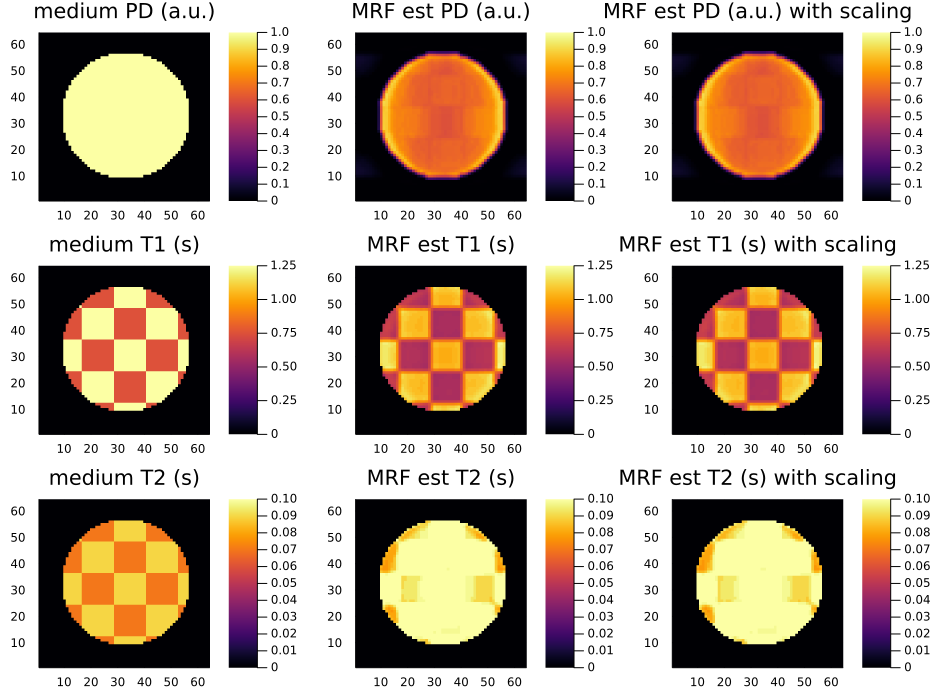

 35.067191 seconds (648 allocations: 266.875 KiB)
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [399]:
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(1), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType,
                            "penalty factor" => 1)

Results_Penalty1 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(Results_Penalty1, SciPyOptimizer, nWorkersDesired, PreComputedParams)
stackedResults_Penalty1 = reduce(hcat, Results_Penalty1)
mean_stackedResults_Penalty1 = mean(stackedResults_Penalty1, dims=2)
(estimatedLogT1_Penalty1, estimatedLogT2_Penalty1, estimatedPD_Penalty1) = Compute_MrfEstimates_withScaling(mean_stackedResults_Penalty1, 
                                                                                 true, true)

estimatedT1_Penalty1 = exp.(estimatedLogT1_Penalty1) .* WinFun.(estimatedPD_Penalty1)
estimatedT2_Penalty1 = exp.(estimatedLogT2_Penalty1) .* WinFun.(estimatedPD_Penalty1);

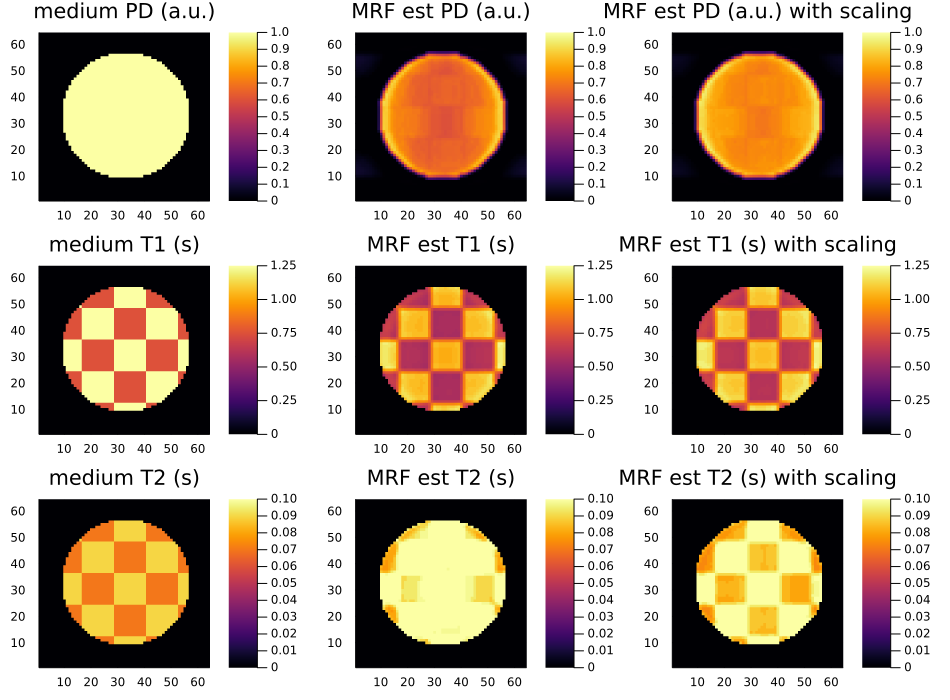

 35.486261 seconds (634 allocations: 266.297 KiB)
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [409]:
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(1), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType,
                            "penalty factor" => 0.01)

Results_Penalty2 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(Results_Penalty2, SciPyOptimizer, nWorkersDesired, PreComputedParams)
stackedResults_Penalty2 = reduce(hcat, Results_Penalty2)
mean_stackedResults_Penalty2 = mean(stackedResults_Penalty2, dims=2)
(estimatedLogT1_Penalty2, estimatedLogT2_Penalty2, estimatedPD_Penalty2) = Compute_MrfEstimates_withScaling(mean_stackedResults_Penalty2, 
                                                                                 true, true)

estimatedT1_Penalty2 = exp.(estimatedLogT1_Penalty2) .* WinFun.(estimatedPD_Penalty2)
estimatedT2_Penalty2 = exp.(estimatedLogT2_Penalty2) .* WinFun.(estimatedPD_Penalty2);

In [643]:
#vcat(1e-5:1e-5:1e-4, LinRange(0.0001, 0.01, 11)[2:end])
collect(LinRange(5e-5, 0.01, 20))

20-element Vector{Float64}:
 5.0e-5
 0.0005736842105263158
 0.0010973684210526316
 0.0016210526315789473
 0.002144736842105263
 0.002668421052631579
 0.0031921052631578945
 0.0037157894736842105
 0.0042394736842105265
 0.0047631578947368415
 0.0052868421052631575
 0.005810526315789474
 0.006334210526315789
 0.006857894736842105
 0.007381578947368421
 0.007905263157894736
 0.008428947368421053
 0.00895263157894737
 0.009476315789473683
 0.01

In [645]:
Params = Dict("M at reference" => signalM , 
             "JacobianM at reference" => JacobianM_atθ₀ , 
              "PSF coefficients" => PSF_coefficients, 
              "lambda0" => Compute_λ₀(1), 
               "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
               "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
               "NoOfSamples" => nSamples, 
               "FloatType" => TheFloatType,
               "penalty factor" => 1)

PenaltyTestDict = OrderedDict{String, Dict{String , Array{TheFloatType,2}}}() 
penaltyFactorList = LinRange(5e-5, 0.01, 20)     #vcat(1e-5:1e-5:1e-4, LinRange(0.0001, 0.01, 11)[2:end])

@time for (idx, i) = enumerate(penaltyFactorList)
    println("index:$idx, value:$i")
    Params["penalty factor"] = i
    Results = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)  
    MrfOptim.Optimizer(Results, SciPyOptimizer, nWorkersDesired, Params)
    stackedResults = reduce(hcat, Results)
    mean_stackedResults = mean(stackedResults, dims=2)
    (estLogT1, estLogT2, estPD) = Compute_MrfEstimates_withScaling(mean_stackedResults, false, true)
    estT1 = exp.(estLogT1) .* WinFun.(estPD) 
    estT2 = exp.(estLogT2) .* WinFun.(estPD)
    
    PenaltyTestDict["Fit$idx"] = Dict("kappa" => mean_stackedResults,
                                      "T1" => estT1,
                                      "T2" => estT2,
                                      "PD" => estPD)  
end

index:1, value:5.0e-5
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:2, value:0.0005736842105263158
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:3, value:0.0010973684210526316
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:4, value:0.0016210526315789473
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 8.7267e-01, final cost 3.7311e-03, first-order optimality 1.50e-08.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 9.2982e-01, final cost 3.7311e-03, first-order optimality 7.15e-09.
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 6, initial cost 1.0543e+00, final cost 3.9318e-03, first-order opt

      From worker 4:	Function evaluations 8, initial cost 7.1126e-02, final cost 2.3823e-04, first-order optimality 3.36e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 7.1976e-02, final cost 2.3823e-04, first-order optimality 2.11e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 7.5801e-02, final cost 2.6905e-04, first-order optimality 3.31e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 3:	`ftol` termination condition is satisfied.
      From worker 3:	Function evaluations 6, initial cost 8.8215e-01, final cost 3.7311e-03, first-order optimality 4.49e-08.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 9.8465e-01, final cost 3.7311e-03, first-order optimality 9.01e-09.
      From worker 3:	`gtol` termination condition 

      From worker 3:	Function evaluations 7, initial cost 9.5073e-02, final cost 2.3823e-04, first-order optimality 2.96e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 6.4077e-02, final cost 2.3823e-04, first-order optimality 8.55e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 8, initial cost 9.1351e-02, final cost 2.6905e-04, first-order optimality 3.48e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 8.9972e-01, final cost 3.7311e-03, first-order optimality 6.44e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 8.8384e-01, final cost 3.7311e-03, first-order optimality 6.91e-09.
      From worker 2:	`ftol` termination condition 

      From worker 2:	Function evaluations 8, initial cost 1.0652e-01, final cost 2.3823e-04, first-order optimality 3.29e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 5.2556e-02, final cost 2.3823e-04, first-order optimality 9.36e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 7.0727e-02, final cost 2.6905e-04, first-order optimality 8.18e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 9.4402e-01, final cost 3.7311e-03, first-order optimality 1.62e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 9.2727e-01, final cost 3.7311e-03, first-order optimality 1.29e-08.
      From worker 5:	`ftol` termination condition 

      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 7.3189e-02, final cost 2.3823e-04, first-order optimality 4.81e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 4.8775e-02, final cost 2.6905e-04, first-order optimality 2.97e-09.
      From worker 5:	`gtol` termination condition is satisfied.
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:5, value:0.002144736842105263
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:6, value:0.002668421052631579
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:7, value:0.0031921052631578945
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:8, value:0.0037157894

      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 7.2606e-02, final cost 2.0560e-04, first-order optimality 3.95e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 6.1885e-02, final cost 2.0560e-04, first-order optimality 5.59e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 8, initial cost 8.3584e-02, final cost 2.0560e-04, first-order optimality 2.10e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 1.8729e-01, final cost 1.1579e-03, first-order optimality 7.90e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 1.5648e-01, final cost 1.1579e-03, first-order optimality 4.68e-09.
      From worker 3:	`gtol` termination condition 

      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 8, initial cost 8.0910e-02, final cost 2.0560e-04, first-order optimality 2.80e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 8, initial cost 7.2616e-02, final cost 2.0560e-04, first-order optimality 1.70e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 8, initial cost 6.8977e-02, final cost 2.0560e-04, first-order optimality 2.71e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 1.9605e-01, final cost 1.1579e-03, first-order optimality 6.71e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 1.9865e-01, final cost 1.1579e-03, first-order optimality 5.30e-09.
      From worker 2:	`gtol` termination condition 

      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 6.7075e-02, final cost 2.0560e-04, first-order optimality 9.23e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 7.5912e-02, final cost 2.0560e-04, first-order optimality 6.98e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 5.2251e-02, final cost 2.0560e-04, first-order optimality 9.14e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 8, initial cost 1.7213e-01, final cost 1.1579e-03, first-order optimality 1.37e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 1.7916e-01, final cost 1.1579e-03, first-order optimality 8.28e-09.
      From worker 4:	`gtol` termination condition 

      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 8, initial cost 4.6850e-02, final cost 2.0560e-04, first-order optimality 8.32e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 8.6119e-02, final cost 2.0560e-04, first-order optimality 6.08e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 8, initial cost 6.8250e-02, final cost 2.0560e-04, first-order optimality 1.55e-09.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 1.6457e-01, final cost 1.1579e-03, first-order optimality 1.14e-08.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 2.1480e-01, final cost 1.1579e-03, first-order optimality 7.32e-09.
      From worker 5:	`gtol` termination condition 

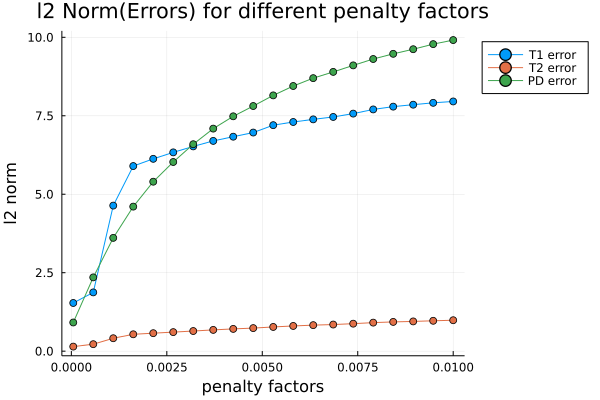

In [694]:
#xticks = log10.(penaltyFactorList)
xticks = penaltyFactorList
referenceT1 = exp.(refImagePsfLogT1).* WinFun.(refImagePsfPD)
referenceT2 = exp.(refImagePsfLogT2).* WinFun.(refImagePsfPD)

plot(xticks, broadcast(norm , [referenceT1 .- PenaltyTestDict["Fit$i"]["T1"] for i =1:20]), ylabel="l2 norm", 
    label="T1 error", marker=:circle)
plot!(xticks, broadcast(norm , [referenceT2 .- PenaltyTestDict["Fit$i"]["T2"] for i =1:20]), 
    label="T2 error", marker=:circle)
plot!(xticks, broadcast(norm , [refImagePsfPD .- PenaltyTestDict["Fit$i"]["PD"] for i =1:20]), xlabel = "penalty factors",
    label="PD error", marker=:circle, legend=:outertopright)
title!("l2 Norm(Errors) for different penalty factors")

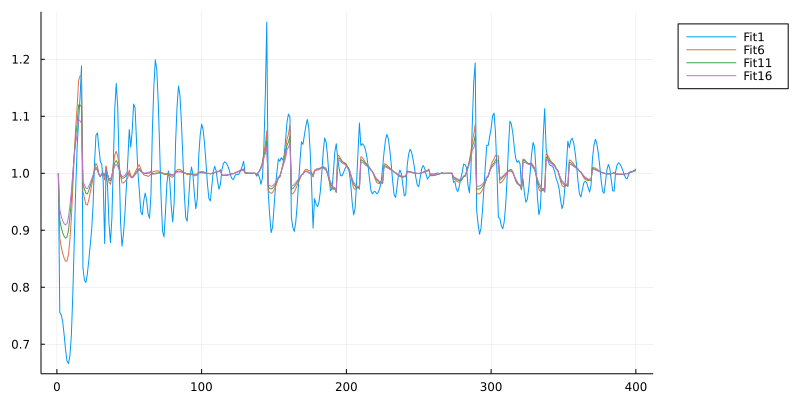

In [647]:
xticks = 1:nSamples
p1 = plot(size=(800,400), dpi=1000)
for i = 1:5:20
    plot!(p1, xticks, PenaltyTestDict["Fit$i"]["kappa"], label="Fit$i", legend=:outertopright)
end
display(p1)

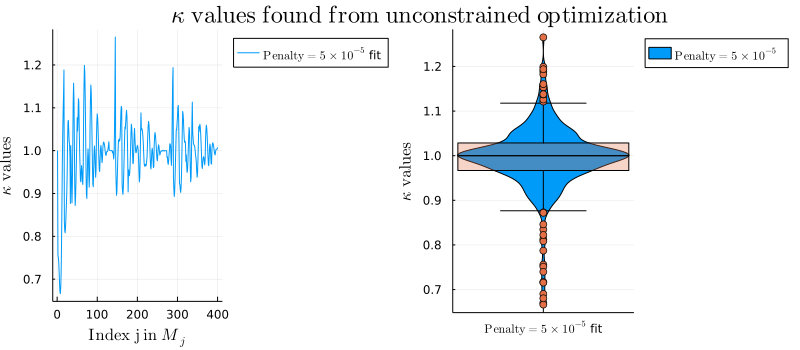

In [673]:
#StatsPlots.violin(["Penaltyfit"], PenaltyTestDict["Fit1"]["kappa"]) 
Plotter(vec(PenaltyTestDict["Fit1"]["kappa"]), "\$\\textrm{Penalty=}5\\times10^{-5}\\textrm{\\ }\$",false, "unconstrained")

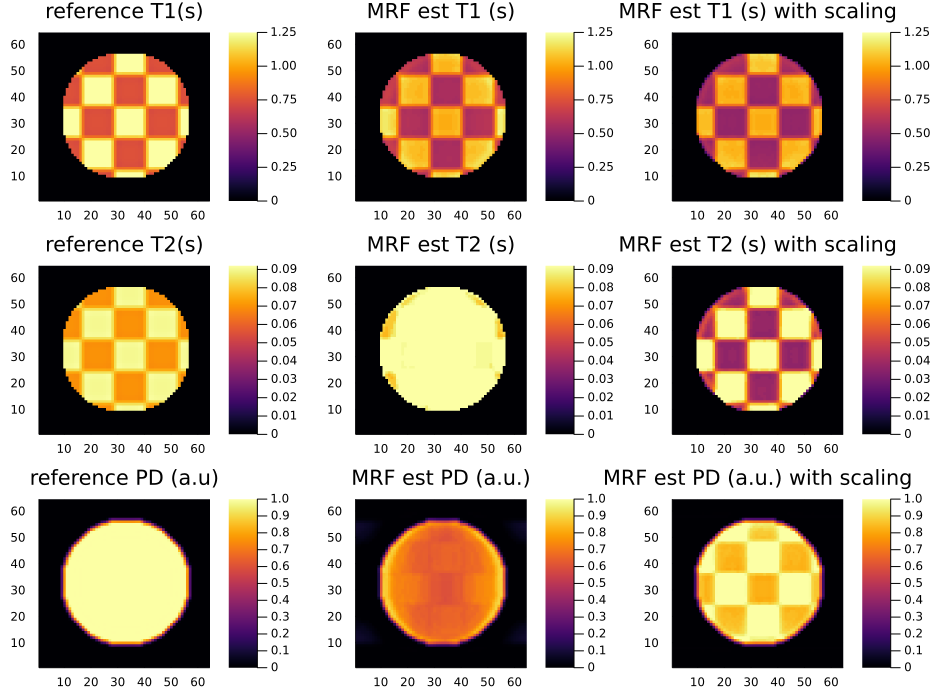

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [695]:
Compute_MrfEstimates_withScaling(PenaltyTestDict["Fit1"]["kappa"], true, false)
# for i = 1:20
#     Compute_MrfEstimates_withScaling(PenaltyTestDict["Fit$i"]["kappa"], true, false)
# end

### effect of changing subsampling factor

In [715]:
#subsampling
nSubSampling = 32 

mriKParCartesian = Array{Any}(undef, 0)

# number of lines in snapshot
nLinesPerSnapshot = div(m1,nSubSampling)

# iShift refers to the position of the first line
# each subsequent snapshot, the pattern is shifted by 1
for iShift = 1:nSubSampling
    i2Lines = [ 1+mod(-1+iShift+j+nSubSampling*k,m2) for
                j=1:nInterval, k=0:nLinesPerSnapshot-1 ]
    #println("i2lines: $(i2Lines)")
    theMriK = MriK4.MriKCartesian(TheFloatType,m1,m2,i2Lines)
    push!(mriKParCartesian,theMriK)
end

mriKParCartesian[1].i2Lines


400×2 Matrix{Int64}:
  2  34
  3  35
  4  36
  5  37
  6  38
  7  39
  8  40
  9  41
 10  42
 11  43
 12  44
 13  45
 14  46
  ⋮  
  6  38
  7  39
  8  40
  9  41
 10  42
 11  43
 12  44
 13  45
 14  46
 15  47
 16  48
 17  49

In [675]:
findall(x -> mriKParCartesian[1].kAxis2[x] == 0, 1:length(mriKParCartesian[1].kAxis2))
# i2_0 = findall(x -> mriKParCartesian[1].kAxis2[x] == 0, 1:length(mriKParCartesian[1].kAxis2))
# @assert length(i2_0) == 1 "multiple k_y = 0 found. Aborting!!"
# i2_0 = i2_0[1]
# println("centre of k-space at i2Line no:$i2_0")

1-element Vector{Int64}:
 33

In [716]:
lambda_0 = Compute_λ₀(1)
CartesianIndicatorFunction = MrfOptim.CartesianIndicatorFunction(mriKParCartesian[1])
PSF_coefficients = MrfOptim.Compute_Yⱼ(CartesianIndicatorFunction, mriKParCartesian[1]) 

zeta_groups = OrderedDict{String, Vector{Int64}}()
for idx = 1:nSubSampling 
    zeta_groups["G$idx"] = [(i-1)*m1 + 1 for i in [idx + (j-1)*nSubSampling for j = 1:nLinesPerSnapshot]]
end


zeta_groupsRepr = [vals[1] for vals in values(zeta_groups)]
zeta_groupsRepr_lambda0 = vcat(values(zeta_groups)...)
zeta_groups

OrderedDict{String, Vector{Int64}} with 32 entries:
  "G1"  => [1, 2049]
  "G2"  => [65, 2113]
  "G3"  => [129, 2177]
  "G4"  => [193, 2241]
  "G5"  => [257, 2305]
  "G6"  => [321, 2369]
  "G7"  => [385, 2433]
  "G8"  => [449, 2497]
  "G9"  => [513, 2561]
  "G10" => [577, 2625]
  "G11" => [641, 2689]
  "G12" => [705, 2753]
  "G13" => [769, 2817]
  "G14" => [833, 2881]
  "G15" => [897, 2945]
  "G16" => [961, 3009]
  "G17" => [1025, 3073]
  "G18" => [1089, 3137]
  "G19" => [1153, 3201]
  "G20" => [1217, 3265]
  "G21" => [1281, 3329]
  "G22" => [1345, 3393]
  "G23" => [1409, 3457]
  "G24" => [1473, 3521]
  "G25" => [1537, 3585]
  ⋮     => ⋮

In [894]:
Params = Dict("M at reference" => signalM , 
             "JacobianM at reference" => JacobianM_atθ₀ , 
              "PSF coefficients" => PSF_coefficients, 
              "lambda0" => Compute_λ₀(1),  
               "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
               "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
               "NoOfSamples" => nSamples, 
               "FloatType" => TheFloatType,
               "penalty factor" => 1)


PenaltyTestDict_Subsamp32 = OrderedDict{String, Dict{String , Array{TheFloatType, 2}}}() 
penaltyFactorList = LinRange(1e-6, 1e-4, 50)     #vcat(1e-5:1e-5:1e-4, LinRange(0.0001, 0.01, 11)[2:end])

@time for (idx, i) = enumerate(penaltyFactorList)
    println("index:$idx, value:$i")
    Params["penalty factor"] = i
    Results = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)  
    MrfOptim.Optimizer(Results, SciPyOptimizer, nWorkersDesired, Params)
    stackedResults = reduce(hcat, Results)
    mean_stackedResults = mean(stackedResults, dims=2)
    (estLogT1, estLogT2, estPD) = Compute_MrfEstimates_withScaling(mean_stackedResults, false, true)
    estT1 = exp.(estLogT1) .* WinFun.(estPD) 
    estT2 = exp.(estLogT2) .* WinFun.(estPD)
    
    PenaltyTestDict_Subsamp32["Fit$idx"] = Dict("kappa" => mean_stackedResults,
                                      "T1" => estT1,
                                      "T2" => estT2,
                                      "PD" => estPD)  
end

index:1, value:1.0e-6
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:2, value:3.020408163265306e-6
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:3, value:5.040816326530611e-6
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:4, value:7.061224489795918e-6
      From worker 5:	Function evaluations 6, initial cost 1.7179e+00, final cost 4.9126e-03, first-order optimality 3.31e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 6, initial cost 1.8562e+00, final cost 5.0134e-03, first-order optimality 4.05e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 6, initial cost 1.8655e+00, final cost 5.0134e-03, first-order optimality 3.74e-08.
      From worker 5:	`ftol` termination condition

      From worker 5:	Function evaluations 7, initial cost 9.9732e-01, final cost 7.7122e-03, first-order optimality 4.47e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 1.0958e+00, final cost 7.7122e-03, first-order optimality 1.92e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 5:	Function evaluations 7, initial cost 1.1437e+00, final cost 7.9568e-03, first-order optimality 3.20e-08.
      From worker 5:	`ftol` termination condition is satisfied.
      From worker 2:	Function evaluations 6, initial cost 1.7743e+00, final cost 4.9126e-03, first-order optimality 5.32e-08.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 2.0033e+00, final cost 5.0134e-03, first-order optimality 6.76e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initi

      From worker 2:	Function evaluations 7, initial cost 1.0041e+00, final cost 7.7122e-03, first-order optimality 4.22e-08.
      From worker 2:	`ftol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 1.0230e+00, final cost 7.7122e-03, first-order optimality 1.98e-08.
      From worker 2:	`ftol` termination condition is satisfied.
      From worker 2:	Function evaluations 7, initial cost 1.1243e+00, final cost 7.9568e-03, first-order optimality 4.87e-08.
      From worker 2:	`ftol` termination condition is satisfied.
      From worker 3:	Function evaluations 6, initial cost 1.7828e+00, final cost 4.9126e-03, first-order optimality 4.07e-08.
      From worker 3:	`ftol` termination condition is satisfied.
      From worker 3:	Function evaluations 6, initial cost 1.8124e+00, final cost 5.0134e-03, first-order optimality 3.52e-08.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initi

      From worker 3:	Function evaluations 7, initial cost 1.0101e+00, final cost 7.7122e-03, first-order optimality 3.10e-08.
      From worker 3:	`ftol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 9.2338e-01, final cost 7.7122e-03, first-order optimality 2.25e-08.
      From worker 3:	`ftol` termination condition is satisfied.
      From worker 3:	Function evaluations 7, initial cost 1.0733e+00, final cost 7.9568e-03, first-order optimality 2.05e-08.
      From worker 3:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 6, initial cost 1.5749e+00, final cost 4.9126e-03, first-order optimality 2.89e-08.
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 6, initial cost 1.8195e+00, final cost 5.0134e-03, first-order optimality 4.71e-08.
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 6, initi

      From worker 4:	Function evaluations 7, initial cost 9.7671e-01, final cost 7.7122e-03, first-order optimality 3.52e-08.
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 1.0382e+00, final cost 7.7122e-03, first-order optimality 3.81e-08.
      From worker 4:	`ftol` termination condition is satisfied.
      From worker 4:	Function evaluations 7, initial cost 1.1819e+00, final cost 7.9568e-03, first-order optimality 4.71e-08.
      From worker 4:	`ftol` termination condition is satisfied.
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:5, value:9.081632653061224e-6
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:6, value:1.110204081632653e-5
nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done
index:7, value:1.3122448979591838e-5
nImage

      From worker 5:	Function evaluations 20, initial cost 5.8813e-02, final cost 1.9268e-05, first-order optimality 7.05e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 15, initial cost 6.9246e-02, final cost 1.9268e-05, first-order optimality 6.28e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 12, initial cost 8.2965e-02, final cost 9.3067e-05, first-order optimality 7.85e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 15, initial cost 5.0301e-02, final cost 5.5990e-05, first-order optimality 6.93e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 12, initial cost 6.2780e-02, final cost 7.3039e-05, first-order optimality 4.08e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 17,

      From worker 3:	Function evaluations 20, initial cost 6.7832e-02, final cost 1.9268e-05, first-order optimality 5.47e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 20, initial cost 8.9194e-02, final cost 1.9268e-05, first-order optimality 7.74e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 12, initial cost 7.5050e-02, final cost 5.5990e-05, first-order optimality 9.41e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 10, initial cost 8.3645e-02, final cost 5.5990e-05, first-order optimality 8.40e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 17, initial cost 7.4790e-02, final cost 5.5990e-05, first-order optimality 4.39e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 10,

      From worker 2:	Function evaluations 18, initial cost 7.2544e-02, final cost 1.9268e-05, first-order optimality 7.90e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 21, initial cost 5.1418e-02, final cost 1.9268e-05, first-order optimality 8.83e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 15, initial cost 5.1731e-02, final cost 5.5990e-05, first-order optimality 9.74e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 16, initial cost 7.4561e-02, final cost 5.5990e-05, first-order optimality 6.05e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 17, initial cost 6.7247e-02, final cost 5.5990e-05, first-order optimality 9.80e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 16,

      From worker 4:	Function evaluations 17, initial cost 9.4642e-02, final cost 1.9268e-05, first-order optimality 8.24e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 14, initial cost 6.6745e-02, final cost 1.9268e-05, first-order optimality 6.36e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 16, initial cost 7.5177e-02, final cost 5.5990e-05, first-order optimality 7.25e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 13, initial cost 5.4083e-02, final cost 5.5990e-05, first-order optimality 5.36e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 18, initial cost 5.1937e-02, final cost 5.5990e-05, first-order optimality 7.68e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 12,

      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 7.3086e-02, final cost 3.4227e-04, first-order optimality 5.43e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 8, initial cost 5.0796e-02, final cost 3.6631e-04, first-order optimality 7.43e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 7.0175e-02, final cost 3.6631e-04, first-order optimality 2.86e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 8.1471e-02, final cost 3.6631e-04, first-order optimality 6.68e-10.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 6.2393e-02, final cost 3.6631e-04, first-order optimality 1.88e-09.
      From worker 4:	`gtol` termination condition 

      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 8.0921e-02, final cost 3.4227e-04, first-order optimality 6.67e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 7.4598e-02, final cost 3.6631e-04, first-order optimality 7.58e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 6.8826e-02, final cost 3.6631e-04, first-order optimality 5.33e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 8.6432e-02, final cost 3.6631e-04, first-order optimality 3.90e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 8.3298e-02, final cost 3.6631e-04, first-order optimality 5.17e-09.
      From worker 2:	`gtol` termination condition 

      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 7.3891e-02, final cost 3.4227e-04, first-order optimality 3.22e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 7.5301e-02, final cost 3.6631e-04, first-order optimality 7.47e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 7.3233e-02, final cost 3.6631e-04, first-order optimality 5.37e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 8.5145e-02, final cost 3.6631e-04, first-order optimality 6.52e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 10, initial cost 9.9913e-02, final cost 3.6631e-04, first-order optimality 2.70e-09.
      From worker 3:	`gtol` termination condition

      From worker 5:	Function evaluations 9, initial cost 7.8970e-02, final cost 3.4227e-04, first-order optimality 6.11e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 6.3786e-02, final cost 3.6631e-04, first-order optimality 5.90e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 8.8886e-02, final cost 3.6631e-04, first-order optimality 3.68e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 7.0545e-02, final cost 3.6631e-04, first-order optimality 4.25e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 7.1590e-02, final cost 3.6631e-04, first-order optimality 5.56e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initi

      From worker 4:	Function evaluations 9, initial cost 7.0378e-02, final cost 5.8192e-04, first-order optimality 2.25e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 9.2526e-02, final cost 6.0152e-04, first-order optimality 3.27e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 7.8697e-02, final cost 6.0152e-04, first-order optimality 2.77e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 6.7722e-02, final cost 6.0152e-04, first-order optimality 1.66e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initial cost 1.1337e-01, final cost 6.0152e-04, first-order optimality 2.76e-09.
      From worker 4:	`gtol` termination condition is satisfied.
      From worker 4:	Function evaluations 9, initi

      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 8.0489e-02, final cost 6.0152e-04, first-order optimality 1.54e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 9.2614e-02, final cost 6.0152e-04, first-order optimality 3.09e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 9.8878e-02, final cost 6.0152e-04, first-order optimality 3.95e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 8, initial cost 7.0516e-02, final cost 6.0152e-04, first-order optimality 6.04e-09.
      From worker 2:	`gtol` termination condition is satisfied.
      From worker 2:	Function evaluations 9, initial cost 1.0418e-01, final cost 6.2084e-04, first-order optimality 1.16e-09.
      From worker 2:	`gtol` termination condition 

      From worker 3:	Function evaluations 9, initial cost 9.4512e-02, final cost 5.8192e-04, first-order optimality 1.99e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 8.5268e-02, final cost 6.0152e-04, first-order optimality 2.52e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 7.0110e-02, final cost 6.0152e-04, first-order optimality 9.45e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 9.7247e-02, final cost 6.0152e-04, first-order optimality 1.68e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 9, initial cost 7.7259e-02, final cost 6.0152e-04, first-order optimality 2.79e-09.
      From worker 3:	`gtol` termination condition is satisfied.
      From worker 3:	Function evaluations 8, initi

      From worker 5:	Function evaluations 9, initial cost 8.1654e-02, final cost 5.8192e-04, first-order optimality 2.84e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 6.8007e-02, final cost 6.0152e-04, first-order optimality 2.35e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 6.1012e-02, final cost 6.0152e-04, first-order optimality 3.11e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 9.8251e-02, final cost 6.0152e-04, first-order optimality 6.22e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initial cost 1.0266e-01, final cost 6.0152e-04, first-order optimality 2.15e-09.
      From worker 5:	`gtol` termination condition is satisfied.
      From worker 5:	Function evaluations 9, initi

In [904]:
penaltyFactorList

50-element LinRange{Float64, Int64}:
 1.0e-6,3.02041e-6,5.04082e-6,7.06122e-6,…,9.59592e-5,9.79796e-5,0.0001

In [910]:
overall_norms = broadcast(norm, [MrfOptim.Compute_OverallResidual(vec(PenaltyTestDict_Subsamp32["Fit$idx"]["kappa"]), 
            Dict("M at reference" => signalM , 
             "JacobianM at reference" => JacobianM_atθ₀ , 
              "PSF coefficients" => PSF_coefficients, 
              "lambda0" => Compute_λ₀(1),  
               "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
               "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
               "NoOfSamples" => nSamples, 
               "FloatType" => TheFloatType,
               "penalty factor" => penalty)) for (idx,penalty) = enumerate(penaltyFactorList)])

50-element Vector{Float64}:
 0.006207791386238917
 0.014658271363118678
 0.013442864512614363
 0.01567515007664669
 0.01753994749583579
 0.019157525822637606
 0.02059497929565706
 0.021894151040760357
 0.023083146821182402
 0.02418188162080058
 0.025205050546747473
 0.02616384851394954
 0.027067026844001793
 ⋮
 0.041635386888289286
 0.04202076532110883
 0.04239883692392854
 0.042769902951062866
 0.04313424553106815
 0.04349212929022137
 0.04384380279486281
 0.0441894998544224
 0.04452944069399862
 0.04486383299999343
 0.04519287288906715
 0.04551674575994382

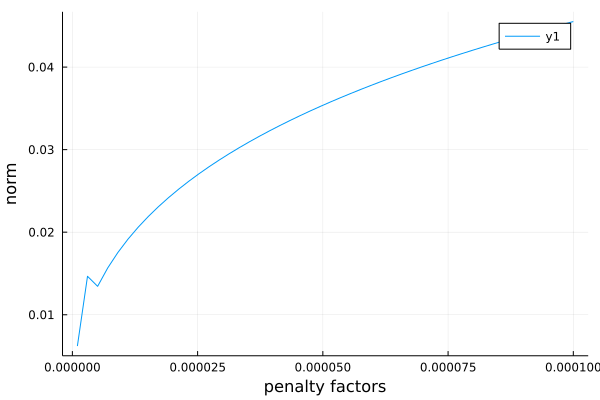

In [912]:
plot(penaltyFactorList, overall_norms, xlabel="penalty factors", ylabel="norm")

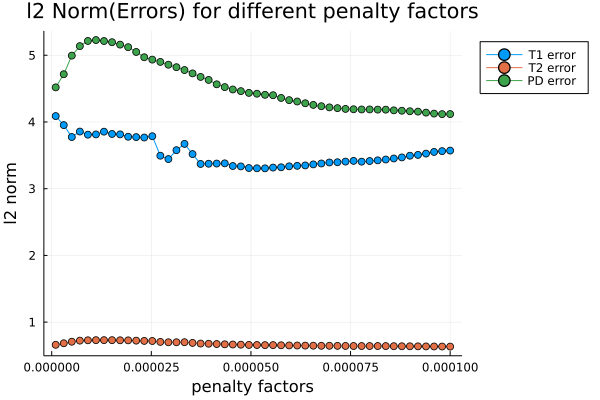

In [896]:
xticks = penaltyFactorList
plot(xticks, broadcast(norm , [referenceT1 .- PenaltyTestDict_Subsamp32["Fit$i"]["T1"] for i =1:50]), ylabel="l2 norm", 
    label="T1 error", marker=:circle)
plot!(xticks, broadcast(norm , [referenceT2 .- PenaltyTestDict_Subsamp32["Fit$i"]["T2"] for i =1:50]), 
    label="T2 error", marker=:circle)
plot!(xticks, broadcast(norm , [refImagePsfPD .- PenaltyTestDict_Subsamp32["Fit$i"]["PD"] for i =1:50]), xlabel = "penalty factors",
    label="PD error", marker=:circle, legend=:outertopright)
title!("l2 Norm(Errors) for different penalty factors")

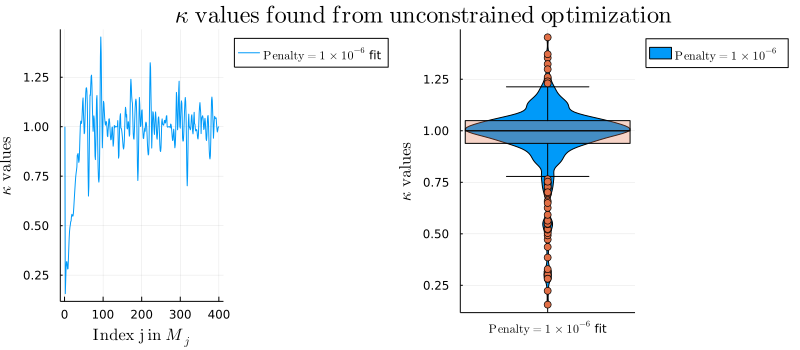

In [923]:
Plotter(vec(PenaltyTestDict_Subsamp32["Fit1"]["kappa"]), 
    "\$\\textrm{Penalty=}1\\times10^{-6}\\textrm{\\ }\$",false, "unconstrained")

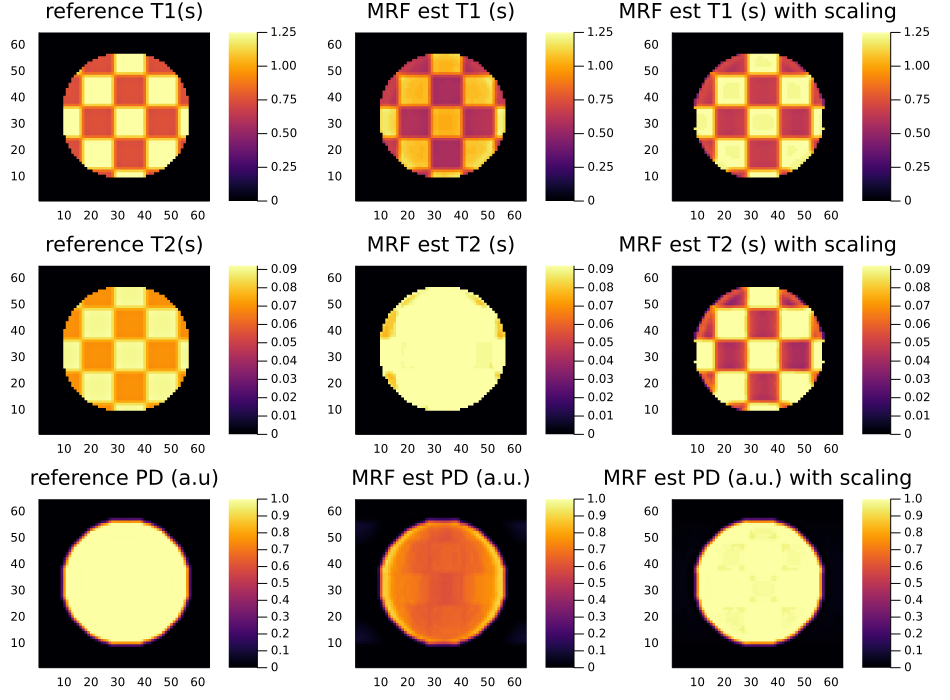

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [924]:
Compute_MrfEstimates_withScaling(PenaltyTestDict_Subsamp32["Fit1"]["kappa"], true, false)

In [919]:
argmin(broadcast(norm , [referenceT2 .- PenaltyTestDict_Subsamp32["Fit$i"]["T2"] for i =1:50]))

50

In [903]:
#argmin(broadcast(norm , [refImagePsfPD .- PenaltyTestDict_Subsamp32["Fit$i"]["PD"] for i =1:50]))

49

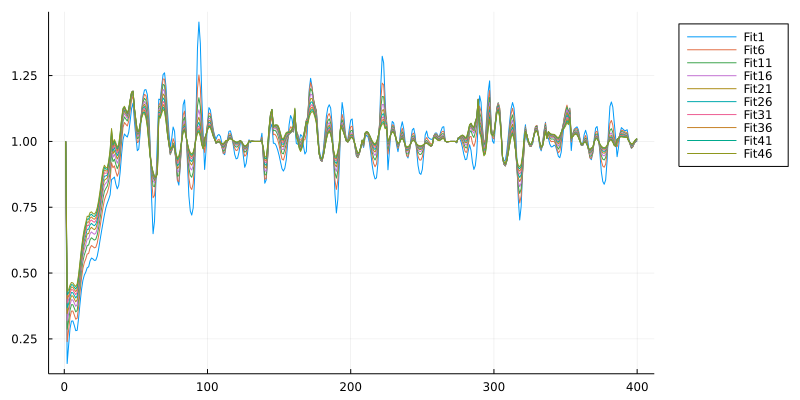

In [914]:
xticks = 1:nSamples
p1 = plot(size=(800,400), dpi=1000)
for i = 1:5:50
    plot!(p1, xticks, PenaltyTestDict_Subsamp32["Fit$i"]["kappa"], label="Fit$i", legend=:outertopright)
end
display(p1)

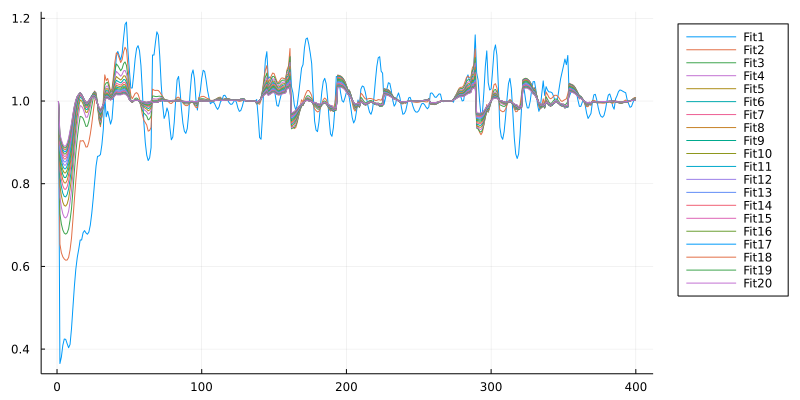

In [686]:
xticks = 1:nSamples
p1 = plot(size=(800,400), dpi=1000)
for i = 1:20
    plot!(p1, xticks, PenaltyTestDict_Subsamp32["Fit$i"]["kappa"], label="Fit$i", legend=:outertopright)
end
display(p1)

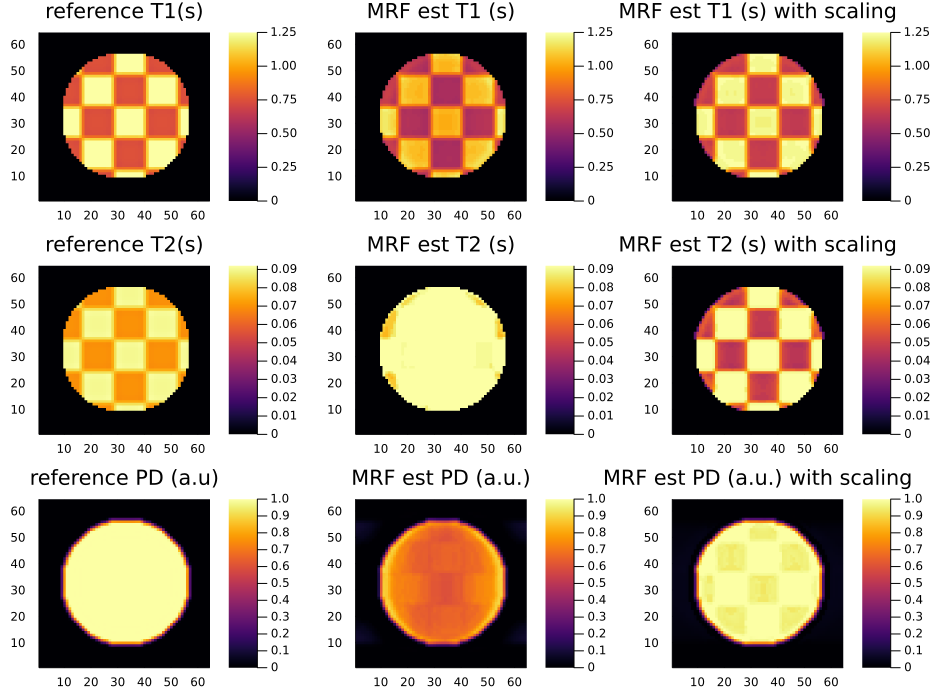

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [692]:
Compute_MrfEstimates_withScaling(PenaltyTestDict_Subsamp32["Fit1"]["kappa"], true, false)

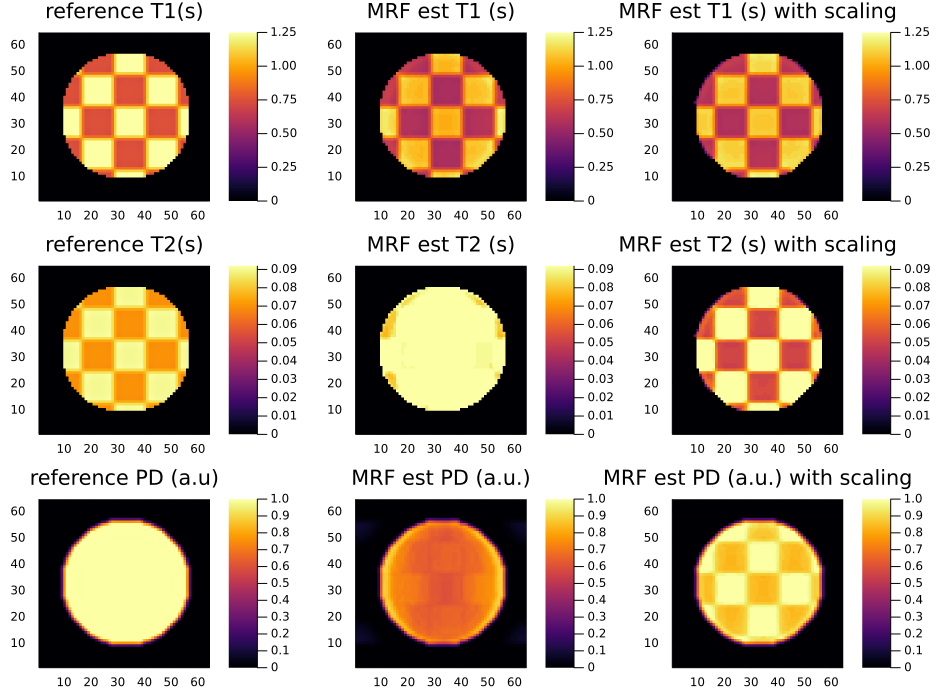

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [699]:
Compute_MrfEstimates_withScaling(PenaltyTestDict_Subsamp32["Fit2"]["kappa"], true, false)

## vary number of samples

In [936]:
function Compute_MrfEstimates_withScaling(optimal_kappas, nSamp, simObj, otherpar)
    
    voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamp)
     # simulate per-voxel signals
    MriSim2.SimT1T2M0_transp(theWorkers, simObj, mediumLogT1, mediumLogT2, mediumPD, otherPar, voxelSignals)

    # create arrays for t1Dict, t2Dict
    t1DictArray = SharedArray{TheFloatType}(nT1,nT2)
    t2DictArray = SharedArray{TheFloatType}(nT1,nT2)
    t1DictArray[:,:] = repeat(t1DictAxis, outer = (1,nT2))
    t2DictArray[:,:] = repeat(reshape(t2DictAxis,1,nT2), inner = (nT1,1))

    dictSignal = SharedArray{Complex{TheFloatType}}(nSamp, nT1, nT2)
    dictOneOverNorms = SharedArray{TheFloatType}(nT1, nT2)

    MrfImaging2.SimT1T2(
            simObj, reshape(t1DictArray, nT1*nT2),reshape(t2DictArray, nT1*nT2),
            otherPar,
            reshape(dictSignal, nSamp, nT1*nT2),
            reshape(dictOneOverNorms, nT1*nT2))

    #scale dictSignal
    scaled_dictSignal = Array{Complex{TheFloatType}}(undef, nSamp, nT1, nT2)
    for i = 1:nT1
        for j = 1:nT2
            scaled_dictSignal[:, i, j] = dictSignal[:, i, j] .* optimal_kappas   #fit["x"] #lm_fit.param
        end
    end

    #compute norms of scaled dictSignal
    scaled_dictOneOverNorms = Array{TheFloatType}(undef, nT1, nT2)
    for i = 1:nT1
        for j = 1:nT2
            scaled_dictOneOverNorms[i,j] = 1/norm(scaled_dictSignal[:,i,j])
        end
    end
    
    #scaled voxelSignals
    scaled_voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamp) 
    for (i, κ) = enumerate(optimal_kappas)     #fit["x"]) #(lm_fit.param) 
        scaled_voxelSignals[:,:,i] .= κ .* voxelSignals[:,:,i] 
    end

    scaled_images = SharedArray{Complex{TheFloatType}}(m1, m2, nSamp)
    ApplyPsfNew2.ApplyPsf(workers(), theMriK, 1:nSamp, scaled_voxelSignals, scaled_images)
    
    scaled_inputData = scaled_images

    # change ordering of array axes (in following time is fast axis)
    scaled_imagesByTrace = SharedArray{Complex{TheFloatType}}(nSamp, m1, m2)

    # transpose to go to new form
    scaled_imagesReshaped  = reshape(scaled_inputData, m1*m2, nSamp)
    scaled_imagesByTraceReshaped = reshape(scaled_imagesByTrace, nSamp, m1*m2)
    LinearAlgebra.transpose!(scaled_imagesByTraceReshaped, scaled_imagesReshaped)
    println("transposition done")
    
    
    # allocate space for estimated MRF parameters
    scaled_estimatedLogT1 = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedLogT2 = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedPD = SharedArray{TheFloatType}(m1, m2)
    scaled_estimatedComplexPD = SharedArray{Complex{TheFloatType}}(m1, m2)

    # work space: complex inner products in MRF (work array)
    nDict = nT1 * nT2
    nSignalBlockMax = 128
    complexInnerProducts =
        SharedArray{Complex{TheFloatType}}(nDict,min(nSignalBlockMax,m1*m2))

    # estimate using the dictionary
    MrfImaging2.MrfEstimate(
        workers(), scaled_dictSignal, t1DictArray, t2DictArray, scaled_dictOneOverNorms,
        scaled_imagesByTraceReshaped,
        reshape(scaled_estimatedLogT1, m1*m2), 
        reshape(scaled_estimatedLogT2, m1*m2),
        reshape(scaled_estimatedComplexPD, m1*m2),
        complexInnerProducts)

    scaled_estimatedPD .= real.(scaled_estimatedComplexPD ./ CpRefValue)
    

    #return estimates
    return (scaled_estimatedLogT1, scaled_estimatedLogT2, scaled_estimatedPD)
  
end
# plot of kappas

Compute_MrfEstimates_withScaling (generic function with 4 methods)

In [937]:
function VariableSamples(nSamp)
    nWorkersDesired = 4

    if nworkers()<nWorkersDesired
        addprocs(nWorkersDesired-nworkers() + (nprocs()==1 ? 1 : 0 ) )
    end

    theWorkers = workers()
    
    subSamplingFactor = 16
    penaltyfactor = 1e-6
    
    mrSequence = ExampleSeq1.NewSeq2(TheFloatType, nSamp, tRConstValue, true, 0.5*tRConstValue)

    # create parameters for discretization and simulation
    (nSampsPerInterval,simObject, otherPars) = ExampleSeq1.SetupPerVoxelSimulationV2(mrSequence)
    simObject.useLogPar = true

    # arrays for a simulated magnetization
    M = Array{Complex{TheFloatType}}(undef, nSamp)
    MriSim2.SimT1T2M0(M, simObject, logT1Ref, logT2Ref, PDRef, otherPars)

    jacob_h = 1e-4
    θ_ref = [logT1Ref, logT2Ref, PDRef]
    JacobianM = Array{Complex{TheFloatType}}(undef, nSamp, 3)

    for (idx, col) = enumerate(eachcol(JacobianM))
        θ = copy(θ_ref)
        θ[idx] =  θ_ref[idx] .+ jacob_h
        M_2 = Array{Complex{TheFloatType}}(undef, nSamp)
        MriSim2.SimT1T2M0(M_2, simObject, θ[1], θ[2], θ[3], otherPars)
        col .= (M_2 - M)/jacob_h
    end

    mriKParCartesian = Array{Any}(undef, 0)

    # number of lines in snapshot
    nLinesPerSnapshot = div(m1, subSamplingFactor)

    # iShift refers to the position of the first line
    # each subsequent snapshot, the pattern is shifted by 1
    for iShift = 1:subSamplingFactor
        i2Lines = [ 1+mod(-1+iShift+j+subSamplingFactor*k,m2) for
                    j=1:nSamp, k=0:nLinesPerSnapshot-1]
        #println("i2lines: $(i2Lines)")
        theMriK = MriK4.MriKCartesian(TheFloatType,m1,m2,i2Lines)
        push!(mriKParCartesian,theMriK)
    end
    
    theMriK = mriKParCartesian[1]

    lambda_0 = Compute_λ₀(1)
    CartesianIndicatorFunction = MrfOptim.CartesianIndicatorFunction(theMriK)
    PSF_coefficients = MrfOptim.Compute_Yⱼ(CartesianIndicatorFunction, theMriK) 

    zeta_groups = OrderedDict{String, Vector{Int64}}()
    for idx = 1:subSamplingFactor
        zeta_groups["G$idx"] = [(i-1)*m1 + 1 for i in [idx + (j-1)*subSamplingFactor for j = 1:nLinesPerSnapshot]]
    end

    zeta_groupsRepr = [vals[1] for vals in values(zeta_groups)]
    zeta_groupsRepr_lambda0 = vcat(values(zeta_groups)...)
    
    #calculate the reference values
    mediumLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumLogT1_Complex .= Complex{TheFloatType}.(mediumLogT1)
    refImagePsfLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumLogT1_Complex, refImagePsfLogT1_Complex)
    refImagePsfLogT1_Complex ./= nSamp
    refImagePsfLogT1 = Array{TheFloatType}(undef, m1, m2)
    refImagePsfLogT1 .= real.(refImagePsfLogT1_Complex)

    mediumLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumLogT2_Complex .= Complex{TheFloatType}.(mediumLogT2)
    refImagePsfLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumLogT2_Complex, refImagePsfLogT2_Complex)
    refImagePsfLogT2_Complex ./= nSamp
    refImagePsfLogT2 = Array{TheFloatType}(undef, m1, m2) 
    refImagePsfLogT2 .= real.(refImagePsfLogT2_Complex)

    println(theWorkers)
    mediumPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumPD_Complex .= Complex{TheFloatType}.(mediumPD)
    refImagePsfPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumPD_Complex, refImagePsfPD_Complex)
    refImagePsfPD_Complex ./= nSamp
    refImagePsfPD = Array{TheFloatType}(undef, m1, m2)
    refImagePsfPD .= real.(refImagePsfPD_Complex) 

    #change from log space
    referenceT1 = exp.(refImagePsfLogT1).* WinFun.(refImagePsfPD)
    referenceT2 = exp.(refImagePsfLogT2).* WinFun.(refImagePsfPD)

    Params = Dict("M at reference" => M , 
                "JacobianM at reference" => JacobianM , 
                "PSF coefficients" => PSF_coefficients, 
                "lambda0" => lambda_0, 
                "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                "NoOfSamples" => nSamp, 
                "FloatType" => TheFloatType,
                "penalty factor" => penaltyfactor)
    
    
    IterationFactor = 4
    NIterations = nWorkersDesired * IterationFactor

    Results = SharedArray{SVector{nSamp, TheFloatType}}(NIterations)  
    #println("nSamples=$nSamp")
    MrfOptim.Optimizer(Results, SciPyOptimizer, nWorkersDesired, Params)
    #println("reached2")
    stackedResults = reduce(hcat, Results)
    mean_stackedResults = mean(stackedResults, dims=2)
    #optimal_kappas, nSamp, simObj, otherpar
    
    #return mean_stackedResults
    (estLogT1, estLogT2, estPD) = Compute_MrfEstimates_withScaling(mean_stackedResults, nSamp, simObject, otherPars)
    
    estT1 = exp.(estLogT1) .* WinFun.(estPD) 
    estT2 = exp.(estLogT2) .* WinFun.(estPD)

     return mean_stackedResults, estT1, estT2, estPD, broadcast(norm, [referenceT1 .- estT1, referenceT2 .- estT2, refImagePsfPD .- estPD])

end

VariableSamples (generic function with 1 method)

In [ ]:
res = VariableSamples(50)

## senstivity analysis

In [889]:
logT1Ref = log.( [ 1.0 ] )
logT2Ref = log.( [ 0.1 ] )
PDRef = [ 1.0 ]
m1 = 64  #128 
m2 = 64  #128
TheFloatType = Float64
tRConstValue = 0.015


function SenstivityAnalysis1(x::Array)
    nWorkersDesired = 4

    if nworkers()<nWorkersDesired
        addprocs(nWorkersDesired-nworkers() + (nprocs()==1 ? 1 : 0 ) )
    end

    theWorkers = workers()
    
    subSamplingFactor = Int64(x[1]) 
    nSamp = Int64(x[2])
    penaltyfactor = x[3] 
    lambda_factor = x[4]
    
    mrSequence = ExampleSeq1.NewSeq2(TheFloatType, nSamp, tRConstValue, true, 0.5*tRConstValue)

    # create parameters for discretization and simulation
    (nSampsPerInterval,simObject, otherPars) = ExampleSeq1.SetupPerVoxelSimulationV2(mrSequence)
    simObject.useLogPar = true

    # arrays for a simulated magnetization
    M = Array{Complex{TheFloatType}}(undef, nSamp)
    MriSim2.SimT1T2M0(M, simObject, logT1Ref, logT2Ref, PDRef, otherPars)

    jacob_h = 1e-4
    θ_ref = [logT1Ref, logT2Ref, PDRef]
    JacobianM = Array{Complex{TheFloatType}}(undef, nSamp, 3)

    for (idx, col) = enumerate(eachcol(JacobianM))
        θ = copy(θ_ref)
        θ[idx] =  θ_ref[idx] .+ jacob_h
        M_2 = Array{Complex{TheFloatType}}(undef, nSamp)
        MriSim2.SimT1T2M0(M_2, simObject, θ[1], θ[2], θ[3], otherPars)
        col .= (M_2 - M)/jacob_h
    end

    mriKParCartesian = Array{Any}(undef, 0)

    # number of lines in snapshot
    nLinesPerSnapshot = div(m1, subSamplingFactor)

    # iShift refers to the position of the first line
    # each subsequent snapshot, the pattern is shifted by 1
    for iShift = 1:subSamplingFactor
        i2Lines = [ 1+mod(-1+iShift+j+subSamplingFactor*k,m2) for
                    j=1:nInterval, k=0:nLinesPerSnapshot-1]
        #println("i2lines: $(i2Lines)")
        theMriK = MriK4.MriKCartesian(TheFloatType,m1,m2,i2Lines)
        push!(mriKParCartesian,theMriK)
    end
    
    theMriK = mriKParCartesian[1]

    lambda_0 = Compute_λ₀(lambda_factor)
    CartesianIndicatorFunction = MrfOptim.CartesianIndicatorFunction(theMriK)
    PSF_coefficients = MrfOptim.Compute_Yⱼ(CartesianIndicatorFunction, theMriK) 

    zeta_groups = OrderedDict{String, Vector{Int64}}()
    for idx = 1:subSamplingFactor
        zeta_groups["G$idx"] = [(i-1)*m1 + 1 for i in [idx + (j-1)*subSamplingFactor for j = 1:nLinesPerSnapshot]]
    end

    zeta_groupsRepr = [vals[1] for vals in values(zeta_groups)]
    zeta_groupsRepr_lambda0 = vcat(values(zeta_groups)...)
    
    #calculate the reference values
    mediumLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumLogT1_Complex .= Complex{TheFloatType}.(mediumLogT1)
    refImagePsfLogT1_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumLogT1_Complex, refImagePsfLogT1_Complex)
    refImagePsfLogT1_Complex ./= nSamp
    refImagePsfLogT1 = Array{TheFloatType}(undef, m1, m2)
    refImagePsfLogT1 .= real.(refImagePsfLogT1_Complex)

    mediumLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumLogT2_Complex .= Complex{TheFloatType}.(mediumLogT2)
    refImagePsfLogT2_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumLogT2_Complex, refImagePsfLogT2_Complex)
    refImagePsfLogT2_Complex ./= nSamp
    refImagePsfLogT2 = Array{TheFloatType}(undef, m1, m2) 
    refImagePsfLogT2 .= real.(refImagePsfLogT2_Complex)

    mediumPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    mediumPD_Complex .= Complex{TheFloatType}.(mediumPD)
    refImagePsfPD_Complex = SharedArray{Complex{TheFloatType}}(m1, m2; pids=theWorkers)
    ApplyPsfNew2.AccumPsf(theWorkers, theMriK, 1:nSamp, mediumPD_Complex, refImagePsfPD_Complex)
    refImagePsfPD_Complex ./= nSamp
    refImagePsfPD = Array{TheFloatType}(undef, m1, m2)
    refImagePsfPD .= real.(refImagePsfPD_Complex) 

    #change from log space
    referenceT1 = exp.(refImagePsfLogT1).* WinFun.(refImagePsfPD)
    referenceT2 = exp.(refImagePsfLogT2).* WinFun.(refImagePsfPD)

    Params = Dict("M at reference" => M , 
                "JacobianM at reference" => JacobianM , 
                "PSF coefficients" => PSF_coefficients, 
                "lambda0" => lambda_0, 
                "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                "NoOfSamples" => nSamp, 
                "FloatType" => TheFloatType,
                "penalty factor" => penaltyfactor)
    
    
    IterationFactor = 4
    NIterations = nWorkersDesired * IterationFactor

    Results = SharedArray{SVector{nSamp, TheFloatType}}(NIterations)  
    
    MrfOptim.Optimizer(Results, SciPyOptimizer, nWorkersDesired, Params)
    stackedResults = reduce(hcat, Results)
    mean_stackedResults = mean(stackedResults, dims=2)
    #optimal_kappas, nSamp, simObj, otherpar
    (estLogT1, estLogT2, estPD) = Compute_MrfEstimates_withScaling(mean_stackedResults, nSamp, simObject, otherPars)
    estT1 = exp.(estLogT1) .* WinFun.(estPD) 
    estT2 = exp.(estLogT2) .* WinFun.(estPD)

    return broadcast(norm, [referenceT1 .- estT1, referenceT2 .- estT2, refImagePsfPD .- estPD])

end

SenstivityAnalysis1 (generic function with 1 method)

In [869]:
#x[1] = subSamplingFactor
#x[2] = nSamples
#x[3] = penaltyfactor
#x[4] = lambda_factor

n = 1000
lb = [8 , 2^6 , 1e-6 , 1]
ub = [32 , 2^9 , 1e-5 , 5]
sampler = SobolSample()

a , b = QuasiMonteCarlo.generate_design_matrices(n , lb , ub , sampler)

2-element Vector{Matrix{Float64}}:
 [8.0703125 20.0703125 … 23.83203125 11.83203125; 176.4375 400.4375 … 191.53125 415.53125; 9.586914062500001e-6 5.0869140625e-6 … 1.63720703125e-6 6.13720703125e-6; 4.96484375 2.96484375 … 4.939453125 2.939453125]
 [18.9921875 30.9921875 … 21.13671875 9.13671875; 317.3125 93.3125 … 93.09375 317.09375; 6.5283203125e-6 2.0283203125e-6 … 9.83740234375e-6 5.33740234375e-6; 4.63671875 2.63671875 … 2.138671875 4.138671875]

In [868]:
function RoundNearestPow2(x)
    if x - prevpow(2, x) <= nextpow(2, x) - x
        return prevpow(2, x) 
    else 
        return nextpow(2,x) 
    end
end

RoundNearestPow2 (generic function with 1 method)

In [870]:
a[1,:] = broadcast(RoundNearestPow2, a[1,:])
a[2, :] = broadcast(RoundNearestPow2, a[2,:])
b[1,:] = broadcast(RoundNearestPow2, b[1,:])
b[2, :] = broadcast(RoundNearestPow2, b[2,:]);

In [885]:
a

4×1000 Matrix{Float64}:
   8.0          16.0         32.0         …   16.0           8.0
 128.0         512.0         64.0            128.0         512.0
   9.58691e-6    5.08691e-6   7.33691e-6       1.63721e-6    6.13721e-6
   4.96484       2.96484      3.96484          4.93945       2.93945

In [887]:
nWorkersDesired = 4

if nworkers()<nWorkersDesired
    addprocs(nWorkersDesired-nworkers() + (nprocs()==1 ? 1 : 0 ) )
end

theWorkers = workers()

4-element Vector{Int64}:
 2
 3
 4
 5

In [893]:
@time res1 = gsa(SenstivityAnalysis1, Sobol(order=[0,1,2]) , a, b)

nIntervalPerWorker and iFirstIntervalPerWorker:
[32, 32, 32, 32]
[1, 33, 65, 97, 129]
nIntervalPerWorker and iFirstIntervalPerWorker:
[32, 32, 32, 32]
[1, 33, 65, 97, 129]


LoadError: On worker 3:
BoundsError: attempt to access 0×0×0 Array{ComplexF64, 3} at index [8193]
Stacktrace:
 [1] [0m[1msetindex![22m
[90m   @ [39m[90m.\[39m[90m[4marray.jl:903[24m[39m[90m [inlined][39m
 [2] [0m[1msetindex![22m
[90m   @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\SharedArrays\src\[39m[90m[4mSharedArrays.jl:512[24m[39m[90m [inlined][39m
 [3] [0m[1msetindex![22m
[90m   @ [39m[90m.\[39m[90m[4msubarray.jl:329[24m[39m[90m [inlined][39m
 [4] [0m[1mfill![22m
[90m   @ [39m[90m.\[39m[90m[4mmultidimensional.jl:1064[24m[39m[90m [inlined][39m
 [5] [0m[1mAccumPsf[22m
[90m   @ [39m[90mC:\Users\Kamlesh\dir1\Thesis_KS\MrfKS\Code1\MriSimCode\MriK1\[39m[90m[4mApplyPsfNew2.jl:90[24m[39m
 [6] [0m[1m#103[22m
[90m   @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:274[24m[39m
 [7] [0m[1mrun_work_thunk[22m
[90m   @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:63[24m[39m
 [8] [0m[1mrun_work_thunk[22m
[90m   @ [39m[90mC:\Users\Kamlesh\AppData\Local\Programs\julia-1.7.2\share\julia\stdlib\v1.7\Distributed\src\[39m[90m[4mprocess_messages.jl:72[24m[39m
 [9] [0m[1m#96[22m
[90m   @ [39m[90m.\[39m[90m[4mtask.jl:423[24m[39m

### digress over

In [103]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(1.5), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Fac2 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Fac2, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

1125.476114 seconds (653 allocations: 268.062 KiB)


4

In [104]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(2), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Fac3 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Fac3, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

2127.190537 seconds (652 allocations: 267.000 KiB)


4

In [105]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(2.5), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Fac4 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Fac4, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

846.370429 seconds (8.66 k allocations: 919.938 KiB, 0.62% gc time)


4

In [106]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀(3), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Fac5 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Fac5, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))

843.808920 seconds (652 allocations: 267.000 KiB)


4

In [110]:
tValue = SciPy.stats.t.ppf(1-0.025, NIterations-1)
stackedBoundedResults_Fac1 = reduce(hcat, BoundedResults_Fac1)
mean_stackedBoundedResults_Fac1= mean(stackedBoundedResults_Fac1, dims=2)
std_stackedBoundedResults_Fac1 = std(stackedBoundedResults_Fac1, dims=2)
ConfInterval_stackedBoundedResults_Fac1 = (std_stackedBoundedResults_Fac1/(sqrt(NIterations))) .* tValue; 

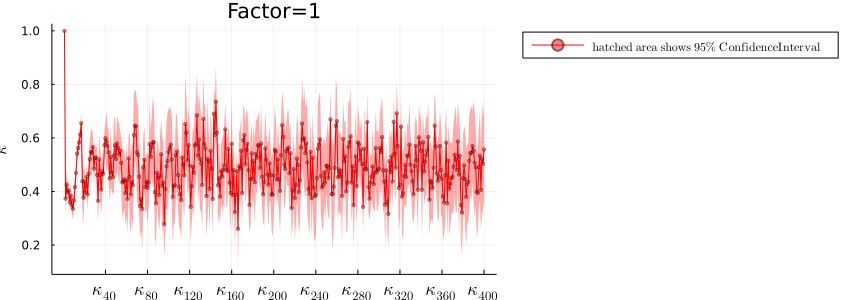

In [119]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults_Fac1, 
    ribbon = ConfInterval_stackedBoundedResults_Fac1, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, #label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    label="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$",
    title = "Factor=1", size=(850,300))

In [121]:
stackedBoundedResults_Fac2 = reduce(hcat, BoundedResults_Fac2)
mean_stackedBoundedResults_Fac2= mean(stackedBoundedResults_Fac2, dims=2)
std_stackedBoundedResults_Fac2 = std(stackedBoundedResults_Fac2, dims=2)
ConfInterval_stackedBoundedResults_Fac2 = (std_stackedBoundedResults_Fac2/(sqrt(NIterations))) .* tValue;

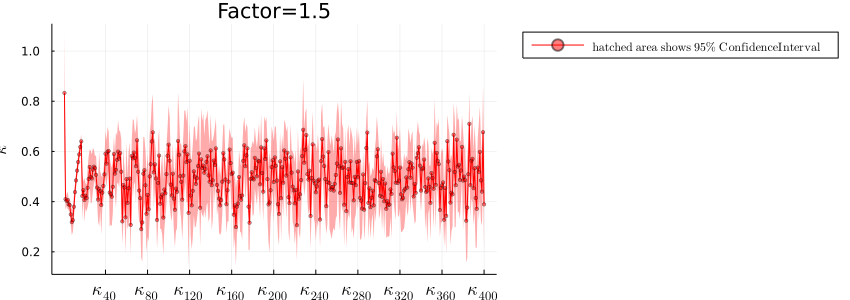

In [122]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults_Fac2, 
    ribbon = ConfInterval_stackedBoundedResults_Fac2, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, #label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    label="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$",
    title = "Factor=1.5", size=(850,300))

In [123]:
stackedBoundedResults_Fac3 = reduce(hcat, BoundedResults_Fac3)
mean_stackedBoundedResults_Fac3= mean(stackedBoundedResults_Fac3, dims=2)
std_stackedBoundedResults_Fac3 = std(stackedBoundedResults_Fac3, dims=2)
ConfInterval_stackedBoundedResults_Fac3 = (std_stackedBoundedResults_Fac3/(sqrt(NIterations))) .* tValue; 

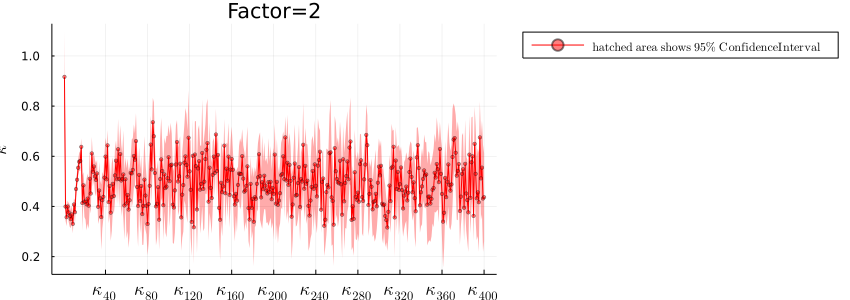

In [124]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults_Fac3, 
    ribbon = ConfInterval_stackedBoundedResults_Fac3, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, #label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    label="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$",
    title = "Factor=2", size=(850,300))

In [125]:
stackedBoundedResults_Fac4 = reduce(hcat, BoundedResults_Fac4)
mean_stackedBoundedResults_Fac4= mean(stackedBoundedResults_Fac4, dims=2)
std_stackedBoundedResults_Fac4 = std(stackedBoundedResults_Fac4, dims=2)
ConfInterval_stackedBoundedResults_Fac4 = (std_stackedBoundedResults_Fac4/(sqrt(NIterations))) .* tValue; 

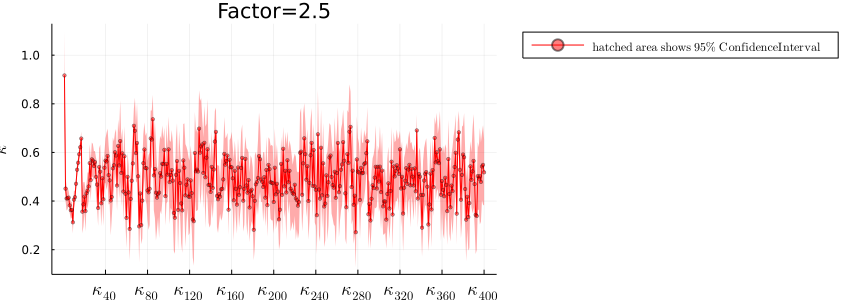

In [126]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults_Fac4, 
    ribbon = ConfInterval_stackedBoundedResults_Fac4, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, #label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    label="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$",
    title = "Factor=2.5", size=(850,300))

In [127]:
stackedBoundedResults_Fac5 = reduce(hcat, BoundedResults_Fac5)
mean_stackedBoundedResults_Fac5= mean(stackedBoundedResults_Fac5, dims=2)
std_stackedBoundedResults_Fac5 = std(stackedBoundedResults_Fac5, dims=2)
ConfInterval_stackedBoundedResults_Fac5 = (std_stackedBoundedResults_Fac5/(sqrt(NIterations))) .* tValue; 

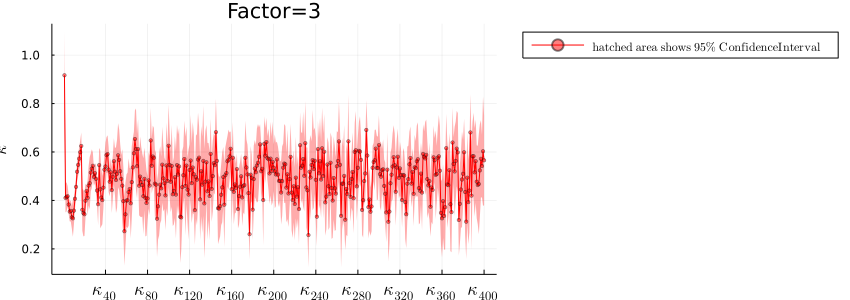

In [128]:
plot(["\$\\kappa_{$i}\$" for i=1:nSamples], mean_stackedBoundedResults_Fac5, 
    ribbon = ConfInterval_stackedBoundedResults_Fac5, 
    color=:red, marker=(:circle, 2, 0.5), fillalpha=0.33, #label="\$\\kappa\$", 
    legend = :outertopright, xtickfontsize=12, ylabel = "\$\\kappa\$", 
    label="\$\\textrm{hatched\\ area\\ shows\\ }95\\%\\textrm{\\ ConfidenceInterval}\$",
    title = "Factor=3", size=(850,300))

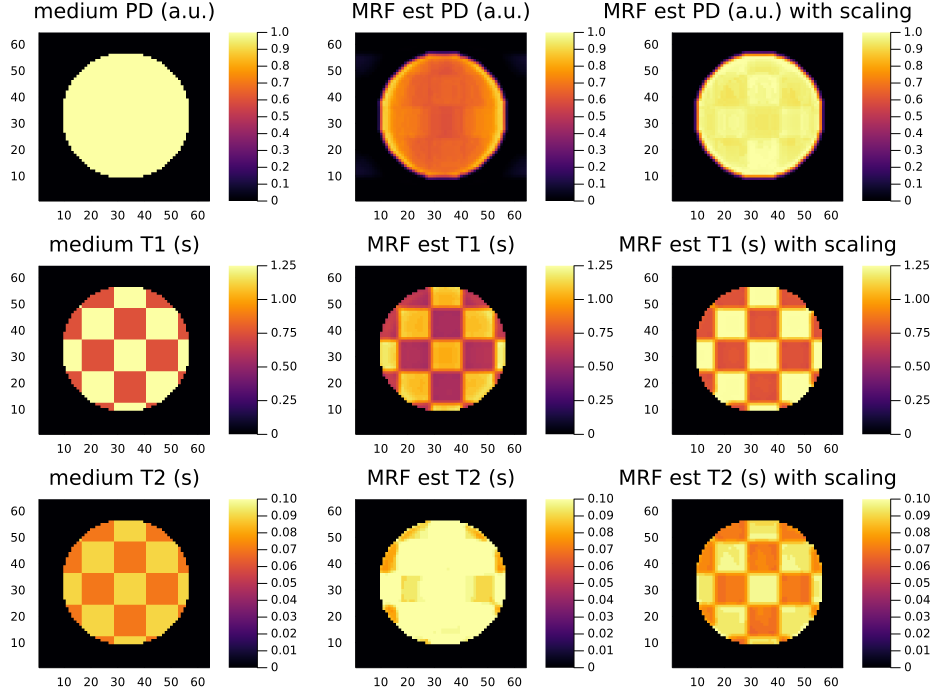

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [141]:
(estimatedLogT1_Fac1, estimatedLogT2_Fac1, estimatedPD_Fac1) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Fac1, 
                                                                                 true, true);

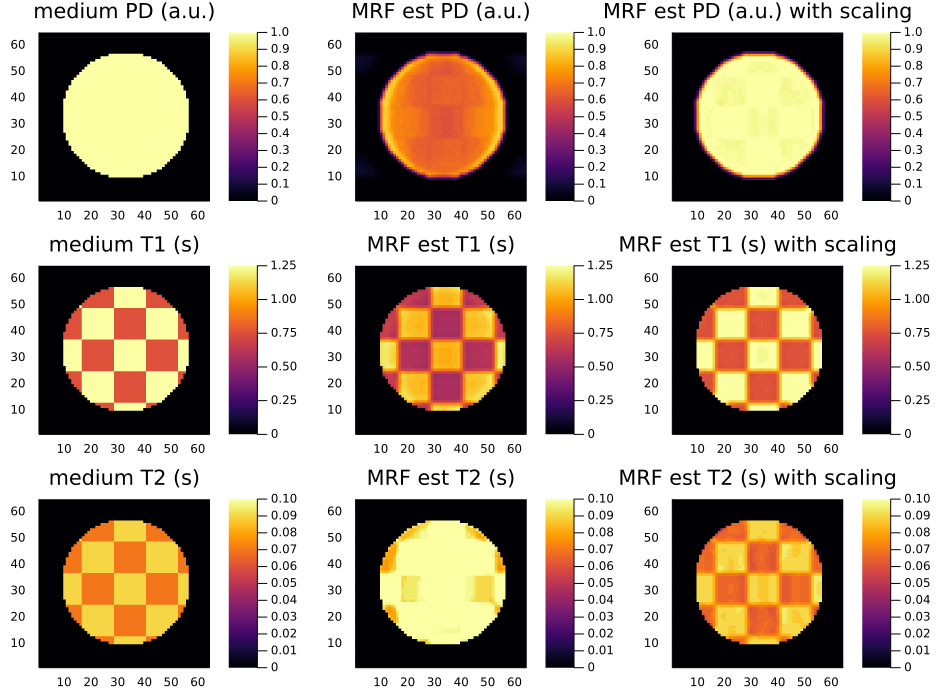

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [142]:
(estimatedLogT1_Fac2, estimatedLogT2_Fac2, estimatedPD_Fac2) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Fac2,
                                                                                                true, true);

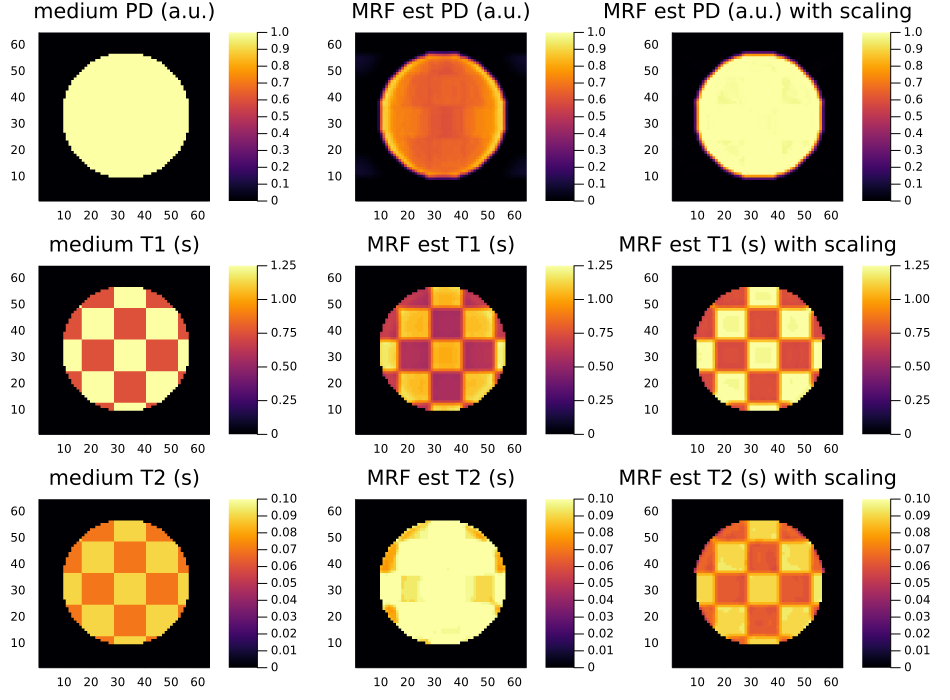

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [143]:
(estimatedLogT1_Fac3, estimatedLogT2_Fac3, estimatedPD_Fac3) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Fac3,
                                                                                                true, true);

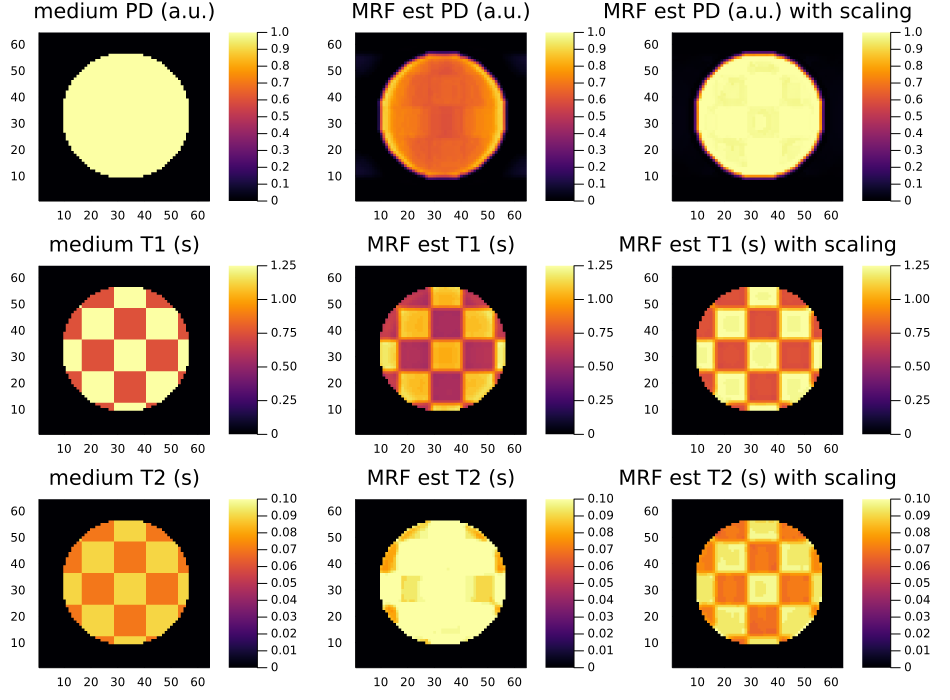

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [144]:
(estimatedLogT1_Fac4, estimatedLogT2_Fac4, estimatedPD_Fac4) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Fac4,
                                                                                                true, true);

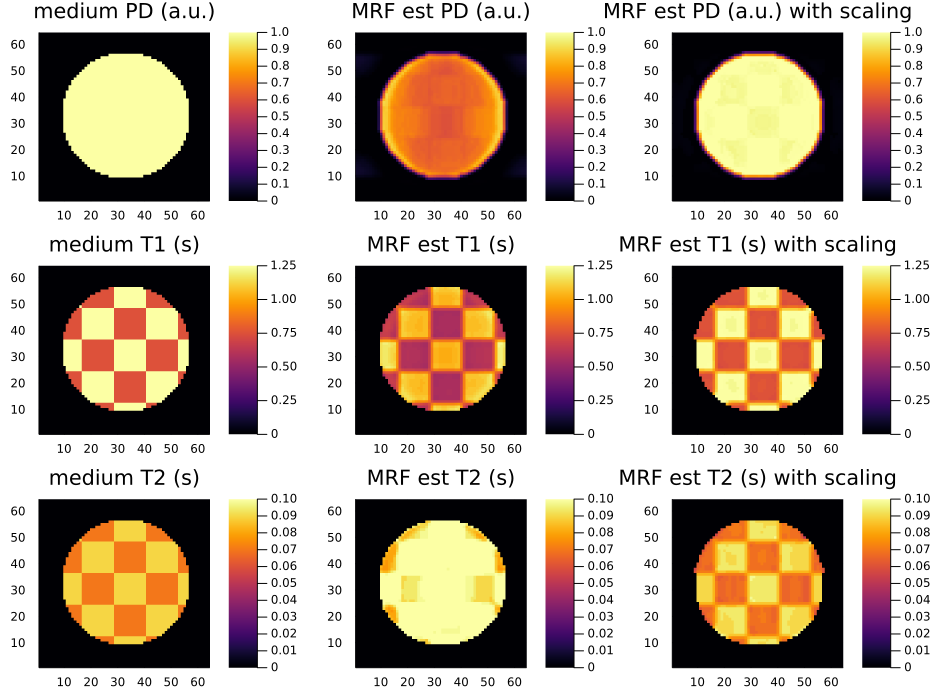

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [154]:
(estimatedLogT1_Fac5, estimatedLogT2_Fac5, estimatedPD_Fac5) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Fac5,
                                                                                                true, true);

## Visualise errors wrt to reference medium values

In [155]:
mediumT1 = exp.(mediumLogT1) .* WinFun.(mediumPD)
estimatedT1_Fac1 = exp.(estimatedLogT1_Fac1) .* WinFun.(estimatedPD_Fac1)
estimatedT1_Fac2 = exp.(estimatedLogT1_Fac2) .* WinFun.(estimatedPD_Fac2)
estimatedT1_Fac3 = exp.(estimatedLogT1_Fac3) .* WinFun.(estimatedPD_Fac3)
estimatedT1_Fac4 = exp.(estimatedLogT1_Fac4) .* WinFun.(estimatedPD_Fac4)
estimatedT1_Fac5 = exp.(estimatedLogT1_Fac5) .* WinFun.(estimatedPD_Fac5)

mediumT2 = exp.(mediumLogT2) .* WinFun.(mediumPD)
estimatedT2_Fac1 = exp.(estimatedLogT2_Fac1) .* WinFun.(estimatedPD_Fac1)
estimatedT2_Fac2 = exp.(estimatedLogT2_Fac2) .* WinFun.(estimatedPD_Fac2)
estimatedT2_Fac3 = exp.(estimatedLogT2_Fac3) .* WinFun.(estimatedPD_Fac3)
estimatedT2_Fac4 = exp.(estimatedLogT2_Fac4) .* WinFun.(estimatedPD_Fac4)
estimatedT2_Fac5 = exp.(estimatedLogT2_Fac5) .* WinFun.(estimatedPD_Fac5)

64×64 Matrix{Float64}:
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  

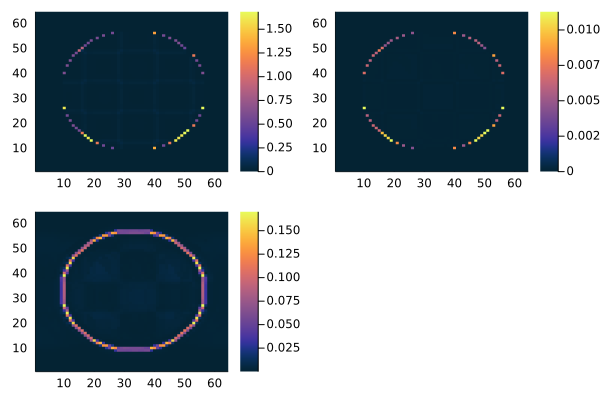

In [384]:
plot(heatmap((mediumT1 .- estimatedT1_Fac1).^2, c = :thermal), heatmap((mediumT2 .- estimatedT2_Fac1).^2, c=:thermal) , 
    heatmap((mediumPD .- estimatedPD_Fac1).^2, c=:thermal))

In [199]:
plotlyjs()

WebIO._IJuliaInit()

In [267]:
s1 = surface(abs.(mediumT1 .- estimatedT1_Fac1), c=:nipy_spectral, 
     title="Errors wrt Reference T1 (Factor=1)")
s2 = surface(abs.(mediumT1 .- estimatedT1_Fac2), c=:nipy_spectral, 
    title="Erros wrt Reference T1 (Factor=1.5)")
s3 = surface(abs.(mediumT1 .- estimatedT1_Fac3), c=:nipy_spectral, 
     title="Erros wrt Reference T1 (Factor=2)")
s4 = surface(abs.(mediumT1 .- estimatedT1_Fac4), c=:nipy_spectral, 
    title="Erros wrt Reference T1 (Factor=2.5)")
s5 = surface(abs.(mediumT1 .- estimatedT1_Fac5), c=:nipy_spectral, 
    title="Erros wrt Reference T1 (Factor=3)")

display(s1)
display(s2)
display(s3)
display(s4)
display(s5)
#colorbar_title="Error Scale",
#plot(s1, s2, s3, s4, s5, layout=(5,1), size=(800,1000))

In [364]:
gr()

Plots.GRBackend()

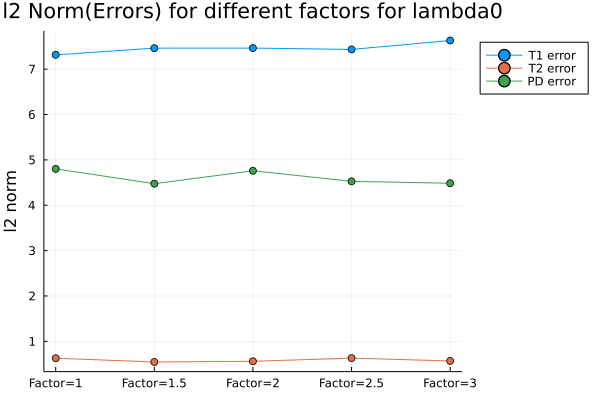

In [372]:
xticks = ["Factor=1", "Factor=1.5","Factor=2","Factor=2.5","Factor=3"]
plot(xticks, 
    broadcast(norm , [mediumT1 .- estimatedT1_Fac1, mediumT1 .- estimatedT1_Fac2, 
    mediumT1 .- estimatedT1_Fac3, mediumT1 .- estimatedT1_Fac4, mediumT1 .- estimatedT1_Fac5]), ylabel="l2 norm", 
    label="T1 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumT2 .- estimatedT2_Fac1, mediumT2 .- estimatedT2_Fac2, 
    mediumT2 .- estimatedT2_Fac3, mediumT2 .- estimatedT2_Fac4, mediumT2 .- estimatedT2_Fac5]), 
    label="T2 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumPD .- estimatedPD_Fac1, mediumPD .- estimatedPD_Fac2, 
    mediumPD .- estimatedPD_Fac3, mediumPD .- estimatedPD_Fac4, mediumPD .- estimatedPD_Fac5]), 
    label="PD error", marker=:circle, legend=:outertopright)
title!("l2 Norm(Errors) for different factors for lambda0")

### using Tukey window for $\lambda_0$

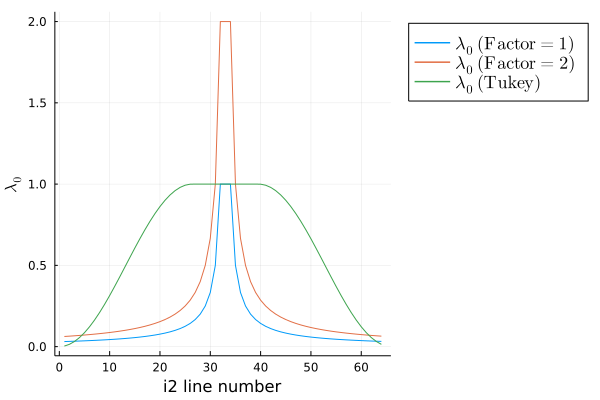

In [376]:
p1 = plot(1:m2, Compute_λ₀(1)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=1)}\$", xlabel = "i2 line number", ylabel = L"\lambda_0", legendfontsize=12)
plot!(1:m2, Compute_λ₀(2)[1, :], label ="\$\\lambda_0\\textrm{\\ (Factor=2)}\$", legendfontsize=12)
plot!(1:m2, Compute_λ₀_Ver1(0.2)[1, :], label ="\$\\lambda_0\\textrm{\\ (Tukey)}\$", legendfontsize=12, legend = :outertopright)

In [360]:
#Iteration parameters
IterationFactor = 3
NIterations = nWorkersDesired * IterationFactor

12

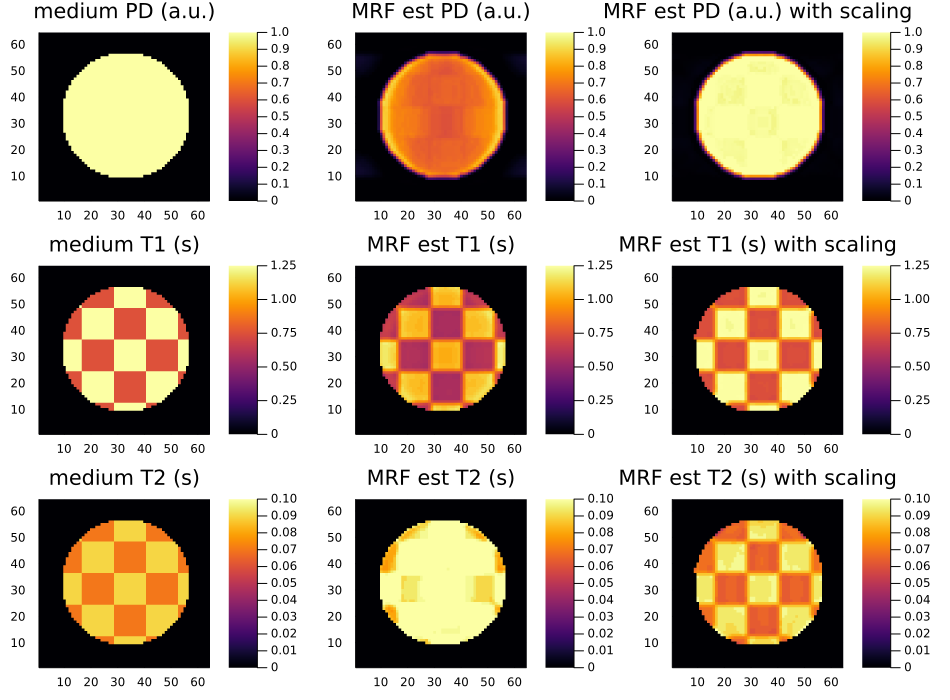

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [377]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀_Ver1(0.1), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Tukey1 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Tukey1, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))
stackedBoundedResults_Tukey1 = reduce(hcat, BoundedResults_Tukey1)
mean_stackedBoundedResults_Tukey1 = mean(stackedBoundedResults_Tukey1, dims=2)
(estimatedLogT1_Tukey1, estimatedLogT2_Tukey1, estimatedPD_Tukey1) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Tukey1, 
                                                                                 true, true)

estimatedT1_Tukey1 = exp.(estimatedLogT1_Tukey1) .* WinFun.(estimatedPD_Tukey1)
estimatedT2_Tukey1 = exp.(estimatedLogT2_Tukey1) .* WinFun.(estimatedPD_Tukey1);

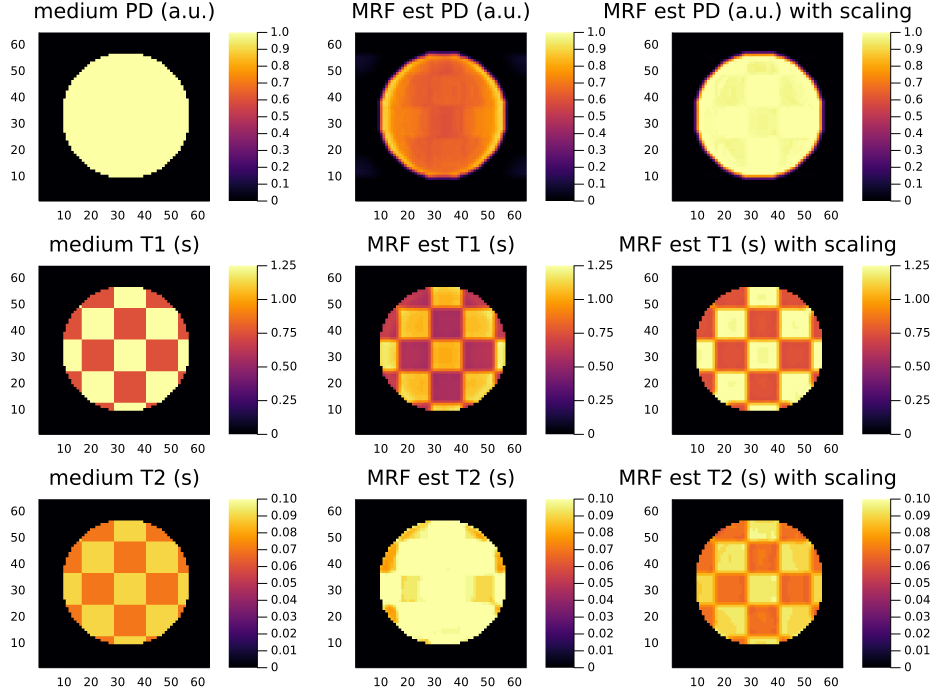

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [378]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀_Ver1(0.3), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Tukey2 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Tukey2, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))
stackedBoundedResults_Tukey2 = reduce(hcat, BoundedResults_Tukey2)
mean_stackedBoundedResults_Tukey2 = mean(stackedBoundedResults_Tukey2, dims=2)
(estimatedLogT1_Tukey2, estimatedLogT2_Tukey2, estimatedPD_Tukey2) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Tukey2, 
                                                                                 true, true)

estimatedT1_Tukey2 = exp.(estimatedLogT1_Tukey2) .* WinFun.(estimatedPD_Tukey2)
estimatedT2_Tukey2 = exp.(estimatedLogT2_Tukey2) .* WinFun.(estimatedPD_Tukey2);

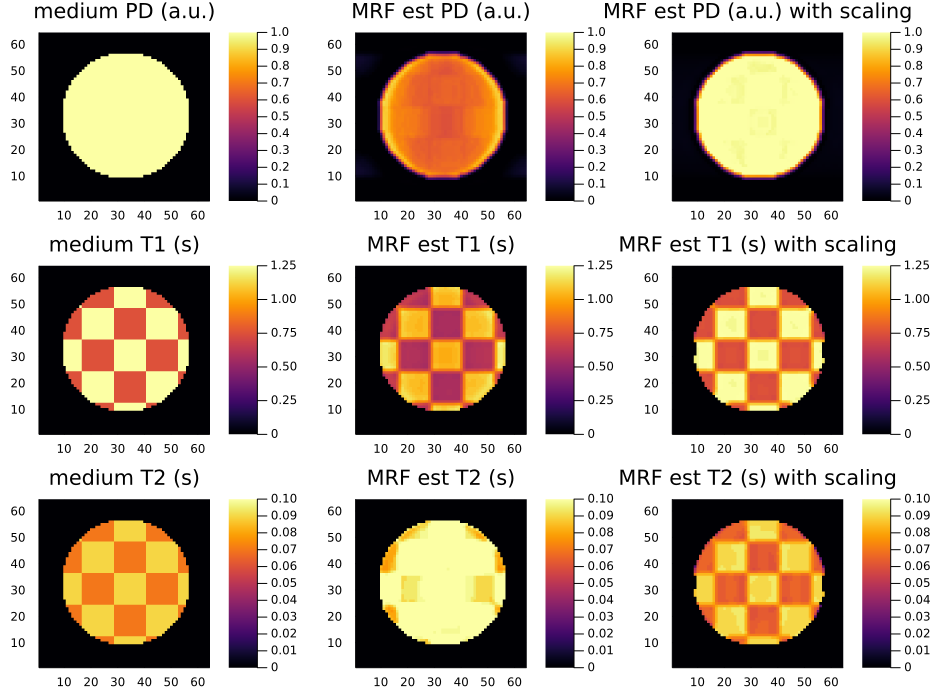

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [379]:
#precomputed parameters
PreComputedParams = Dict("M at reference" => signalM , 
                            "JacobianM at reference" => JacobianM_atθ₀ , 
                            "PSF coefficients" => PSF_coefficients, 
                            "lambda0" => Compute_λ₀_Ver1(0.5), 
                            "kSpaceGroupings for Type2 Error" => zeta_groupsRepr,
                            "kSpaceGrouping for Type1 error" => zeta_groupsRepr_lambda0, 
                            "NoOfSamples" => nSamples, 
                            "FloatType" => TheFloatType)

BoundedResults_Tukey3 = SharedArray{SVector{nSamples, TheFloatType}}(NIterations)   

@time MrfOptim.Optimizer(BoundedResults_Tukey3, SciPyOptimizer, nWorkersDesired, PreComputedParams, Bounds = (0, 1.0))
stackedBoundedResults_Tukey3 = reduce(hcat, BoundedResults_Tukey3)
mean_stackedBoundedResults_Tukey3 = mean(stackedBoundedResults_Tukey3, dims=2)
(estimatedLogT1_Tukey3, estimatedLogT2_Tukey3, estimatedPD_Tukey3) = Compute_MrfEstimates_withScaling(mean_stackedBoundedResults_Tukey3, 
                                                                                 true, true)

estimatedT1_Tukey3 = exp.(estimatedLogT1_Tukey3) .* WinFun.(estimatedPD_Tukey3)
estimatedT2_Tukey3 = exp.(estimatedLogT2_Tukey3) .* WinFun.(estimatedPD_Tukey3);

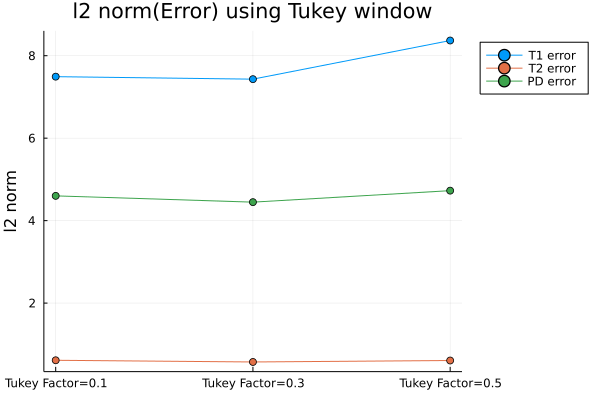

In [375]:
xticks = ["Tukey Factor=0.1", "Tukey Factor=0.3","Tukey Factor=0.5"]
plot(xticks, 
    broadcast(norm , [mediumT1 .- estimatedT1_Tukey1, mediumT1 .- estimatedT1_Tukey2, 
    mediumT1 .- estimatedT1_Tukey3]), ylabel="l2 norm", 
    label="T1 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumT2 .- estimatedT2_Tukey1, mediumT2 .- estimatedT2_Tukey2, 
    mediumT2 .- estimatedT2_Tukey3]), 
    label="T2 error", marker=:circle)
plot!(xticks,broadcast(norm , [mediumPD .- estimatedPD_Tukey1, mediumPD .- estimatedPD_Tukey2, 
    mediumPD .- estimatedPD_Tukey3]), 
    label="PD error", marker=:circle, legend=:outertopright)
title!("l2 norm(Error) using Tukey window")

In [349]:
plotlyjs()

Plots.PlotlyJSBackend()

In [350]:
surface(abs.(mediumT1 .- estimatedT1_Tukey), c=:nipy_spectral, 
     title="Errors wrt Reference T1 (Tukey)")

In [351]:
norm(mediumT1 .- estimatedT1_Tukey)

7.577884166191752

### working

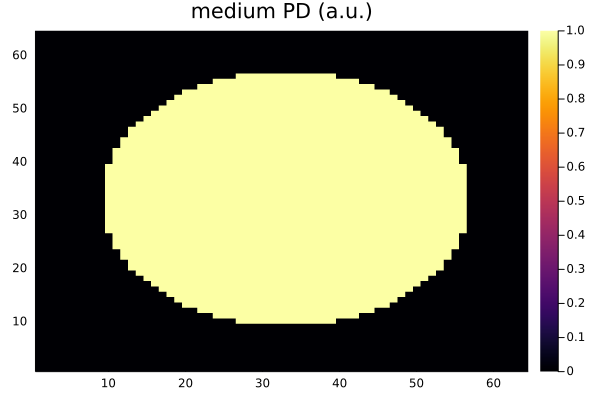

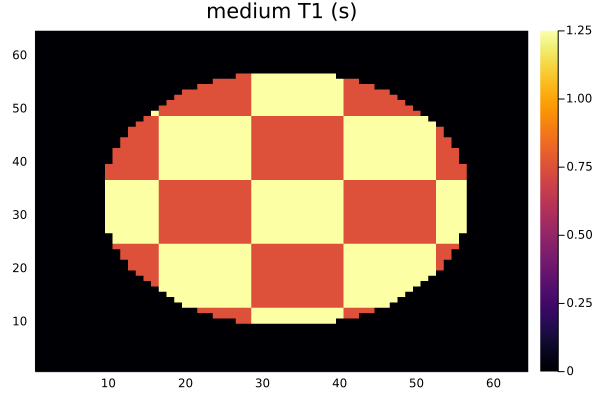

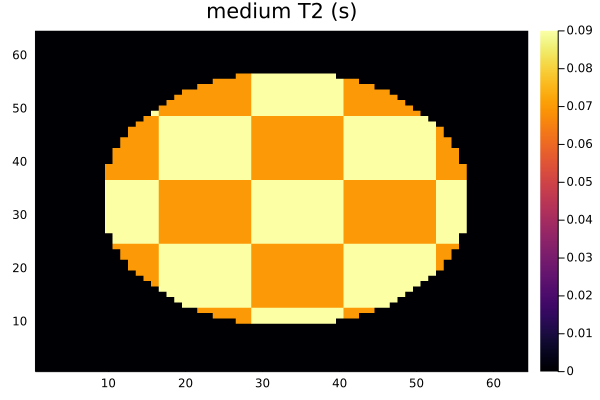

In [219]:
# mediumLogT1 = log.(tmpT1)
# mediumLogT2 = log.(tmpT2)
# mediumPD    = winValues;

# plot PD map
display(heatmap(mediumPD, title="medium PD (a.u.)"))

# plot T1 map
display(heatmap(exp.(mediumLogT1) .* WinFun.(mediumPD), title="medium T1 (s)"))

# plot T2 map
display(heatmap(exp.(mediumLogT2) .* WinFun.(mediumPD), title="medium T2 (s)"))

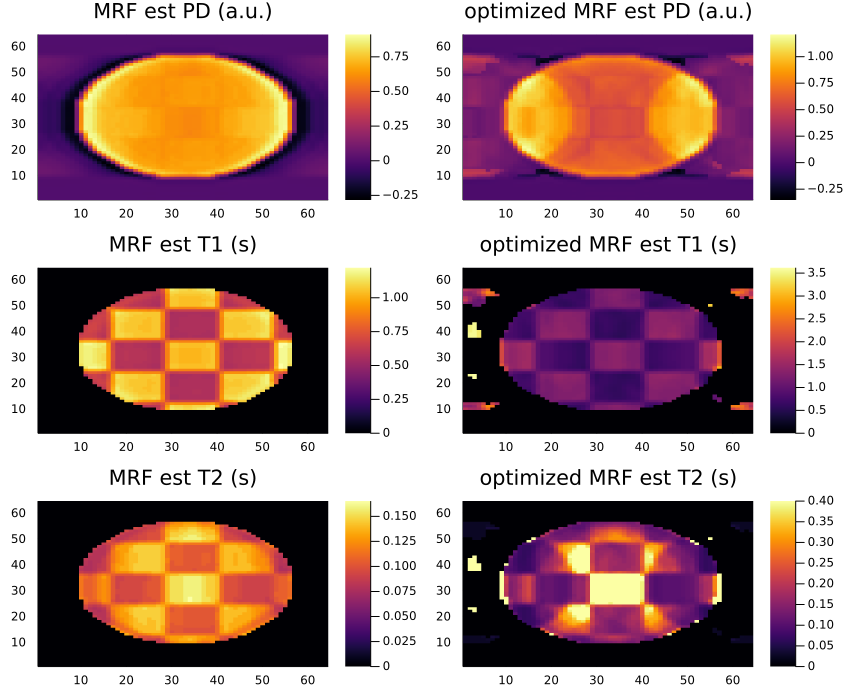

nImagesPerWorker and iFirstImagePerWork:
[100, 100, 100, 100]
[1, 101, 201, 301, 401]
transposition done


In [57]:
# UnconstrainedResults = Dict{String, Dict{Any, Any}}()
# BoundedResults = Dict{String, Dict{Any, Any}}()
# TotalSamples = 70
# for i = tqdm(1:TotalSamples)
#     random_guess =  rand(TheFloatType, nSamples)
#     UnconstrainedResults["fit$i"] = SciPy.optimize.least_squares(Compute_OverallResidual, random_guess, verbose=2)
#     BoundedResults["fit$i"] = SciPy.optimize.least_squares(Compute_OverallResidual, random_guess,
#         verbose=2, bounds=(-1.0, 1.0))
# end

#load(filename,  ("sol", "intial_k", "m1", "m2"))
#optimal_kappas = load("fit1_SciPy.jld", "sol")
#Compute_MrfEstimates_withScaling(optimal_kappas)
# Compute_MrfEstimates_withScaling(load("fit1_lmfit.jld", "sol"))

## some draft stuff

  ReN_Inverse = Array{TheFloatType}(undef, 3, 3)
 Compute_ReN_Inverse(ReN_Inverse, rand_k, coefficientsABC, TheFloatType)
 νⱼ¹ , νⱼ²,  νⱼ³, νⱼ⁰ = Compute_ν(signalM , ReN_Inverse, coefficientsABC, TheFloatType; p=1)


 test_V1 = Array{TheFloatType, 2}(undef, m1*m2, nSamples)
 test_V1 .= hcat([lambda_0[i] .* PSF_coefficients[:, i] .* νⱼ⁰ for i = 1:(m1*m2)]...)'
 test_V1
 unique(test_V1, dims=1)


 ZetaGroups_lambda0 = [i for zeta = values(zeta_groupsRepr_lambda0) for i = zeta] 
 nZetaGroups_lambda0 = length(ZetaGroups_lambda0)  
 test_V2 = Array{TheFloatType, 2}(undef, nZetaGroups_lambda0, nSamples)
 test_V2 .= hcat([lambda_0[i] .* PSF_coefficients[:, i] .* νⱼ⁰ for i = ZetaGroups_lambda0]...)'
 test_V2

 println("distance from i2_0 line")
 println([abs(i-i2_0) for i = [if i%64 != 0 div(i, 64)+1 else div(i, 64) end for i in ZetaGroups_lambda0]])
 unique(test_V2, dims=1)
 
 #function to compute cartesian product of two vectors
#Cartesian_product(x, y) = permutedims(Iterators.product(x, y) |> collect)
#all_kSpace_coords = Cartesian_product(mriKParCartesian[1].kAxis1, mriKParCartesian[1].kAxis2)
 
 p1 = plot(1:nSamples, results_unconstrained["fit1"]["x"], label="fit1")
 p2 = plot(1:nSamples, results_bounded["fit1"]["x"], label="fit1")
 p3 = violin(["fit1"], results_unconstrained["fit1"]["x"], label = "fit1")
 p4 = violin(["fit1"], results_bounded["fit1"]["x"], label="fit1")

 for i = 2:20
     key = "fit$i"
#     #println("printing for $key")
     plot!(p1, results_unconstrained[key]["x"], label=key)
     plot!(p2, results_bounded[key]["x"], label=key)
     violin!(p3, [key], results_unconstrained[key]["x"], label = key)
     violin!(p4, [key], results_bounded[key]["x"], label=key)
 end
 title!(p1, "unconstrained optimization")
 title!(p3, "unconstrained optimization")
 title!(p2, "bounded optimization")
 title!(p4, "bounded optimization")
 plot(p1, p2, p3, p4, layout = (2, 2), legend = :outertopright, size = (950,700), 
     ylabel="\$\\kappa\$" , plot_title = "\$\\kappa\\textrm{\\ values}\$")



#### Error when Using Automatic Differentiation (to compare with FD scheme)

using ForwardDiff

f(x::Vector) = sum(sin, x) + prod(tan, x) * sum(sqrt, x);

x = rand(5) # small size for example's sake
f(x)

ForwardDiff.gradient(f, x)

function f1(x)                                  #(x::AbstractVector{T}) where T
    signalM_2 = Array{Complex{TheFloatType}}(undef, nSamples) 
    MriSim2.SimT1T2M0(signalM_2, simObj, x[1], x[2], x[3], otherPar)
    #just extracting the 1st signal (M₁)
    return signalM_2[1]
end

θ₀ = [log(1.0) , log(0.1) , 1.0]
f1(θ₀) #this is M₁

ForwardDiff.gradient(f1, θ₀)
 

#this version works for a specific iShift parameter
 function Compute_K1K2(mriKPar,imageRange)
     # extract some parameters, allocate vecK1,vecK2
     TheFloatType = mriKPar.TheFloatType
     m1 = mriKPar.m1
     m2 = mriKPar.m2
     nK = mriKPar.nK
    
     K1 = fill(TheFloatType[], length(imageRange))      #Array{Array{TheFloatType}}(undef, length(imageRange))
     K2 = fill(TheFloatType[], length(imageRange))        #Array{Array{TheFloatType}}(undef, length(imageRange))
    
     # apply Psf per image in a big loop  
     for j=imageRange
         vecK1 = Array{TheFloatType}(undef, nK)
         vecK2 = Array{TheFloatType}(undef, nK)
         vecWeights = Array{TheFloatType}(undef, nK)

         MriK4.GetMriK(mriKPar, j, vecK1, vecK2, vecWeights)
         K1[j] = vecK1
         K2[j] = vecK2
     end
     return K1, K2
 end

#using the 1st k-space sampling object corresponding to iShift=1
 k1, k2 = Compute_K1K2(mriKParCartesian[1], 1:nSamples);
 k_coords = Array{Vector{Tuple{TheFloatType, TheFloatType}}}(undef, nSamples)

 for i = 1:nSamples
     k_coords[i] = [(j,k) for (j,k) = zip(k1[i],k2[i])]
 end

 
 lambda_0_lines = fill(0.0, m2)
 for (idx, _) in enumerate(lambda_0_lines)
     if idx == i2_0
         lambda_0_lines[idx] = 1.0
     else
         lambda_0_lines[idx] = abs(1/(idx-i2_0))
     end
 end
 
 unique_zetas_lamb0_dict = Dict{Int64, Int64}()
 for u = unique_zetas_lamb0
     line_idx = u%m1
     if line_idx == 0
         line_idx = m1
     end
     unique_zetas_lamb0_dict[u] = line_idx
     println("line idx for zeta=$u: $line_idx")
 end



λ₀ = Dict{Tuple{TheFloatType, TheFloatType}, TheFloatType}()
for i = 1:size(all_kSpace_coords)[1]
    if i == i2_0
        for j = all_kSpace_coords[i,:]
            λ₀[j] = 1
        end
    else
        for j = all_kSpace_coords[i,:]
            λ₀[j] = abs(1/(i-i2_0))
        end
    end
end


#global variables: 
#1. TheFloatType
#2. signalM
#3. coefficientsABC
#4. K_sj_dict
#5. all_kSpace_coords
#6. λ₀

function Compute_Residual(κ)
    #compute all the required coefficients
    ReN_Inverse = Array{TheFloatType}(undef, 3, 3)
    Compute_ReN_Inverse(ReN_Inverse, κ, coefficientsABC, TheFloatType)
    Yⱼ = Compute_Yⱼ(K_sj_dict, all_kSpace_coords, TheFloatType)
    νⱼ¹ , νⱼ²,  νⱼ³, νⱼ⁰ = Compute_ν(signalM , ReN_Inverse, coefficientsABC, TheFloatType; p=1)
    ν_dict = Dict([(0, νⱼ¹) , (1, νⱼ²),  (2, νⱼ³), (3, νⱼ⁰)])
    λ_dict = Dict([(0, 1), (1 ,1), (2, 1)])
    
    nKlocs = size(Yⱼ)[2]  # index M in ζ_M
    nSnaps = length(signalM) # index Nᵢ
    κ² = κ .^ 2
    
    #initialize the residual vector
    V = Vector{Complex{TheFloatType}}(undef, nKlocs*4)
    cntr = 1
    #λ₁, λ₂, λ₃, λ₀ = 1, 1, 1, 1
    
    for k = 1:nKlocs*4
        k_mod = k%nKlocs
        k_div = div(k, nKlocs)
        if k_mod == 0
            k_mod = nKlocs
            k_div = k_div - 1
        end
        if k_div==3
            lambda_factor = λ₀[all_kSpace_coords[k_mod]]
        else
            lambda_factor = λ_dict[k_div]
        end
        V[k] = lambda_factor*sum(broadcast(i -> κ²[i]*Yⱼ[i,k_mod]*ν_dict[k_div][i] , 1:nSnaps))
        
    end
    #remove identical error terms
    println("[INFO:] completed calculating residuals")
    return unique(V)
end
 
 
 
 function Compute_K1K2(mriKPar,imageRange, SubSampling_factor)
     # extract some parameters, allocate vecK1,vecK2
     TheFloatType = mriKPar[1].TheFloatType
     m1 = mriKPar[1].m1
     m2 = mriKPar[1].m2
     nK = mriKPar[1].nK
    
     K1 = fill(TheFloatType[], length(imageRange))      #Array{Array{TheFloatType}}(undef, length(imageRange))
     K2 = fill(TheFloatType[], length(imageRange))        #Array{Array{TheFloatType}}(undef, length(imageRange))
    
     # apply Psf per image in a big loop  
     for j=imageRange 
         mod_idx = j % SubSampling_factor 
         if mod_idx == 0
             mod_idx = SubSampling_factor
         end 
         vecK1 = Array{TheFloatType}(undef, nK)
         vecK2 = Array{TheFloatType}(undef, nK)
         vecWeights = Array{TheFloatType}(undef, nK)
         MriK4.GetMriK(mriKPar[mod_idx], j, vecK1, vecK2, vecWeights)
         K1[j] = vecK1
         K2[j] = vecK2
     end
     return K1, K2
 end

#using all the k-space sampling objects
 k1, k2 = Compute_K1K2(mriKParCartesian, 1:nSamples, nSubSampling);
 k_coords = Array{Vector{Tuple{TheFloatType, TheFloatType}}}(undef, nSamples)

 for i = 1:nSamples
     k_coords[i] = [(j,k) for (j,k) = zip(k1[i],k2[i])]
 end


#Take column j=1 of i2Lines
#The numbers in i2Snapshot1 indicate the nonzero lines in K_s,1 

i2Snapshot1 = mriKParCartesian[1].i2Lines[:,1]

K_s1 = zeros(128, 128*400)

for (idx, k) in enumerate(i2Snapshot1) 
    K_s1[:, k + (128*(idx-1))] .= 1.0
end

#K_sj = zeros(m1,m2)

K_sj = zeros(m1, m2*nSamples, nLinesPerSnapshot)

for j=1:nLinesPerSnapshot
    i2SnapshotJ = mriKParCartesian[1].i2Lines[:,j] 
    #The numbers in i2SnapshotJ indicate the nonzero lines in K_s,j     
    for (idx, k) in enumerate(i2SnapshotJ) 
        K_sj[:, k + (m2*(idx-1)), j] .= 1.0
    end
end

function window(k_sj, i2Lines, timeindex, group_for_zeta, m2, FloatType)
    #returns k_sj for a specific zeta group
    
    (nSnapshots, timeindexJ) = size(i2Lines)
    
    all_zetas = i2Lines[:,group_for_zeta]
    matrix_k_sj = k_sj[:,:,timeindex]
    
    all_zeta_idxs = all_zetas .+ [(idx-1)*m2 for idx = 1:nSnapshots]
    return_val = Array{Array{FloatType}}(undef, nSnapshots)
    
    for (i,idx) in enumerate(all_zeta_idxs)
        return_val[i] = matrix_k_sj[:,idx]
    end
    
    return return_val
end

function Get_K_sj_at_zeta(ζ, k_sj, j, all_kSpace_coords; sum_over_js = false)
    cartesian_idx = findall(x -> x == ζ, all_kSpace_coords)
    @assert length(cartesian_idx)==1 "multiple indexes found. Aborting!!"
    
    val_at_specific_j = k_sj[:,:,j][cartesian_idx[1]]
    summed_vals = 0.0
    return_dict = Dict([("value", val_at_specific_j)])
    
    if sum_over_js
        nSamples = size(k_sj)[3]
        for each_j = 1:nSamples
            summed_vals += k_sj[:,:,each_j][cartesian_idx[1]]
        end
        return_dict["summed_value"] =  summed_vals
    end
    
    return return_dict
end


#To get the K_s,1, take column 1 of i2 lines. 

i2Snapshot1 = mriKParCartesian[1].i2Lines[1, :]

#The numbers in i2Snapshot1 indicate the nonzero lines in K_s,1
#K_s,1 is 1 if k_x, k_y were sampled at time index(snapshot index) j=1

K_s1 = zeros(128, 128)

for k in i2Snapshot1
  K_s1[:, k] .= 1.0
end

K_s1

 K_sj = zeros(m1, m2, nSamples)

 for j=1:nSamples
     i2SnapshotJ = mriKParCartesian[1].i2Lines[j, :] 
     #The numbers in i2SnapshotJ indicate the nonzero lines in K_s,j     
     for k in i2SnapshotJ 
         K_sj[:, k, j] .= 1.0
     end
 end
 
 y_j = Compute_Yⱼ(K_sj_dict, all_kSpace_coords, TheFloatType)
unique_y_j = unique(y_j, dims=1)

#Group_Array(mriKParCartesian[1].i2Lines[:,1])
#findall(x->y_j[x,:]==y_j[1,:], 1:400)

common_dict = Dict{Int, Vector{Int}}()
for i = 1:size(unique_y_j)[1]
    common_dict[i] = findall(x -> y_j[x,:]== unique_y_j[i, :], 1:400)
end

for (k,v) in common_dict
    println(k)
    println("length:$(length(v))")
end


#V = Compute_Residual(κ₀) 
#fit = LsqFit.lmfit(Compute_Residual, κ₀, Float64[])

#using ADNLPModels, JSOSolvers
#initial guess
#kappa0 = fill(1.0, nSamples)

#define the nonlinear least squares model
nls = ADNLSModel(Compute_Residual,         #residual function
                 kappa0,                   #initial guess
                 64)     

#using 'trunk' solver
#output = trunk(nls)

     for j=1:nSnaps
         νⱼ¹[j] = βₚ₁*A_abs2[j] + βₚ₂*A[j]*B_conj[j] + βₚ₃*A[j]*C_conj[j]
         νⱼ²[j] = βₚ₁*A_conj[j]*B[j] + βₚ₂*B_abs2[j] + βₚ₃*B[j]*C_conj[j]
         νⱼ³[j] = βₚ₁*A_conj[j]*C[j] + βₚ₂*B_conj[j]*C[j] + βₚ₃*C_abs2[j]
         νⱼ⁰[j] = M₀[j]*(βₚ₁*A_conj[j] + βₚ₂*B_conj[j] + βₚ₃*C_conj[j])
     end
     
##SANITY Check
 data = Array{Int64, 2}(undef, nSamples, 2)

 for i =1:nSamples
     groups = Group_Array(y_j[i,:])
     @assert length(groups) == 2 "[WARNING:]Length for index($i) = ($length(groups))" 
    
     data[i,1] = length(groups[1])
     data[i,2] = length(groups[2])
 end
 #println(data)

# grouping_data = Array{TheFloatType, 2}(undef, m1*m2, nSamples)
# for i =1:nSamples
#     groups = Group_Array(y_j[i,:])
#     L1 = length(groups[1]) 
#     L2 = length(groups[2])
#     if L1>L2
#         grouping_data[1:L1, i] .= fill(-1.0, L1)
#         grouping_data[L1+1:end, i] .= fill(1.0, L2)
#     else
#         grouping_data[1:L1, i] .= fill(1.0, L1)
#         grouping_data[L1+1:end, i] .= fill(-1.0, L2)
#     end
# end

# using DataFrames

# cols = ["s$(i)" for i=1:nSamples]
#grouping_df = DataFrame(grouping_data, Symbol.(cols))

#duplicates = findall(nonunique(grouping_df))
#unique_zetas =  setdiff(1:m1*m2, duplicates)

#x = rand(10, 5)
#xx = [x x[:, 2] x[:, 5]]
#dedup_xx = hcat(unique(eachcol(xx))...)
#broadcast(c->isequal(xx[:, 2], c), eachcol(dedup_xx))
#findall(broadcast(c->isequal(xx[:, 2], c), eachcol(dedup_xx)))
#grouped_idxs = Dict{Int64, Vector{Int64}}()
 for (col_idx, col) = enumerate(eachcol(dedup_xx))
     duplicate_idxs = findall(broadcast(c->isequal(col, c), eachcol(xx)))
     grouped_idxs[col_idx] = duplicate_idxs
 end
 grouped_idxs

 function Compute_Residual_Ver1(κ)
    
     #compute all the required coefficients
     ReN_Inverse = Array{TheFloatType}(undef, 3, 3)
     Compute_ReN_Inverse(ReN_Inverse, κ, coefficientsABC, TheFloatType)
     νⱼ¹ , νⱼ²,  νⱼ³, νⱼ⁰ = Compute_ν(signalM , ReN_Inverse, coefficientsABC, TheFloatType; p=1)
     #Yⱼ = Compute_Yⱼ(K_sj_dict, all_kSpace_coords, TheFloatType)
    
     λ₁ ,λ₂, λ₃ = 1, 1, 1 
     κ² = κ .^ 2
     nZetaGroups = length(zeta_groupsRepr)
     ZetaGroups = values(zeta_groupsRepr)
    
     #length_unique = length(unique_zetas)
     #length_unique_lamb0 = length(unique_zetas_lamb0)
    
     length_V = 3*nZetaGroups + (m1*m2)
    
     #initialize the residual matrix 
     V = Array{TheFloatType, 2}(undef, length_V, nSamples)
     V[1:nZetaGroups, :] .= hcat([λ₁ .* PSF_coefficients[:,i] .* νⱼ¹ for i = ZetaGroups]...)'
     V[nZetaGroups+1:2*nZetaGroups, :] .= hcat([λ₂ .* PSF_coefficients[: ,i] .* νⱼ² for i = ZetaGroups]...)'
     V[2*nZetaGroups+1:3*nZetaGroups, :] .= hcat([λ₃ .* PSF_coefficients[:, i] .* νⱼ³ for i = ZetaGroups]...)'
     V[3*nZetaGroups+1:end, :] .= hcat([lambda_0[i] .* PSF_coefficients[:, i] .* νⱼ⁰ for i = 1:(m1*m2)]...)'
    
    
     for j = 1:nSamples
         V[1:nZetaGroups, j] .= [λ₁*PSF_coefficients[j,i]*νⱼ¹[j] for i = ZetaGroups]
         V[nZetaGroups+1:2*nZetaGroups, j] .= [λ₂*PSF_coefficients[j,i]*νⱼ²[j] for i = ZetaGroups]
         V[2*nZetaGroups+1:3*nZetaGroups, j] .= [λ₃*PSF_coefficients[j,i]*νⱼ³[j] for i = ZetaGroups]
         V[3*nZetaGroups+1:end, j] .= [lambda_0[i]*PSF_coefficients[j,i]*νⱼ⁰[j] for i = 1:(m1*m2)]
     end
    
     residual = V * κ²
     println("[INFO:] completed calculating residuals")
     return residual   
 end
 
  function Compute_ν_Ver2(M₀, ReN_Inv, jacM, FloatType; p=1)
     conjJacM = conj(jacM)
     νⱼ¹ = Array{Complex{FloatType}}(undef, nSamples) 
     νⱼ² = Array{Complex{FloatType}}(undef, nSamples)
     νⱼ³ = Array{Complex{FloatType}}(undef, nSamples)
     νⱼ⁰ = Array{Complex{FloatType}}(undef, nSamples)
    
     for (idx, row) = enumerate(eachrow(conjJacM))
         scaled_row = betas .* row
         νⱼ¹[idx] = BLAS.dotu(3, fill(jacM[:, 1][idx], 3), 1, scaled_row, 1)
         νⱼ²[idx] = BLAS.dotu(3, fill(jacM[:, 2][idx], 3) , 1, scaled_row, 1)
         νⱼ³[idx] = BLAS.dotu(3, fill(jacM[:, 3][idx], 3), 1, scaled_row, 1)
         νⱼ⁰[idx] = BLAS.dotu(3, fill(M₀[idx], 3), 1, scaled_row, 1)
     end
    
     return real.(νⱼ¹) , real.(νⱼ²),  real.(νⱼ³), real.(νⱼ⁰)
 end

 @btime Compute_ν_Ver2(signalM, ReN_Inverse, JacobianM_atθ₀ , TheFloatType; p=1)
 
  grouping_withlambda0 = Array{Float64, 2}(undef, m1*m2, 400)
 lambda0_factors = vcat(fill(lambda_0[:,1], m1)...)

 for i =1:nSamples
     groups = Group_Array(y_j[i,:])
     L1 = length(groups[1]) 
     L2 = length(groups[2])
     if L1>L2
         grouping_withlambda0[1:L1, i] .= fill(-1.0, L1)
         grouping_withlambda0[L1+1:end, i] .= fill(1.0, L2)
     else
         grouping_withlambda0[1:L1, i] .= fill(1.0, L1)
         grouping_withlambda0[L1+1:end, i] .= fill(-1.0, L2)
     end 
    
     grouping_withlambda0[:, i] = lambda0_factors .* grouping_withlambda0[:, i]
 end

 grouping_withlambda0_df = DataFrame(grouping_withlambda0, Symbol.(cols))
 duplicates_lamb0 = findall(nonunique(grouping_withlambda0_df))
 unique_zetas_lamb0 =  setdiff(1:m1*m2, duplicates_lamb0)
 
  function Compute_Residual(κ)
    
     #compute all the required coefficients
     ReN_Inverse = Array{TheFloatType}(undef, 3, 3)
     Compute_ReN_Inverse(ReN_Inverse, κ, coefficientsABC, TheFloatType)
     νⱼ¹ , νⱼ²,  νⱼ³, νⱼ⁰ = Compute_ν(signalM , ReN_Inverse, coefficientsABC, TheFloatType; p=1)
     Yⱼ = Compute_Yⱼ(K_sj_dict, all_kSpace_coords, TheFloatType)
    
     λ₁ ,λ₂, λ₃ = 1, 1, 1 
     nSnaps = length(signalM) # no of snapshots (j)
     κ² = κ .^ 2
     length_unique = length(unique_zetas)
     length_unique_lamb0 = length(unique_zetas_lamb0)
    
     length_V = 3*length_unique + length_unique_lamb0
    
     #initialize the residual matrix 
     V = Array{TheFloatType, 2}(undef, length_V, nSnaps)
     for j = 1:nSnaps 
         V[1:length_unique, j] .= [λ₁*Yⱼ[j,i]*νⱼ¹[j] for i = unique_zetas]
         V[length_unique+1:2*length_unique, j] .= [λ₂*Yⱼ[j,i]*νⱼ²[j] for i = unique_zetas]
         V[2*length_unique+1:3*length_unique, j] .= [λ₃*Yⱼ[j,i]*νⱼ³[j] for i = unique_zetas]
         V[3*length_unique+1:end, j] .= [lambda_0[i]*Yⱼ[j,i]*νⱼ⁰[j] for i = unique_zetas_lamb0]
     end
    
     residual = V * κ²
     println("[INFO:] completed calculating residuals")
     return residual   
 end
 
  h = 1e-4
 θ₀ = [logT1Ref, logT2Ref, PDRef]

 coefficientsABC = Array{Array{Complex{TheFloatType}}}(undef, 3)

 for i = 1:3
     θ = copy(θ₀)
     θ[i] =  θ₀[i] .+ h
     signalM_2 = Array{Complex{TheFloatType}}(undef, nSamples)
     MriSim2.SimT1T2M0(signalM_2, simObj, θ[1], θ[2], θ[3], otherPar)
     coefficientsABC[i] = (signalM_2 - signalM)/h
 end

 coeffABC = hcat(coefficientsABC...)
 inv(real.(transpose(conj(coeffABC)) * coeffABC))


 function Compute_ReN_Inverse_V3(Matrix_ReN_Inv, κ, coefficents, FloatType)
     ReN_Inv = view(Matrix_ReN_Inv, :, :)
     N = Array{Complex{FloatType}}(undef, 3, 3)
    
     A, B, C = coefficents[1], coefficents[2], coefficents[3]
     κ² = κ .^ 2
     A_abs2, B_abs2, C_abs2 = abs2.(A), abs2.(B), abs2.(C)
     A_conj, B_conj, C_conj = conj.(A), conj.(B), conj.(C)
    
     N[1,1] = sum(κ² .* A_abs2)
     N[1,2] = sum(κ² .* A_conj .* B)
     N[1,3] = sum(κ² .* A_conj .* C)
     N[2,1] = sum(κ² .* A .* B_conj)
     N[2,2] = sum(κ² .* B_abs2)
     N[2,3] = sum(κ² .* B_conj .* C)
     N[3,1] = sum(κ² .* A .* C_conj)
     N[3,2] = sum(κ² .* B .* C_conj)
     N[3,3] = sum(κ² .* C_abs2)
    
    
     ReN_Inv .= inv(real.(N))
    
     return nothing
 end

 random_kappa = rand(TheFloatType, nSamples)
 test = Array{TheFloatType}(undef, 3, 3)
 @btime Compute_ReN_Inverse_V3(test, random_kappa, coefficientsABC, TheFloatType)

# below section from original notebook 

## Domain size


In [ ]:
# domain size in paper was 128x128
# needs to big enough to be "relevant"
# on the other hand, smaller values make the computations more feasible
m1 = 128
m2 = 128

## k-space sampling
$k$-space sampling has two main choices
1. type of sampling: Cartesian, radial, spiral
2. subsampling ratio (per image). Something like 16 or 32 is a good choice.

**Note that Cartesian MRF leads to large errors, so is not used in practice,
because sampling near k=0 must be more frequent than away from 0.**

**IDEA: use a modified Cartesian sampling in the paper otherwise use radial or spiral
(radial slightly preferred)**



In [ ]:
using MriK4

In [ ]:
# RADIAL SAMPLING

# set parameter for amount of subsampling 
# used to compute number of lines per snapshot in case of radial sampling 
nSubSampling = 16

# compute an MriKRadial object and add to the mriKPar list
nLinesPerSnapshot = div(m2,nSubSampling)
angleOffset = collect(0:nInterval-1) .* TheFloatType( 111.25 * pi/180 )
mriKParRadial = MriK4.MriKRadial(TheFloatType,m1,m2,nLinesPerSnapshot,angleOffset)

#(from file `Example3/Setup_MriK11.jl`)

In [ ]:
# SPIRAL SAMPLING

#(to be done: `Example3/Setup_MriK12.jl`)

# CARTESIAN SAMPLING

In [ ]:
# multiple k-space sampling objects: empty array of k-space sampling objects
mriKParCartesian = Array{Any}(undef, 0)

# fixed choice of subsampling parameter
nSubSampling = 16

# number of lines in snapshot
nLinesPerSnapshot = div(m1,nSubSampling)

# iShift refers to the position of the first line
# each subsequent snapshot, the pattern is shifted by 1
for iShift = 1:nSubSampling
    i2Lines = [ 1+mod(-1+iShift+j+nSubSampling*k,m2) for
                j=1:nInterval, k=0:nLinesPerSnapshot-1 ]
    theMriK = MriK4.MriKCartesian(TheFloatType,m1,m2,i2Lines)
    push!(mriKParCartesian,theMriK)
end

#(from file `Example3/Setup_MriK13.jl`)

In [ ]:
# some plots !!!

# select which from the previous examples is plotted
# (note that mriKParCartesian is an array, while I have given a single 
# mriKPar instance for the radial case)
theMriK = mriKParRadial
#theMriK = mriKParCartesian[1]

# extract some info
TheFloatType = theMriK.TheFloatType
nInterval = theMriK.nInterval
nK = theMriK.nK

# allocate arrays
vecK1 = zeros(TheFloatType,nK)
vecK2 = zeros(TheFloatType,nK)
vecWeights = zeros(TheFloatType,nK)

# select an interval
iInterval = 1

# get data
MriK4.GetMriK(theMriK, iInterval, vecK1, vecK2, vecWeights)

plot1 = plot(vecK1, title = "vecK1")
display(plot1)

plot2 = plot(vecK2, title = "vecK2")
display(plot2)

plot3 = plot(vecK1, vecK2, title="(vecK1,vecK2)", seriestype = :scatter)
display(plot3)


plot4 = plot(vecWeights, title = "vecWeights")

## Choice of "true" parameter maps, called medium

In the simulation, we make a choice for the "true" parameter maps. This will be called the medium or mediumparameters.





In [ ]:
# coordinate range in medium
iRange1 = -div(m1,2) .+ (0:m1-1)
iRange2 = -div(m2,2) .+ (0:m2-1)

# indicator function of a disk: 1 inside a disk of given radius, 0 outside
radius = 0.75 * m1/2
fWin(i1,i2) = one(TheFloatType) * ( i1^2 + i2^2 - radius.^2 < 0 )

# values of the indicator function
winValues = [ fWin(i1,i2) for i1 in iRange1, i2 in iRange2 ]

using ExampleImages2

(tmpT1, tmpT2, tmpPD) =
    ExampleImages2.CheckerBoardMedium(
        m1, m2, 12, 0, 4,
        TheFloatType.([ 0.75, 1.25 ]), 
        TheFloatType.([ 0.07, 0.09 ]), 
        TheFloatType.([1.0, 1.0]) )

mediumLogT1 = log.(tmpT1)
mediumLogT2 = log.(tmpT2)
mediumPD    = winValues;

## Note about plotting the T1, T2, PD maps

**The plots of `t1Map` and `t2Map` below are not up to standards, they should be black were proton density is zero (outside the circle where proton density is 1).**

**In Chris' folder Examples4, file PlotExamples.jl there is a function ImShowMaskedJetLower, where this is fixed.**

In [ ]:
# plot PD map
display(heatmap(mediumPD, title="PD (a.u.)"))

# plot T1 map
display(heatmap(exp.(mediumLogT1), title="T1 (s)"))

# plot T2 map
display(heatmap(exp.(mediumLogT2), title="T2 (s)"))



## Experimenting with windowing

In [ ]:
using ColorSchemes
import ColorSchemes.leonardo

In [ ]:
n=32
img = get(colorschemes[:leonardo], rand(n,n)) # displays in Juno Plots window, but

plot(img)

In [ ]:
println(typeof(img))

ApplyWindowToPixel(winVal, colorVal1, colorVal2) = (winVal ? colorVal1 : colorVal2)

# a window for a circle in the middle of an n x n square
radius = 0.35 * n
boolWindow = [ (i1-(n+1)/2)^2 + (i2-(n+1)/2)^2 < radius^2 for i1=1:n, i2=1:n]

myRed = RGB{Float64}(1.0,0.0,0.0)
plot(ApplyWindowToPixel.( boolWindow, img, myRed ))

# Voxel signals

We start with computation and save to file. Then load the saved data and make some plots

## Computation of voxel signals



In [ ]:
# from (.../MriMrf/TestExample2/Example4/Generate_VoxelSignals_Main2.jl

# modified

# the following not imported before apparently
@everywhere using MriSim2

filenameVoxelSignals = "voxelSignals_test1.jld"
keyVoxelSignals = "voxelSignals"

if taskVoxelSignalSimulation
    #
    # WE MUST USE A SharedArray HERE !!! (from module SharedArrays)
    #
    voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)

    # simulate per-voxel signals
    MriSim2.SimT1T2M0_transp(theWorkers, simObj, mediumLogT1, mediumLogT2, mediumPD, otherPar, voxelSignals)

    # save data, N.B. save the underlying array object
    save("voxelSignals_test1.jld", keyVoxelSignals, SharedArrays.sdata(voxelSignals))
end

## Testing: plot some stuff from the array of voxel signals

In [ ]:
# load stuff from disk again, then plot a snapshot and a trace for testing

# load from saved file
keyVoxelSignals = "voxelSignals"
tmp = load("voxelSignals_test1.jld", keyVoxelSignals)

# take imaginary part, display this
iSomeSnapshot = 150
someSnapshot = tmp[:,:,iSomeSnapshot]
plotSignalImage = heatmap(imag.(someSnapshot), title="some snapshot")
display(plotSignalImage)

# also plot a trace
iSomeTrace1 = 64
iSomeTrace2 = 64
someTrace = tmp[iSomeTrace1, iSomeTrace2, :]
plotSomeTrace = plot(1:nSamples,imag.(someTrace))
display(plotSomeTrace)

# MRF dictionary

Fixed a problem with `useLogPar`, now this is set to true.


In [ ]:
using MrfImaging2

# dictionary T1 axis
t1L = log(0.2)
t1H = log(4.0)
# nT1 = 600
nT1 = 150
# nT1 = 20
t1DictAxis = collect(range(t1L,stop=t1H,length=nT1))

# dictionary T2 axis
t2L = log(0.025)
t2H = log(0.400)
# nT2 = 280
nT2 = 70
# nT2 = 15
t2DictAxis = collect(range(t2L,stop=t2H,length=nT2))

# create arrays for t1Dict, t2Dict
t1DictArray = SharedArray{TheFloatType}(nT1,nT2)
t2DictArray = SharedArray{TheFloatType}(nT1,nT2)
t1DictArray[:,:] = repeat(  t1DictAxis, outer = (1,nT2) )
t2DictArray[:,:] = repeat(  reshape(t2DictAxis,1,nT2), inner = (nT1,1) )

# dictionary filename
filenameDictionary = "test1_dictionary.jld"

if taskDictionarySimulation
    # create dictionary and norms info
    # allocate space for dictionary signals and one-over-norms
    dictSignal = SharedArray{Complex{TheFloatType}}(nSamples,nT1,nT2)
    dictOneOverNorms = SharedArray{TheFloatType}(nT1,nT2)
    # simulation of dictionary signals and "oneOverNorms"
    # # DISTRIBUTED: ERROR
    # MrfImaging2.SimT1T2(
    #     workers(),simObj,t1DictArray,t2DictArray,otherPar,
    #     dictSignal,dictOneOverNorms)

    MrfImaging2.SimT1T2( simObj, reshape(t1DictArray, nT1*nT2),
        reshape(t2DictArray, nT1*nT2), otherPar, 
        reshape(dictSignal, nSamples, nT1*nT2), reshape(dictOneOverNorms, nT1*nT2) )

    # save result to disk
    fid = jldopen(filenameDictionary,"w")
    write(fid, "dictSignal", SharedArrays.sdata(dictSignal))
    write(fid, "dictOneOverNorms", SharedArrays.sdata(dictOneOverNorms))
    close(fid)
end

In [ ]:
# load dictionary 
dictSignal = SharedArray{Complex{TheFloatType}}(nSamples, nT1, nT2)
dictOneOverNorms = SharedArray{TheFloatType}(nT1, nT2)
fid = jldopen(filenameDictionary)
dictSignal .= read(fid, "dictSignal")
dictOneOverNorms .= read(fid, "dictOneOverNorms")
println("load dictionary done")

# MRF estimates

## MRF TESTING


In [ ]:
scaledInnerProducts = dictOneOverNorms .*[ LinearAlgebra.dot(dictSignal[:,iT1,iT2], signalM[:,1]) 
    for iT1=1:nT1, iT2=1:nT2 ]

i = argmax(abs.(scaledInnerProducts))
println("i = $(i)")

theLogT1 = t1DictArray[i]
theLogT2 = t2DictArray[i]
println("t1DictArray logT1 value = $(theLogT1), t2DictArray logT2 Value =$(theLogT2)")
println("exp of these: $(exp(theLogT1)),  $(exp(theLogT2))")

## Point spread functions applied to data

In [ ]:
# apply the "per snapshot" point spread functions 

using ApplyPsfNew2

# filename and key to read jld data
filenameVoxelSignals = "voxelSignals_test1.jld"
#keyVoxelSignals

# k-space sampling object
# error when using cartesian sampling object
#theMriK = mriKParCartesian

theMriK = mriKParRadial

# allocated arrays
voxelSignals = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)
images = SharedArray{Complex{TheFloatType}}(m1, m2, nSamples)

# load data
SharedArrays.sdata(voxelSignals) .= load(filenameVoxelSignals, keyVoxelSignals)

# TESTING
maximum(abs.(voxelSignals))

# # apply Psf to get image from voxelSignals
# # NON-DISTRIBUTED VERSION
# ApplyPsfNew2.ApplyPsf(
#     theMriK, 1:nSamples, voxelSignals, images)

# DISTRIBUTED VERSION: ERROR
ApplyPsfNew2.ApplyPsf(workers(), theMriK, 1:nSamples, voxelSignals, images)

In [ ]:
#using FFTW, DSP

In [ ]:
# take imaginary part, display this
iSomeSnapshot = 150
someSnapshot = images[:,:,iSomeSnapshot]
plotUndersampledImage = heatmap(imag.(someSnapshot), title="undersampled PSF convolved")
display(plotUndersampledImage)

someSnapshot = images[:,:,iSomeSnapshot]
plotVoxelSignalsImage = heatmap(imag.(voxelSignals[:,:,iSomeSnapshot]), 
    title="reference from voxel signals")
display(plotVoxelSignalsImage)

## MRF estimates

In [ ]:
inputData = images

# change ordering of array axes (in following time is fast axis)
imagesByTrace = SharedArray{Complex{TheFloatType}}(nSamples, m1, m2)

# transpose to go to new form
imagesReshaped  = reshape(inputData, m1*m2, nSamples)
imagesByTraceReshaped = reshape(imagesByTrace, nSamples, m1*m2)
LinearAlgebra.transpose!(imagesByTraceReshaped, imagesReshaped)
println("transposition done")

In [ ]:
# load dictionary 
dictSignal = SharedArray{Complex{TheFloatType}}(nSamples, nT1, nT2)
dictOneOverNorms = SharedArray{TheFloatType}(nT1, nT2)
fid = jldopen(filenameDictionary)
dictSignal .= read(fid, "dictSignal")
dictOneOverNorms .= read(fid, "dictOneOverNorms")
println("load dictionary done")

In [ ]:
# ref Amplitude: effect of point spread function 
# (average of undersampled point spread functions)
onesImage = ones(Complex{TheFloatType},m1,m2)
refAmplitudeCp = Array{Complex{TheFloatType}}(undef, m1,m2)

# generate amplitudes C_P from notes
ApplyPsfNew2.AccumPsf(
    workers(), theMriK, 1:nInterval, onesImage, refAmplitudeCp)
refAmplitudeCp .*= ( 1.0 ./ nInterval )

CpRefValue = refAmplitudeCp[div(m1,2), div(m2,2)]
println("CpRefValue = $(CpRefValue)")

In [ ]:
using MrfImaging2

# allocate space for estimated MRF parameters
estimatedLogT1 = SharedArray{TheFloatType}(m1, m2)
estimatedLogT2 = SharedArray{TheFloatType}(m1, m2)
estimatedPD = SharedArray{TheFloatType}(m1, m2)
estimatedComplexPD = SharedArray{Complex{TheFloatType}}(m1, m2)

# work space: complex inner products in MRF
nDict = nT1 * nT2
nSignalBlockMax = 128
complexInnerProducts =
    SharedArray{Complex{TheFloatType}}(nDict,min(nSignalBlockMax,m1*m2))

# estimate using the dictionary
MrfImaging2.MrfEstimate(
    workers(), dictSignal, t1DictArray, t2DictArray, dictOneOverNorms,
    imagesByTraceReshaped,
    reshape(estimatedLogT1, m1*m2), 
    reshape(estimatedLogT2, m1*m2),
    reshape(estimatedComplexPD, m1*m2),
    complexInnerProducts)

estimatedPD .= real.(estimatedComplexPD ./ CpRefValue);

# filenameMrfEstimates = "test1_mrfEstimates.jld"
# keyMrfEstimates = "mrfEstimatedParameters"
# save(
#     filenameMrfEstimates, keyMrfEstimates, SharedArrays.sdata(estimatedParameters))

In [ ]:
# a window function
eps=0.25
WinFun(x) = ( x>eps ? one(TheFloatType) : zero(TheFloatType) )

# plot PD map
display(heatmap(estimatedPD, title="MRF est PD (a.u.)"))

# plot T1 map
display(heatmap(exp.(estimatedLogT1) .* WinFun.(estimatedPD), title="MRF est T1 (s)"))

# plot T2 map
display(heatmap(exp.(estimatedLogT2) .* WinFun.(estimatedPD), title="MRF est T2 (s)"))


# Draft stuff about ordering inside arrays

In [ ]:
A = zeros(Int, 3, 4)

In [ ]:
A[1,2]

In [ ]:
A[:] = 1:12 ; 
A

In [ ]:
println(A[:,1])


In [ ]:
println(A[1,:])